In [1]:
# Install all libraries
!pip install pandas numpy matplotlib seaborn scikit-learn xgboost shap joblib \
alibi captum pdpbox eli5 imbalanced-learn sdv


Load the dataset

In [2]:
from google.colab import drive
import pandas as pd

# Mount Google Drive
drive.mount('/content/drive')

# Path to your dataset
dataset_path = '/content/drive/MyDrive/Crop_recommendation.csv'

# Load dataset
df = pd.read_csv(dataset_path)

# Preview dataset
print("Shape of dataset:", df.shape)
df.head()


Mounted at /content/drive
Shape of dataset: (2200, 8)


,N,P,K,temperature,humidity,ph,rainfall,label
0,90,42,43,20.879744,82.002744,6.502985,202.935536,rice
1,85,58,41,21.770462,80.319644,7.038096,226.655537,rice
2,60,55,44,23.004459,82.320763,7.840207,263.964248,rice
3,74,35,40,26.491096,80.158363,6.980401,242.864034,rice
4,78,42,42,20.130175,81.604873,7.628473,262.717340,rice


Dataset inspection

In [3]:
# Basic dataset information
print("\nDataset Info:")
print(df.info())

# Check for missing values
print("\nMissing Values per Column:")
print(df.isnull().sum())

# Basic descriptive statistics
print("\nDescriptive Statistics:")
print(df.describe())

# Unique crops in the dataset
print("\nUnique Crops:")
print(df['label'].unique())

# Number of unique crops
print("\nNumber of unique crops:", df['label'].nunique())

# Count of samples per crop
print("\nSamples per Crop:")
print(df['label'].value_counts())




Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2200 entries, 0 to 2199
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   N            2200 non-null   int64  
 1   P            2200 non-null   int64  
 2   K            2200 non-null   int64  
 3   temperature  2200 non-null   float64
 4   humidity     2200 non-null   float64
 5   ph           2200 non-null   float64
 6   rainfall     2200 non-null   float64
 7   label        2200 non-null   object 
dtypes: float64(4), int64(3), object(1)
memory usage: 137.6+ KB
None

Missing Values per Column:
N              0
P              0
K              0
temperature    0
humidity       0
ph             0
rainfall       0
label          0
dtype: int64

Descriptive Statistics:
                 N            P            K  temperature     humidity  \
count  2200.000000  2200.000000  2200.000000  2200.000000  2200.000000   
mean     50.551818    53.362727    48.14

Synthetic data generation

Original dataset shape: (2200, 8)
Number of crops: 22

Training CTGAN for crop: rice

Training CTGAN for crop: maize

Training CTGAN for crop: chickpea

Training CTGAN for crop: kidneybeans

Training CTGAN for crop: pigeonpeas

Training CTGAN for crop: mothbeans

Training CTGAN for crop: mungbean

Training CTGAN for crop: blackgram

Training CTGAN for crop: lentil

Training CTGAN for crop: pomegranate

Training CTGAN for crop: banana

Training CTGAN for crop: mango

Training CTGAN for crop: grapes

Training CTGAN for crop: watermelon

Training CTGAN for crop: muskmelon

Training CTGAN for crop: apple

Training CTGAN for crop: orange

Training CTGAN for crop: papaya

Training CTGAN for crop: coconut

Training CTGAN for crop: cotton

Training CTGAN for crop: jute

Training CTGAN for crop: coffee
Synthetic dataset shape: (4400, 8)
Expanded dataset shape: (6600, 8)

Sample counts per crop:
 label
rice           300
maize          300
jute           300
cotton         300
coconut        300

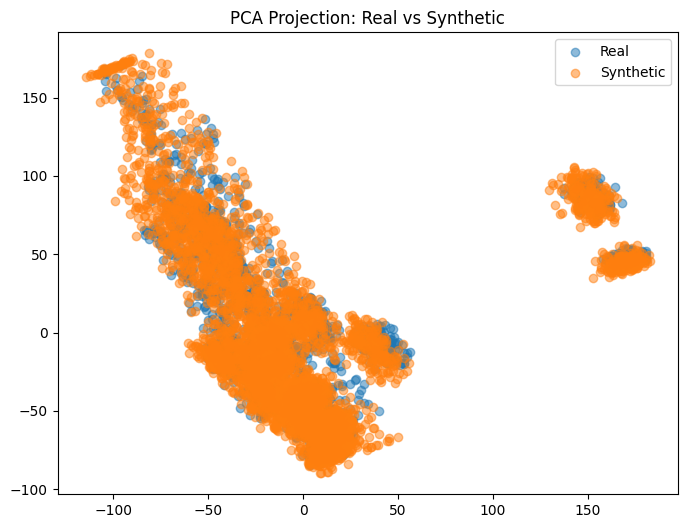


Expanded dataset saved successfully.


In [4]:
# Install package
!pip install ctgan

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from ctgan import CTGAN

# Load dataset
df = pd.read_csv('/content/drive/MyDrive/Crop_recommendation.csv')
df['label'] = df['label'].astype('category')

print("Original dataset shape:", df.shape)
print("Number of crops:", df['label'].nunique())

synthetic_data_list = []

# Train separate CTGAN for each crop
for crop in df['label'].unique():
    crop_df = df[df['label'] == crop].copy().reset_index(drop=True)

    # Drop label column for training — only numeric features remain
    features_only = crop_df.drop(columns=['label'])

    print(f"\nTraining CTGAN for crop: {crop}")
    ctgan = CTGAN(epochs=500, batch_size=20)
    ctgan.fit(features_only)

    # Generate synthetic rows
    synth_crop = ctgan.sample(200)

    # Add the crop label back
    synth_crop['label'] = crop

    synthetic_data_list.append(synth_crop)

# Combine synthetic data
synthetic_df = pd.concat(synthetic_data_list, ignore_index=True)
print("Synthetic dataset shape:", synthetic_df.shape)

# Clip synthetic values to real min/max per feature
for col in df.columns:
    if col != 'label':
        min_val, max_val = df[col].min(), df[col].max()
        synthetic_df[col] = synthetic_df[col].clip(lower=min_val, upper=max_val)

# Combine real + synthetic
expanded_df = pd.concat([df, synthetic_df], ignore_index=True)
print("Expanded dataset shape:", expanded_df.shape)
print("\nSample counts per crop:\n", expanded_df['label'].value_counts())

# Validation: Range check
print("\n[Range Check] Values outside original data range after clipping:")
for col in df.columns:
    if col != 'label':
        min_real, max_real = df[col].min(), df[col].max()
        out_of_range = synthetic_df[(synthetic_df[col] < min_real) | (synthetic_df[col] > max_real)]
        print(f"{col}: {len(out_of_range)} out-of-range values")

# Statistical comparison
print("\n[Statistical Comparison: Real vs Synthetic]")
for col in df.columns:
    if col != 'label':
        print(f"\nFeature: {col}")
        print(f"Real   - Mean: {df[col].mean():.3f}, Std: {df[col].std():.3f}")
        print(f"Synth  - Mean: {synthetic_df[col].mean():.3f}, Std: {synthetic_df[col].std():.3f}")

# PCA overlap visualization
num_features = [c for c in df.columns if c != 'label']
pca = PCA(n_components=2)
real_pca = pca.fit_transform(df.drop(columns=['label']))
synthetic_pca = pca.transform(synthetic_df.drop(columns=['label']))

plt.figure(figsize=(8, 6))
plt.scatter(real_pca[:, 0], real_pca[:, 1], alpha=0.5, label='Real')
plt.scatter(synthetic_pca[:, 0], synthetic_pca[:, 1], alpha=0.5, label='Synthetic')
plt.title("PCA Projection: Real vs Synthetic")
plt.legend()
plt.show()

# Save expanded dataset
expanded_df.to_csv('/content/drive/MyDrive/Crop_recommendation_expanded.csv', index=False)
print("\nExpanded dataset saved successfully.")


All crops binary classificartion model

In [5]:
import pandas as pd
from sklearn.model_selection import train_test_split
import os

# Load expanded dataset
df = pd.read_csv('/content/drive/MyDrive/Crop_recommendation_expanded.csv')

# Directory to save per-crop balanced datasets (optional)
balanced_dir = "/content/drive/MyDrive/crop_balanced_datasets"
os.makedirs(balanced_dir, exist_ok=True)

# List of unique crops
crops = df['label'].unique()
print(f"Number of unique crops: {len(crops)}\n")

# Loop through each crop and create balanced dataset
for crop in crops:
    print(f"Processing crop: {crop}")

    # Create binary target: 1 for current crop, 0 for others
    df['target'] = (df['label'] == crop).astype(int)

    # Separate positive and negative classes
    df_pos = df[df['target'] == 1]
    df_neg = df[df['target'] == 0]

    # Downsample negatives to match positives
    df_neg_down = df_neg.sample(n=len(df_pos), random_state=42)

    # Combine into balanced dataset
    df_balanced = pd.concat([df_pos, df_neg_down], axis=0)\
                    .sample(frac=1, random_state=42)\
                    .reset_index(drop=True)

    # Separate features (X) and target (y)
    X = df_balanced.drop(columns=['label', 'target'])
    y = df_balanced['target']

    # Train/test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, stratify=y, random_state=42
    )

    # Optional: Save balanced dataset for this crop
    save_path = os.path.join(balanced_dir, f"{crop}_balanced.csv")
    df_balanced.to_csv(save_path, index=False)

    # Info printout
    print(f"  Balanced dataset shape: {df_balanced.shape}")
    print(f"  Train shape: {X_train.shape}, Test shape: {X_test.shape}")
    print(f"  Class distribution in Train: {y_train.value_counts(normalize=True).to_dict()}")
    print(f"  Class distribution in Test: {y_test.value_counts(normalize=True).to_dict()}\n")

print("\n All crops processed and balanced datasets saved.")


Number of unique crops: 22

Processing crop: rice
  Balanced dataset shape: (600, 9)
  Train shape: (480, 7), Test shape: (120, 7)
  Class distribution in Train: {0: 0.5, 1: 0.5}
  Class distribution in Test: {0: 0.5, 1: 0.5}

Processing crop: maize
  Balanced dataset shape: (600, 9)
  Train shape: (480, 7), Test shape: (120, 7)
  Class distribution in Train: {0: 0.5, 1: 0.5}
  Class distribution in Test: {0: 0.5, 1: 0.5}

Processing crop: chickpea
  Balanced dataset shape: (600, 9)
  Train shape: (480, 7), Test shape: (120, 7)
  Class distribution in Train: {0: 0.5, 1: 0.5}
  Class distribution in Test: {0: 0.5, 1: 0.5}

Processing crop: kidneybeans
  Balanced dataset shape: (600, 9)
  Train shape: (480, 7), Test shape: (120, 7)
  Class distribution in Train: {0: 0.5, 1: 0.5}
  Class distribution in Test: {0: 0.5, 1: 0.5}

Processing crop: pigeonpeas
  Balanced dataset shape: (600, 9)
  Train shape: (480, 7), Test shape: (120, 7)
  Class distribution in Train: {0: 0.5, 1: 0.5}
  Class

Training xgb, rf and mlp for each crop

In [6]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# ===========================
# 1. Load Dataset
# ===========================
df = pd.read_csv('/content/drive/MyDrive/Crop_recommendation_expanded.csv')

# ===========================
# 2. Helper Function
# ===========================
def evaluate_model(model, X_train, X_test, y_train, y_test):
    """Train & evaluate a classification model."""
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_test)[:, 1]
    else:
        y_proba = model.decision_function(X_test)
    return {
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, zero_division=0),
        "Recall": recall_score(y_test, y_pred, zero_division=0),
        "F1": f1_score(y_test, y_pred, zero_division=0),
        "ROC-AUC": roc_auc_score(y_test, y_proba)
    }

# ===========================
# 3. Models for Balanced Dataset
# ===========================
models_bal = {
    "XGBoost": XGBClassifier(
        n_estimators=300, learning_rate=0.1, max_depth=5,
        subsample=0.8, colsample_bytree=0.8, random_state=42,
        eval_metric='logloss'
    ),
    "SVM": SVC(kernel='rbf', probability=True, random_state=42),
    "MLP": MLPClassifier(hidden_layer_sizes=(50,), max_iter=500, random_state=42)
}

# ===========================
# 4. Storage for Results
# ===========================
results = []

# ===========================
# 5. Loop Through All Crops
# ===========================
for crop in df['label'].unique():
    print(f"\nProcessing crop: {crop}")

    # Create binary target for current crop
    df['target'] = (df['label'] == crop).astype(int)

    # Create balanced dataset
    df_pos = df[df['target'] == 1]
    df_neg = df[df['target'] == 0].sample(n=len(df_pos), random_state=42)
    df_bal = pd.concat([df_pos, df_neg]).sample(frac=1, random_state=42).reset_index(drop=True)

    X_bal = df_bal.drop(columns=['label', 'target'])
    y_bal = df_bal['target']

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X_bal, y_bal, test_size=0.2, stratify=y_bal, random_state=42
    )

    # Train & evaluate each model
    for name, model in models_bal.items():
        metrics = evaluate_model(model, X_train, X_test, y_train, y_test)
        results.append({
            "Crop": crop,
            "Case": "Balanced",
            "Model": name,
            **metrics
        })

# ===========================
# 6. Convert to DataFrame
# ===========================
results_df = pd.DataFrame(results)

# Sort for clarity
results_df = results_df.sort_values(by=["Crop", "ROC-AUC"], ascending=[True, False])

# ===========================
# 7. Save Results
# ===========================
output_path = "/content/drive/MyDrive/crop_model_results_balanced_only.csv"
results_df.to_csv(output_path, index=False)

print(f"\n✅ Final results saved to: {output_path}")
print("\nTop results preview:")
print(results_df.head(10).to_string(index=False))



Processing crop: rice

Processing crop: maize

Processing crop: chickpea

Processing crop: kidneybeans


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(



Processing crop: pigeonpeas

Processing crop: mothbeans

Processing crop: mungbean

Processing crop: blackgram

Processing crop: lentil


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(



Processing crop: pomegranate

Processing crop: banana

Processing crop: mango

Processing crop: grapes

Processing crop: watermelon

Processing crop: muskmelon

Processing crop: apple

Processing crop: orange

Processing crop: papaya

Processing crop: coconut


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(



Processing crop: cotton

Processing crop: jute

Processing crop: coffee

✅ Final results saved to: /content/drive/MyDrive/crop_model_results_balanced_only.csv

Top results preview:
     Crop     Case   Model  Accuracy  Precision   Recall       F1  ROC-AUC
    apple Balanced XGBoost  1.000000   1.000000 1.000000 1.000000 1.000000
    apple Balanced     SVM  0.991667   0.983607 1.000000 0.991736 1.000000
    apple Balanced     MLP  1.000000   1.000000 1.000000 1.000000 1.000000
   banana Balanced XGBoost  1.000000   1.000000 1.000000 1.000000 1.000000
   banana Balanced     SVM  0.991667   0.983607 1.000000 0.991736 1.000000
   banana Balanced     MLP  0.991667   0.983607 1.000000 0.991736 0.993611
blackgram Balanced XGBoost  0.991667   1.000000 0.983333 0.991597 1.000000
blackgram Balanced     MLP  0.991667   0.983607 1.000000 0.991736 0.997500
blackgram Balanced     SVM  0.991667   0.983607 1.000000 0.991736 0.992778
 chickpea Balanced XGBoost  1.000000   1.000000 1.000000 1.000000 1.

Shap implementation for each crop


=== Processing crop: rice ===

[Balanced] Training XGBoost for crop: rice


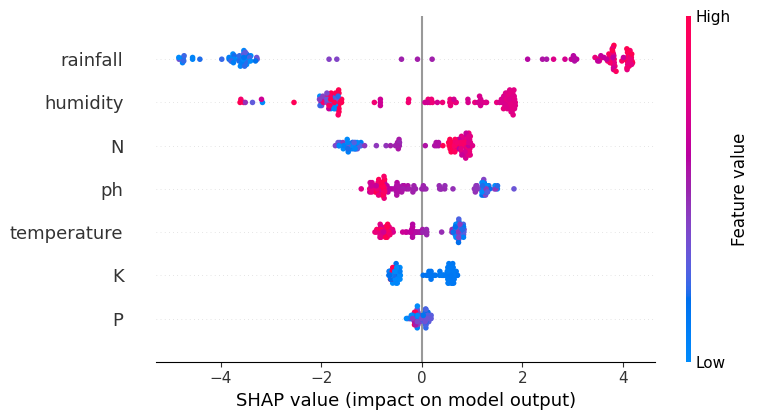

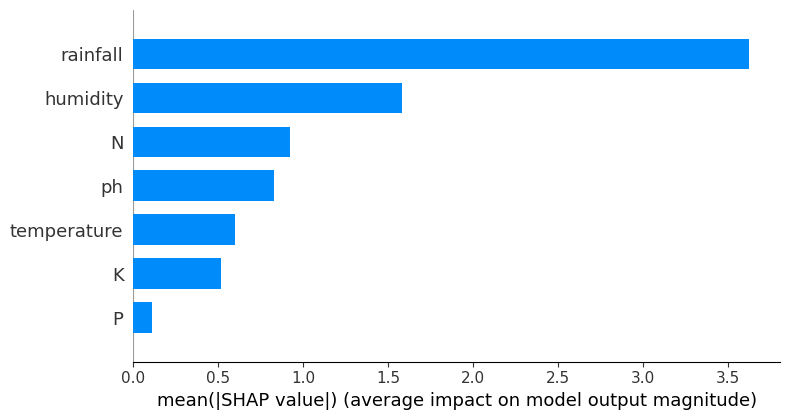


[Balanced] Training SVM for crop: rice


  0%|          | 0/120 [00:00<?, ?it/s]

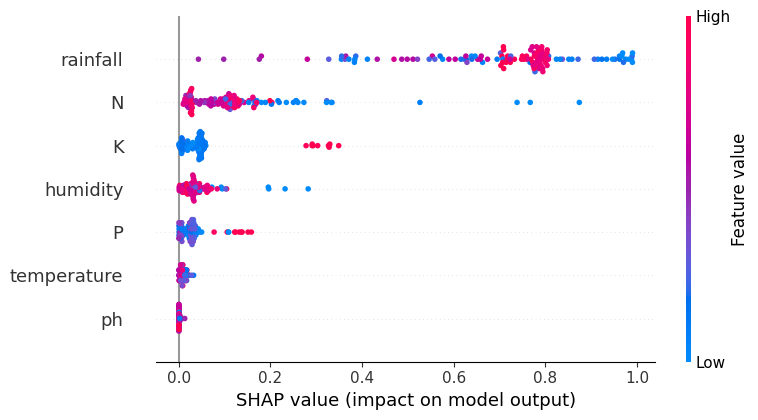

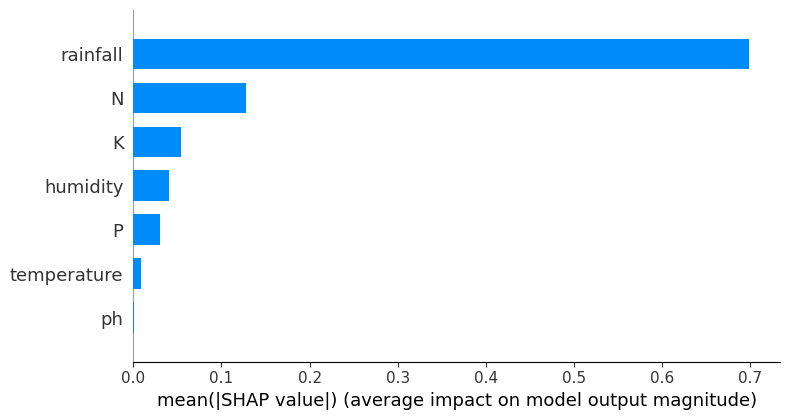


[Balanced] Training MLP for crop: rice


  0%|          | 0/120 [00:00<?, ?it/s]

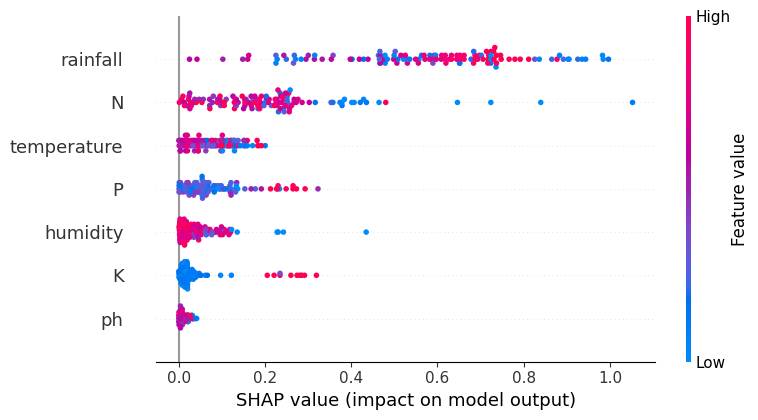

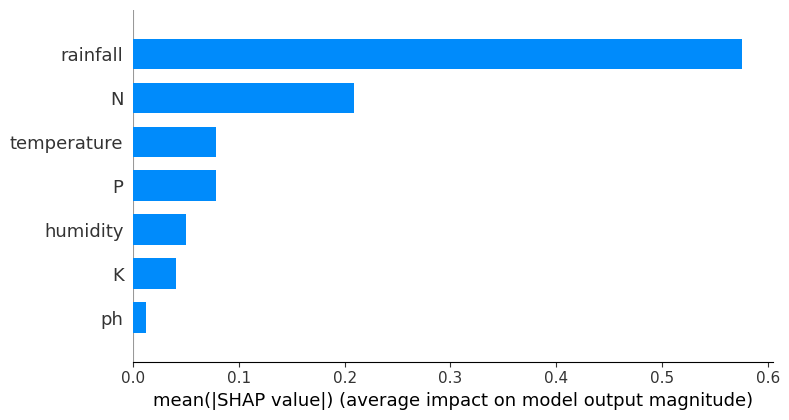

[Balanced] Feature importance saved for crop: rice -> /content/drive/MyDrive/shap_feature_importance_rice_balanced.csv

=== Processing crop: maize ===

[Balanced] Training XGBoost for crop: maize


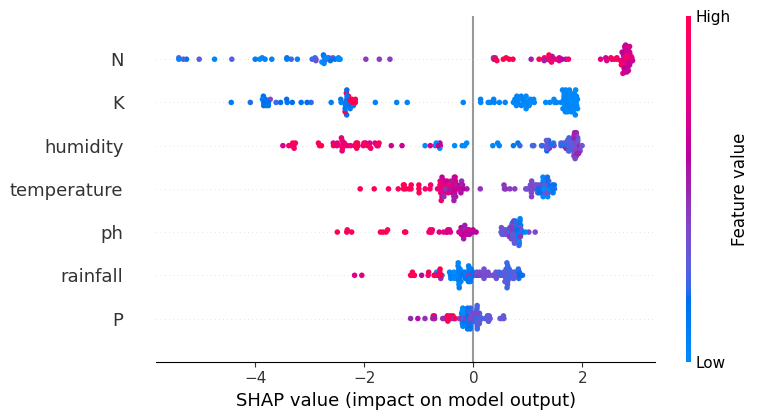

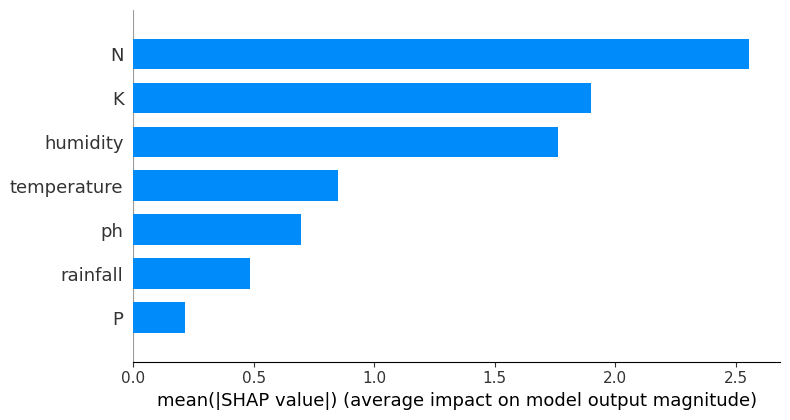


[Balanced] Training SVM for crop: maize


  0%|          | 0/120 [00:00<?, ?it/s]

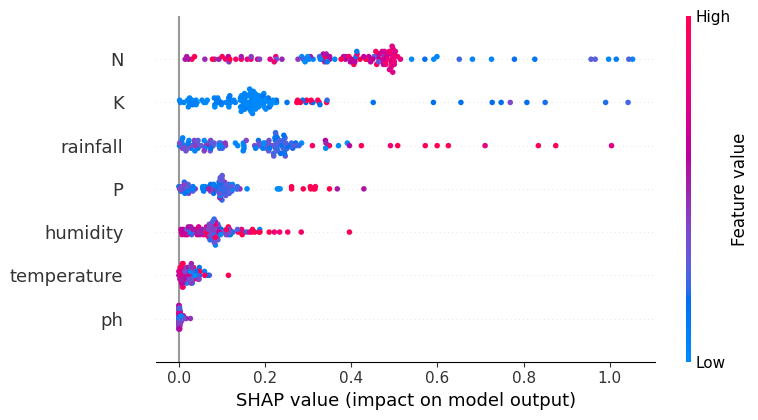

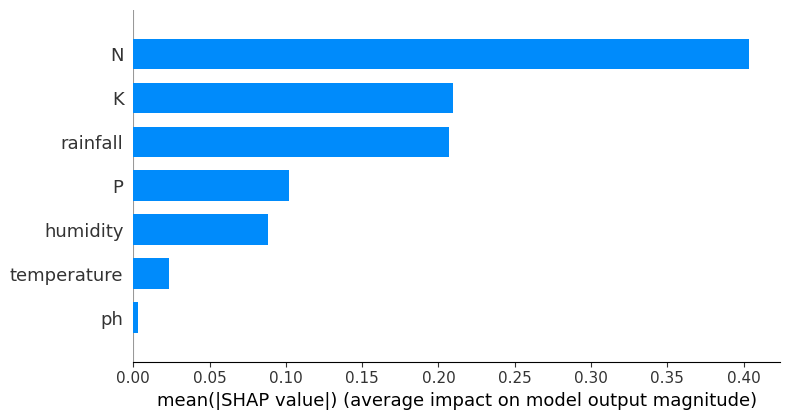


[Balanced] Training MLP for crop: maize


  0%|          | 0/120 [00:00<?, ?it/s]

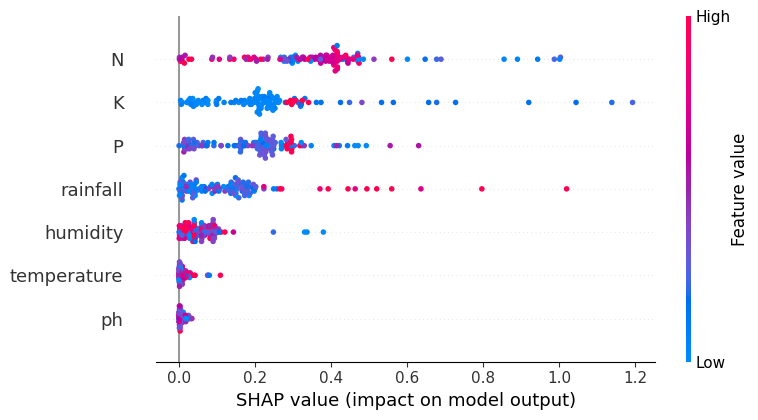

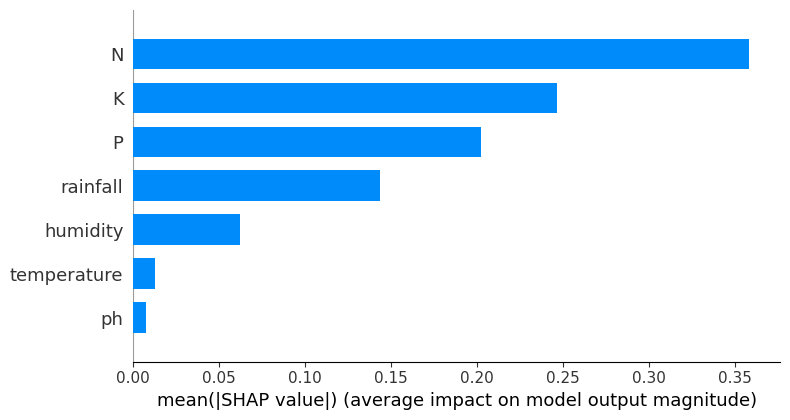

[Balanced] Feature importance saved for crop: maize -> /content/drive/MyDrive/shap_feature_importance_maize_balanced.csv

=== Processing crop: chickpea ===

[Balanced] Training XGBoost for crop: chickpea


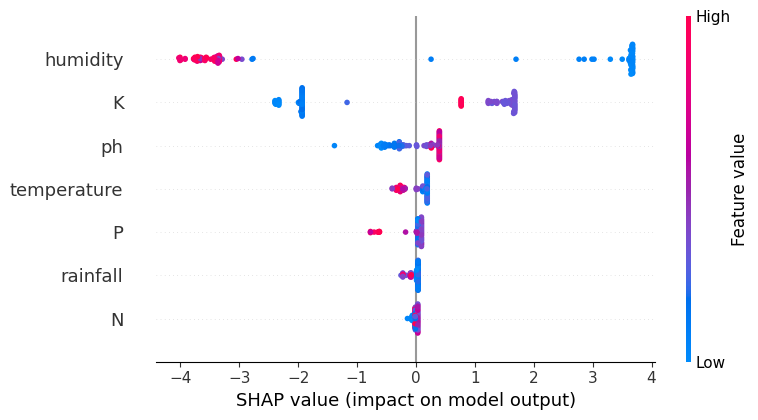

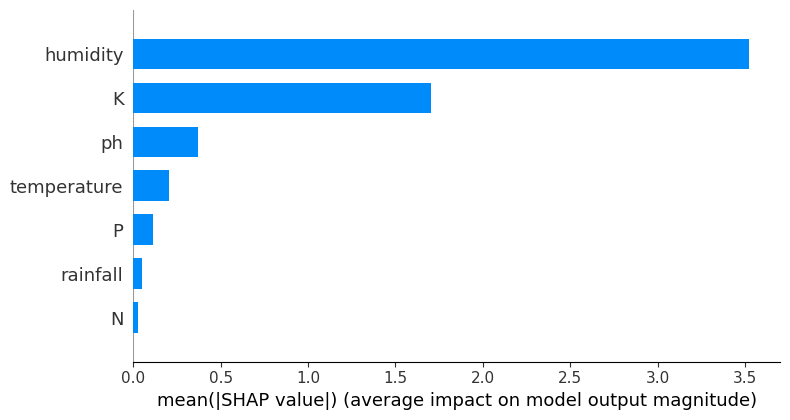


[Balanced] Training SVM for crop: chickpea


  0%|          | 0/120 [00:00<?, ?it/s]

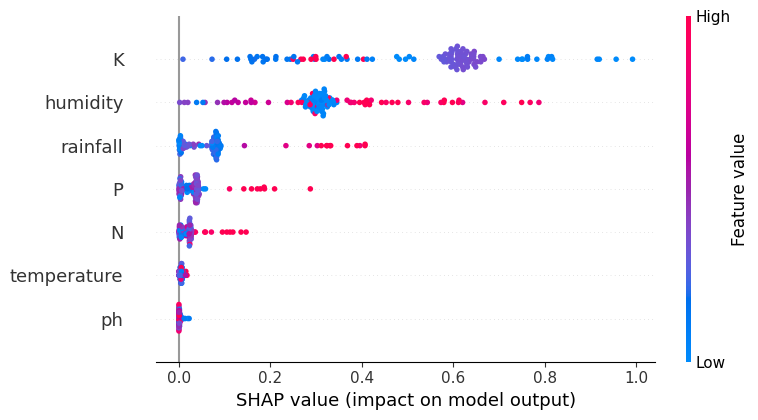

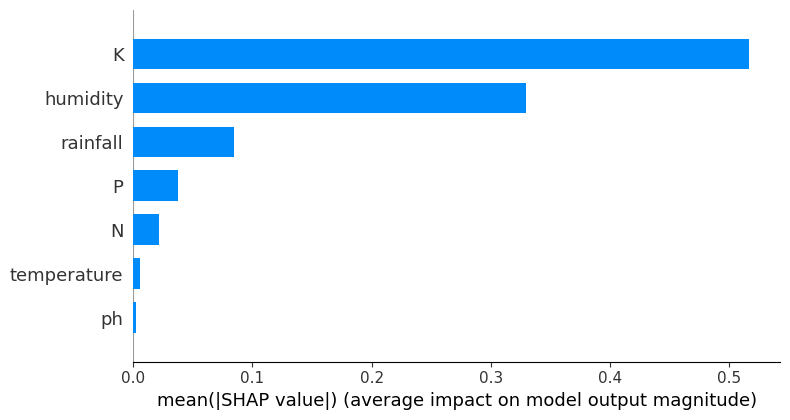


[Balanced] Training MLP for crop: chickpea


  0%|          | 0/120 [00:00<?, ?it/s]

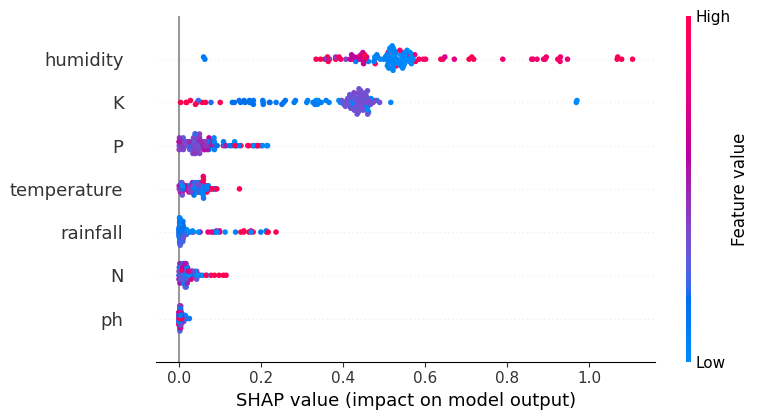

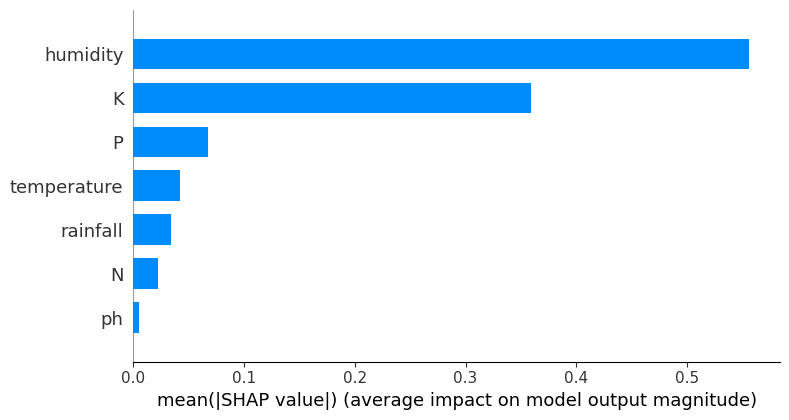

[Balanced] Feature importance saved for crop: chickpea -> /content/drive/MyDrive/shap_feature_importance_chickpea_balanced.csv

=== Processing crop: kidneybeans ===

[Balanced] Training XGBoost for crop: kidneybeans


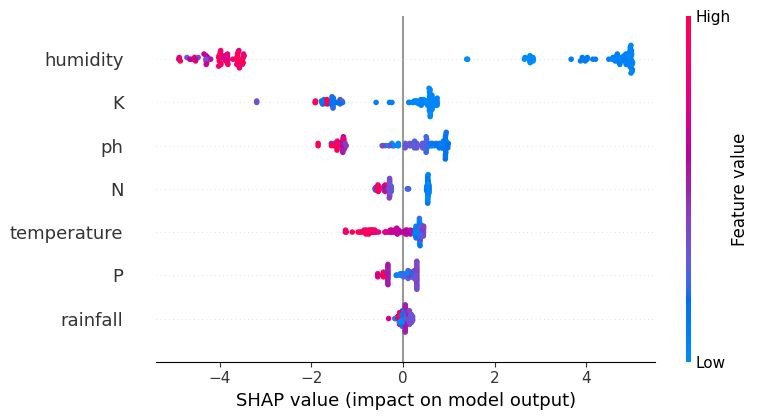

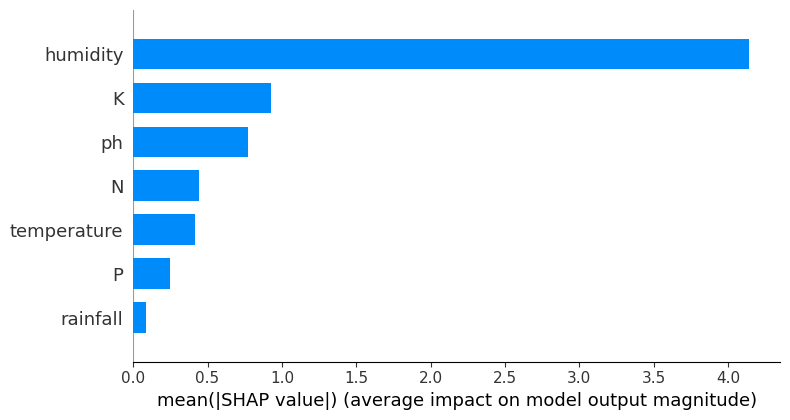


[Balanced] Training SVM for crop: kidneybeans


  0%|          | 0/120 [00:00<?, ?it/s]

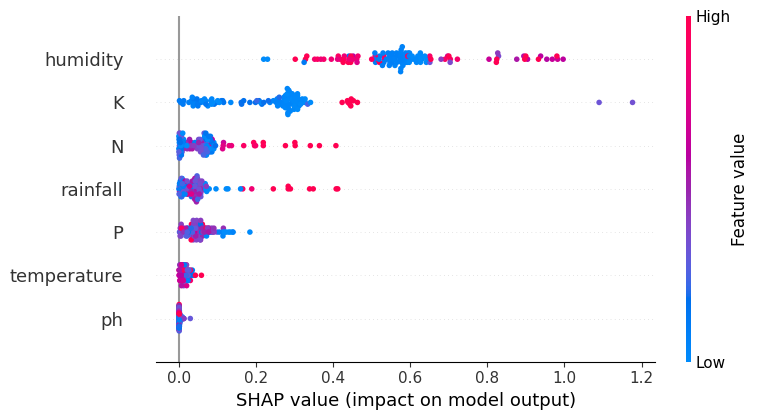

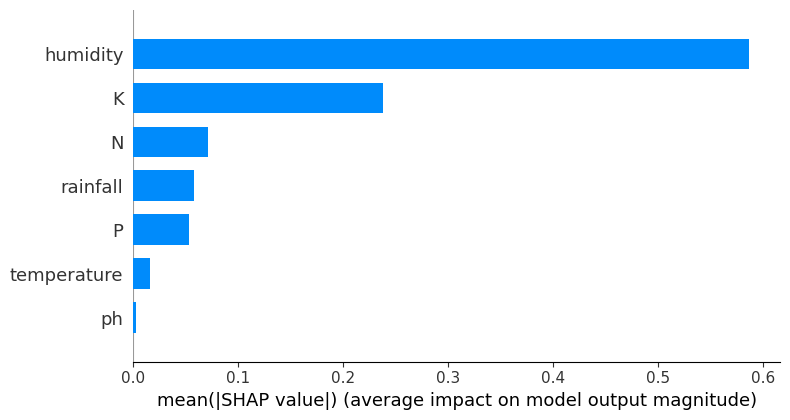


[Balanced] Training MLP for crop: kidneybeans


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


  0%|          | 0/120 [00:00<?, ?it/s]

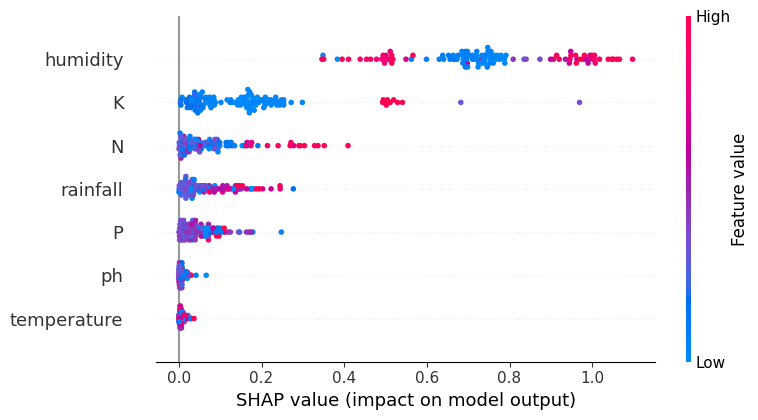

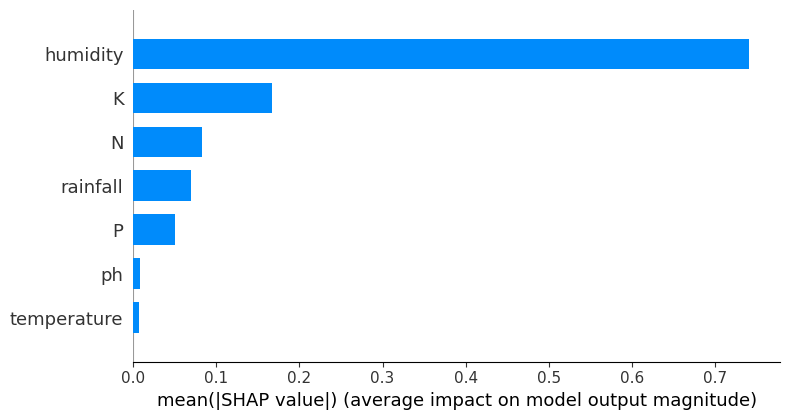

[Balanced] Feature importance saved for crop: kidneybeans -> /content/drive/MyDrive/shap_feature_importance_kidneybeans_balanced.csv

=== Processing crop: pigeonpeas ===

[Balanced] Training XGBoost for crop: pigeonpeas


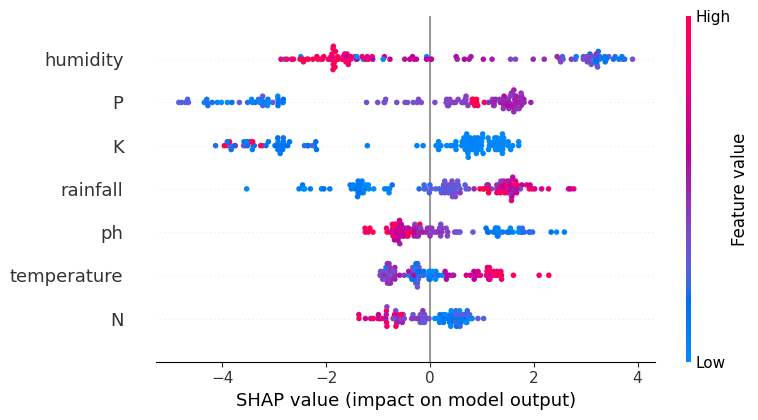

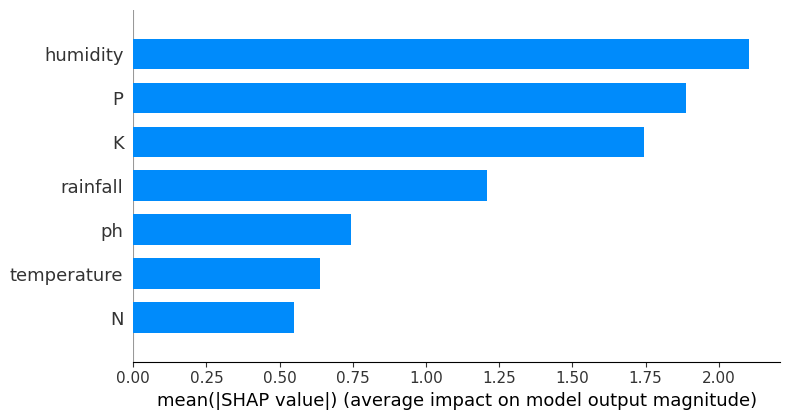


[Balanced] Training SVM for crop: pigeonpeas


  0%|          | 0/120 [00:00<?, ?it/s]

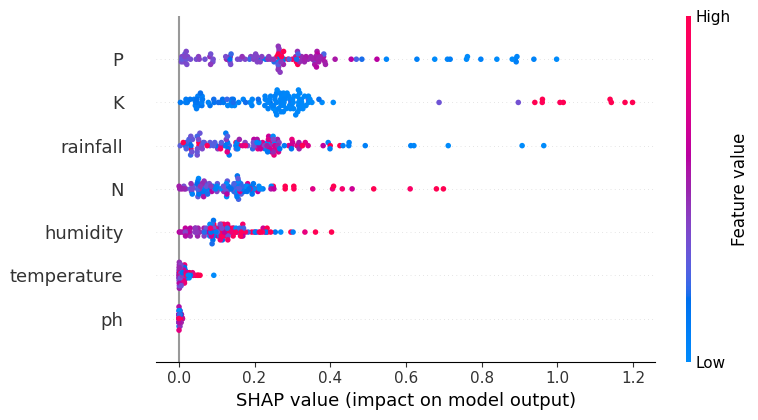

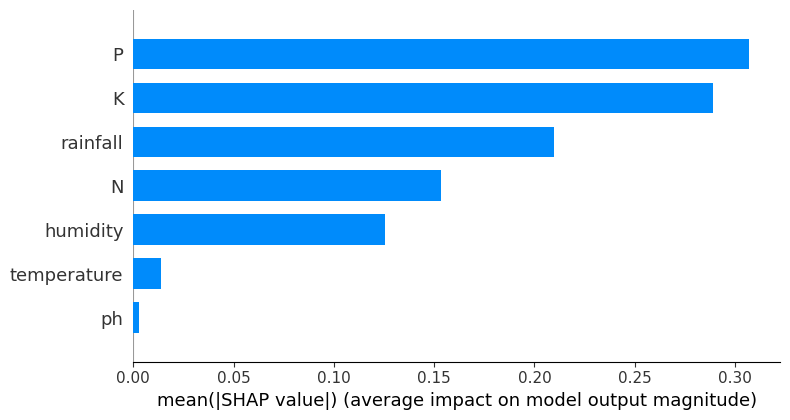


[Balanced] Training MLP for crop: pigeonpeas


  0%|          | 0/120 [00:00<?, ?it/s]

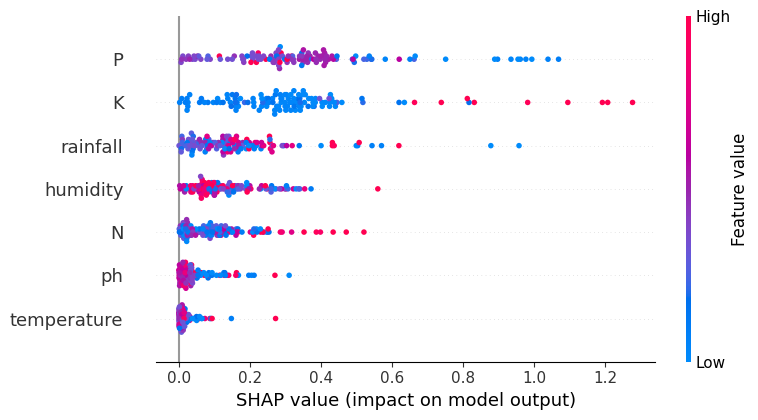

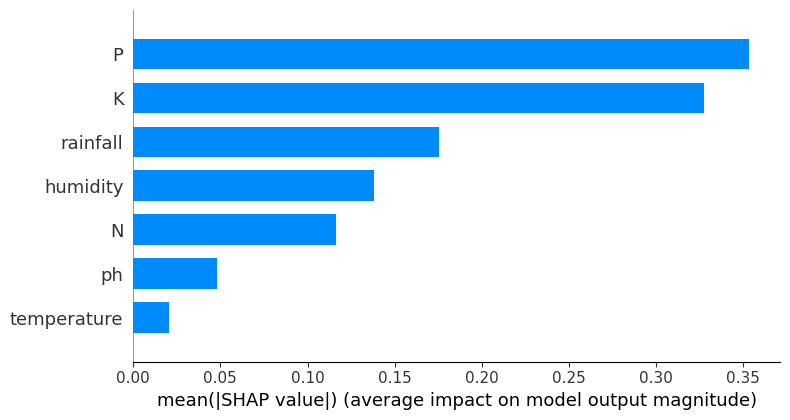

[Balanced] Feature importance saved for crop: pigeonpeas -> /content/drive/MyDrive/shap_feature_importance_pigeonpeas_balanced.csv

=== Processing crop: mothbeans ===

[Balanced] Training XGBoost for crop: mothbeans


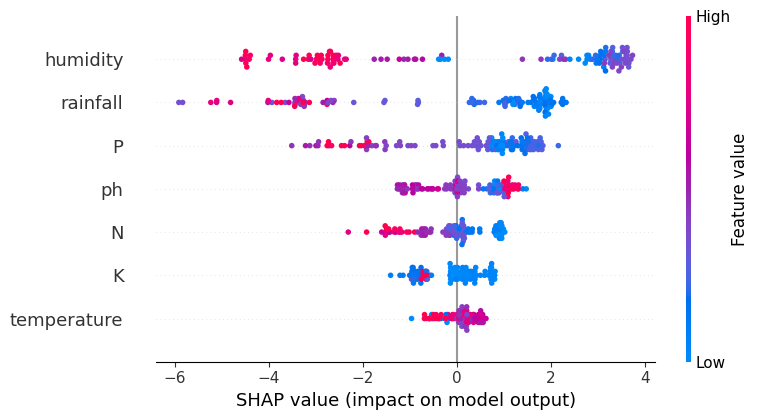

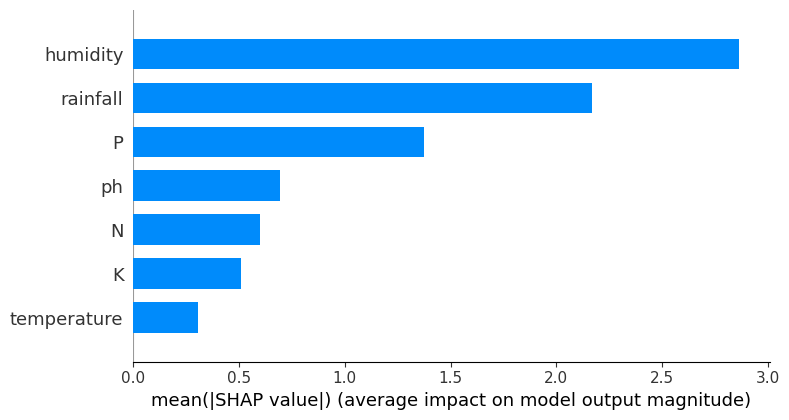


[Balanced] Training SVM for crop: mothbeans


  0%|          | 0/120 [00:00<?, ?it/s]

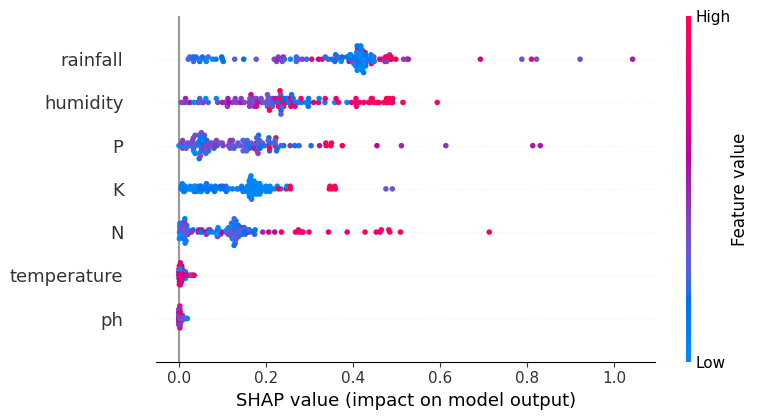

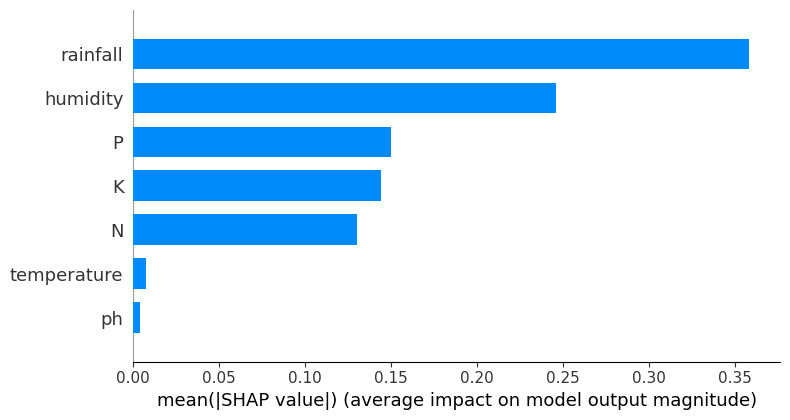


[Balanced] Training MLP for crop: mothbeans


  0%|          | 0/120 [00:00<?, ?it/s]

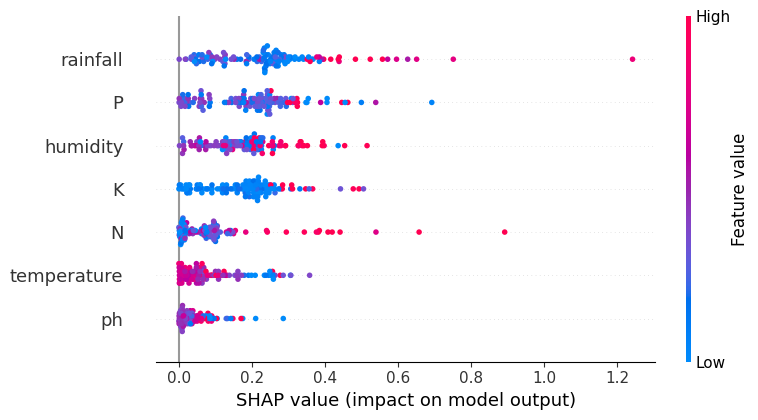

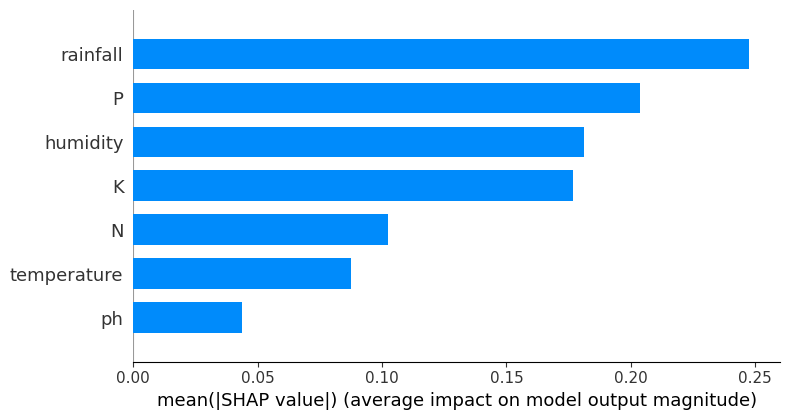

[Balanced] Feature importance saved for crop: mothbeans -> /content/drive/MyDrive/shap_feature_importance_mothbeans_balanced.csv

=== Processing crop: mungbean ===

[Balanced] Training XGBoost for crop: mungbean


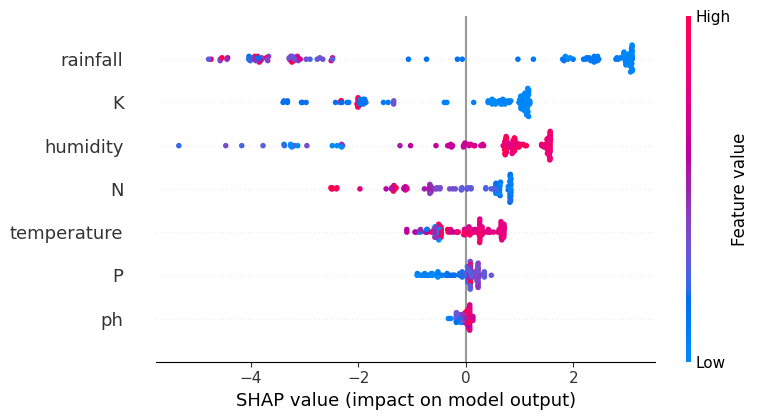

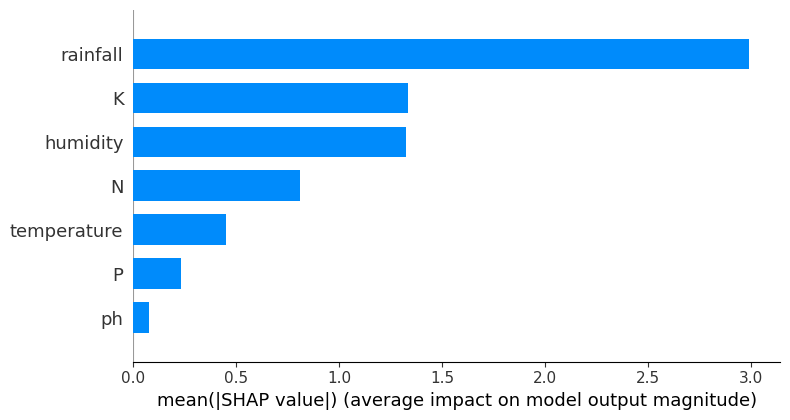


[Balanced] Training SVM for crop: mungbean


  0%|          | 0/120 [00:00<?, ?it/s]

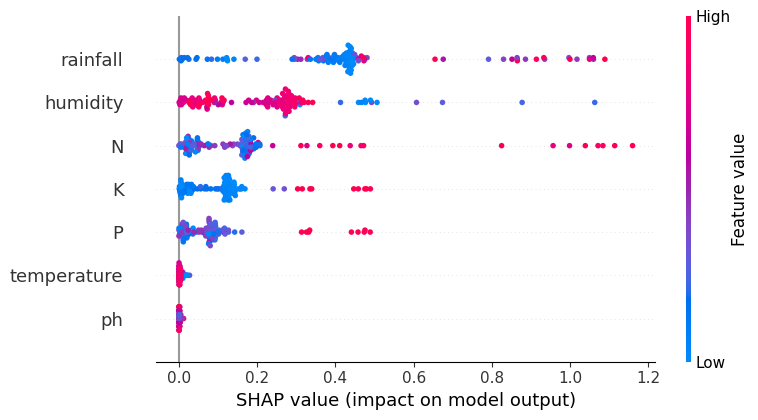

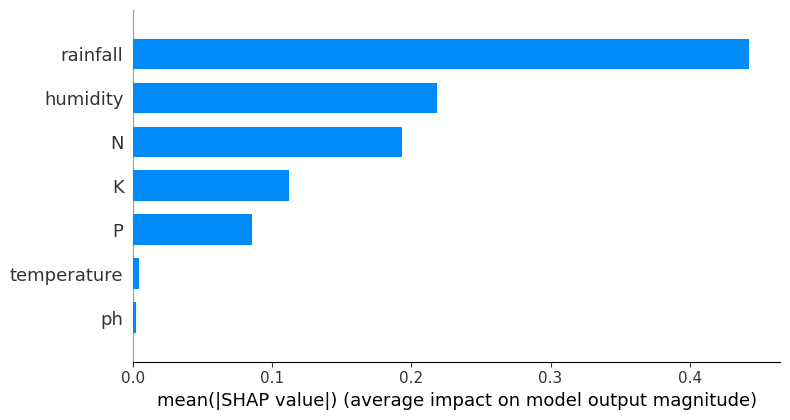


[Balanced] Training MLP for crop: mungbean


  0%|          | 0/120 [00:00<?, ?it/s]

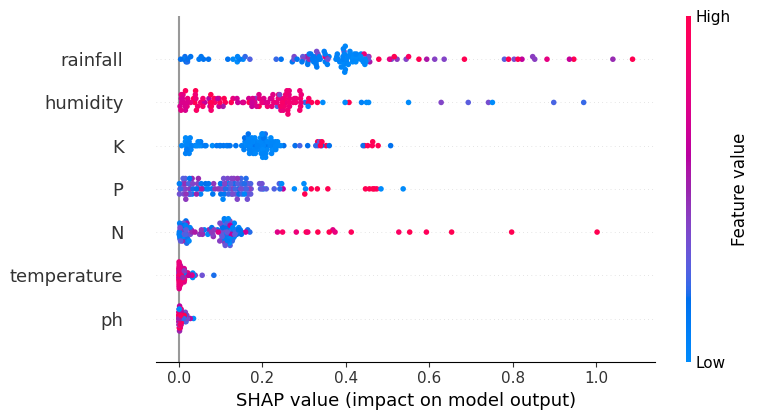

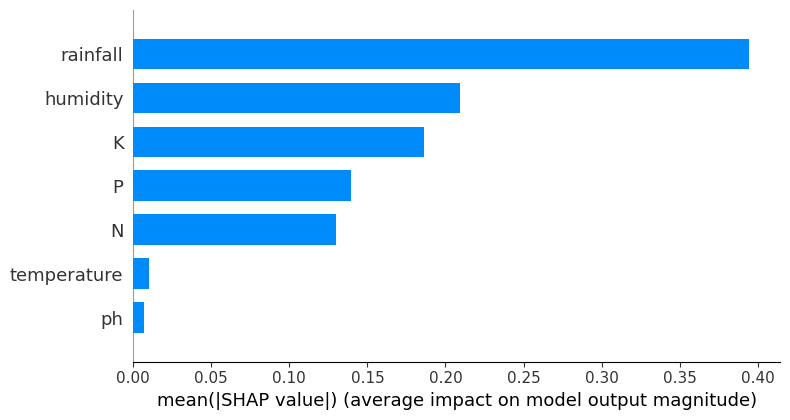

[Balanced] Feature importance saved for crop: mungbean -> /content/drive/MyDrive/shap_feature_importance_mungbean_balanced.csv

=== Processing crop: blackgram ===

[Balanced] Training XGBoost for crop: blackgram


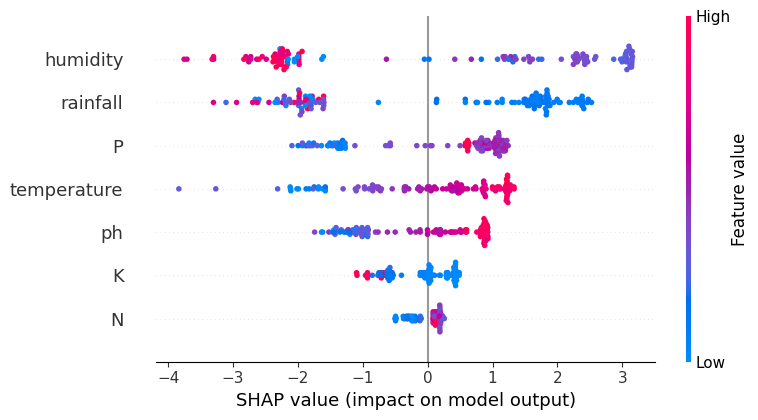

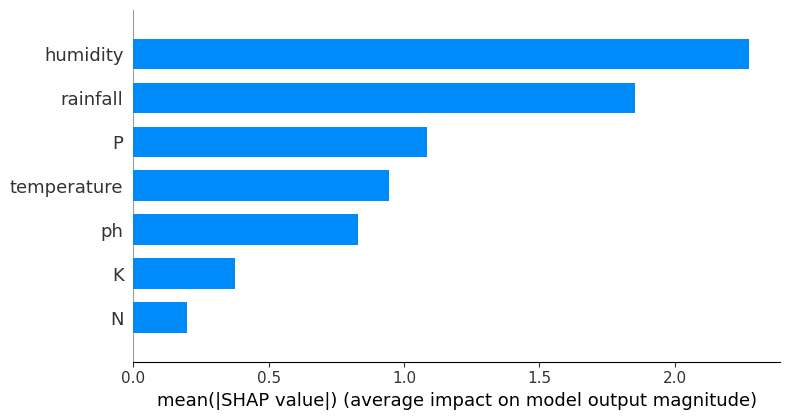


[Balanced] Training SVM for crop: blackgram


  0%|          | 0/120 [00:00<?, ?it/s]

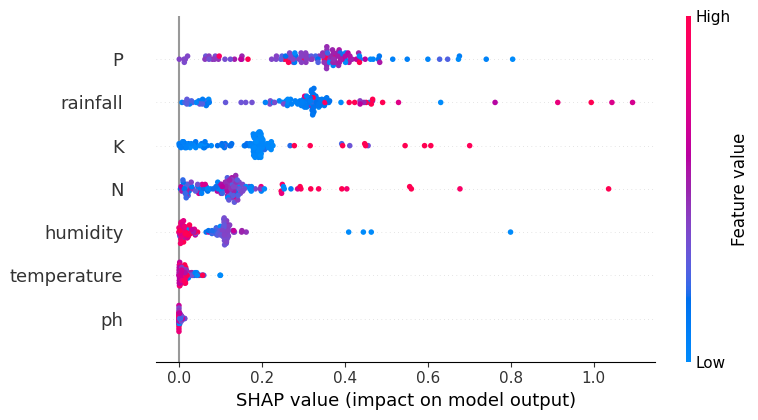

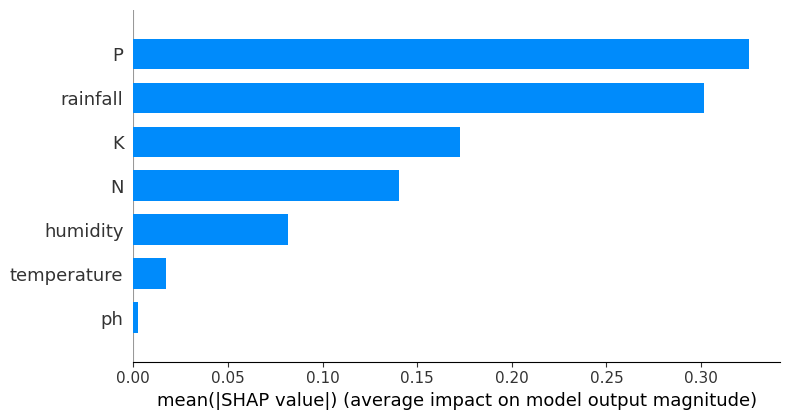


[Balanced] Training MLP for crop: blackgram


  0%|          | 0/120 [00:00<?, ?it/s]

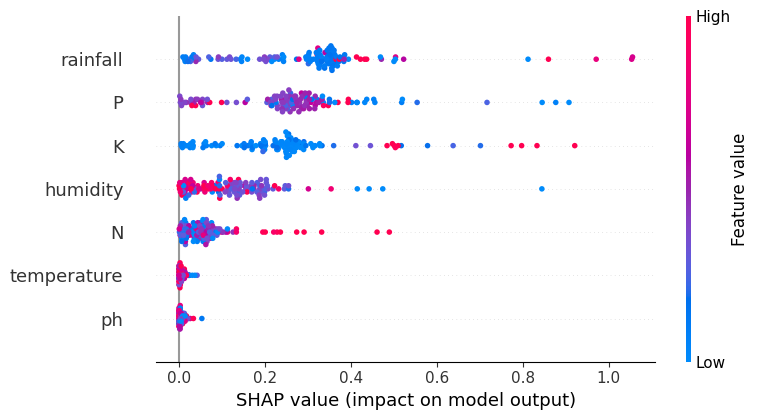

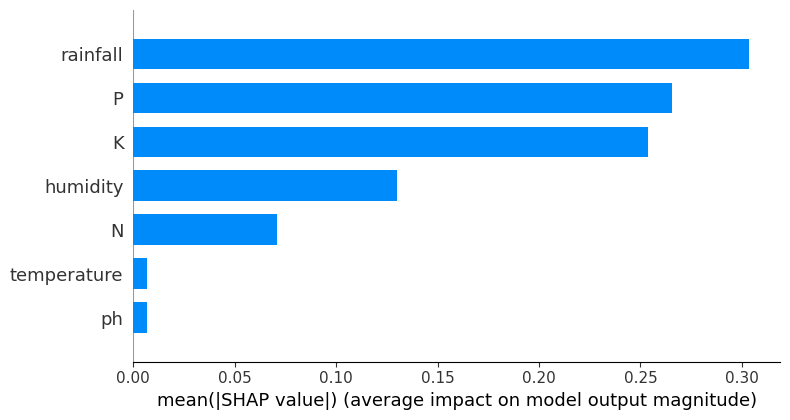

[Balanced] Feature importance saved for crop: blackgram -> /content/drive/MyDrive/shap_feature_importance_blackgram_balanced.csv

=== Processing crop: lentil ===

[Balanced] Training XGBoost for crop: lentil


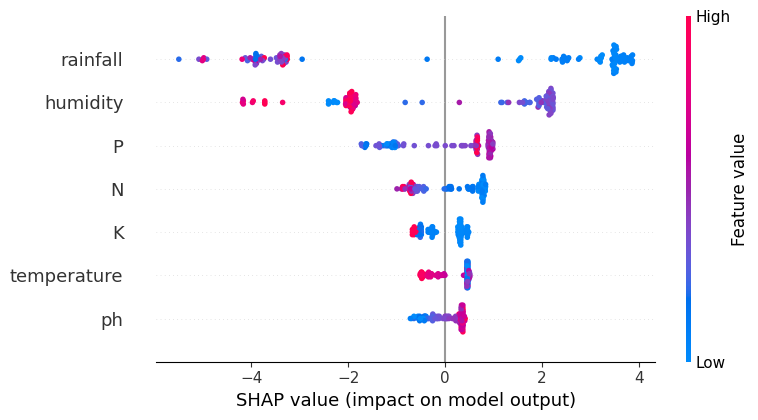

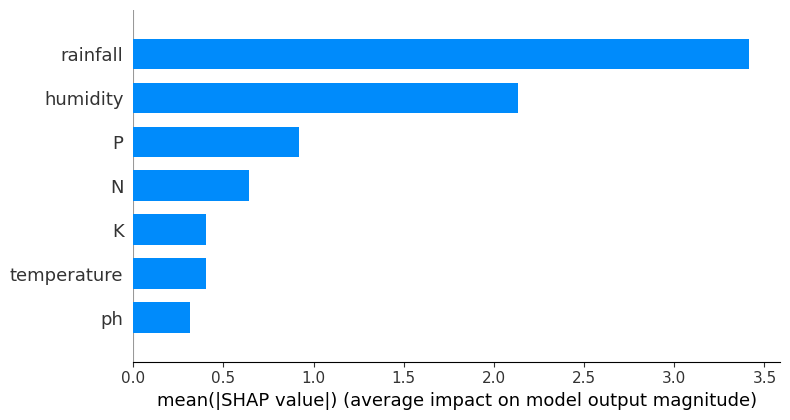


[Balanced] Training SVM for crop: lentil


  0%|          | 0/120 [00:00<?, ?it/s]

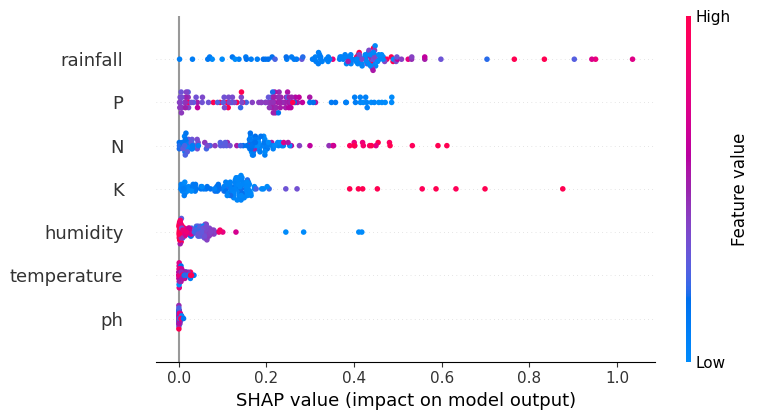

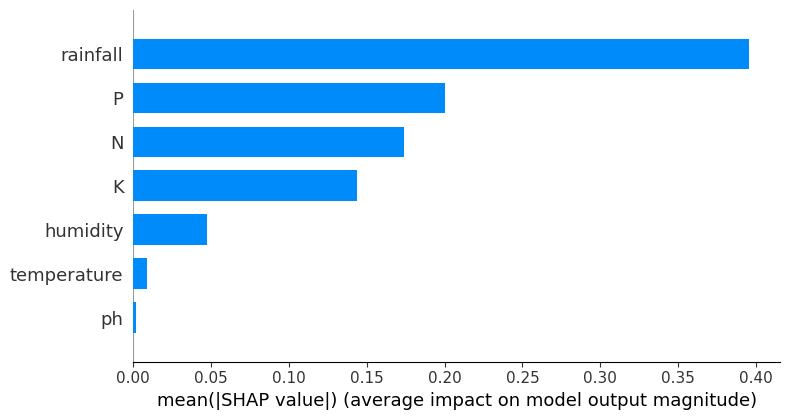


[Balanced] Training MLP for crop: lentil


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


  0%|          | 0/120 [00:00<?, ?it/s]

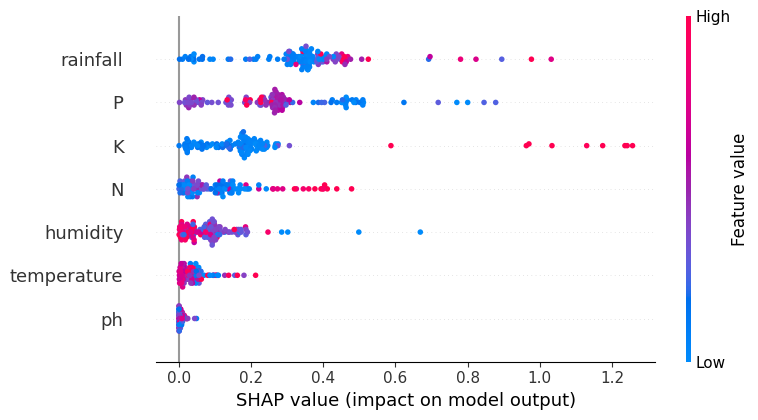

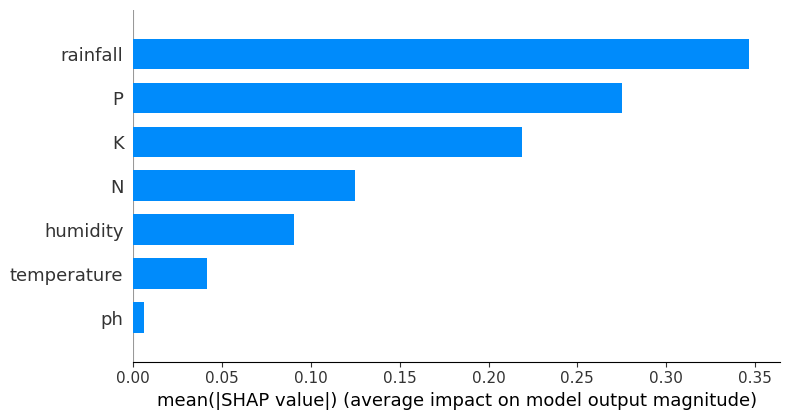

[Balanced] Feature importance saved for crop: lentil -> /content/drive/MyDrive/shap_feature_importance_lentil_balanced.csv

=== Processing crop: pomegranate ===

[Balanced] Training XGBoost for crop: pomegranate


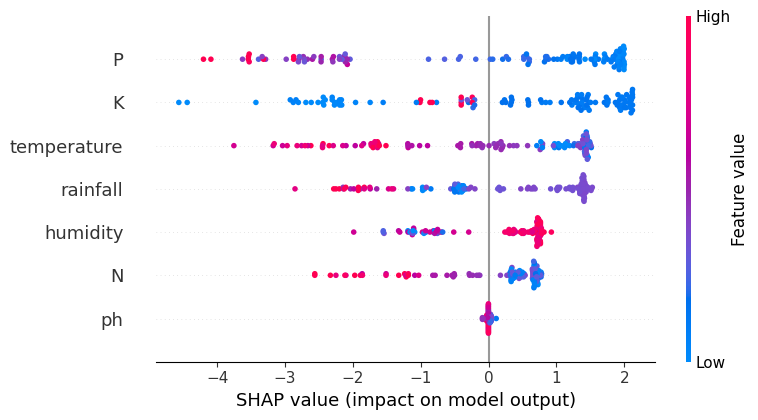

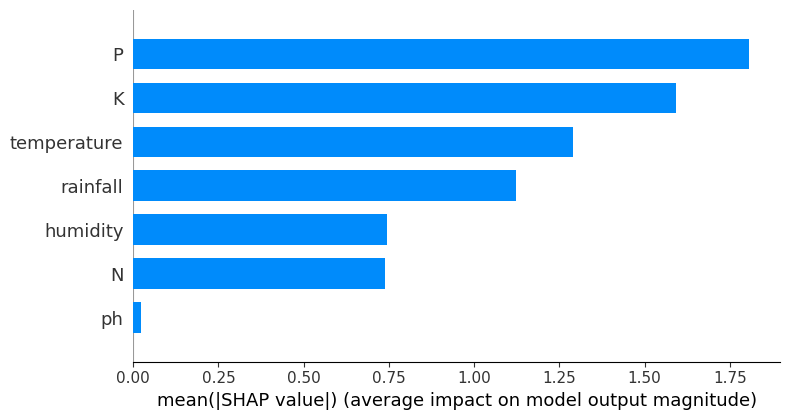


[Balanced] Training SVM for crop: pomegranate


  0%|          | 0/120 [00:00<?, ?it/s]

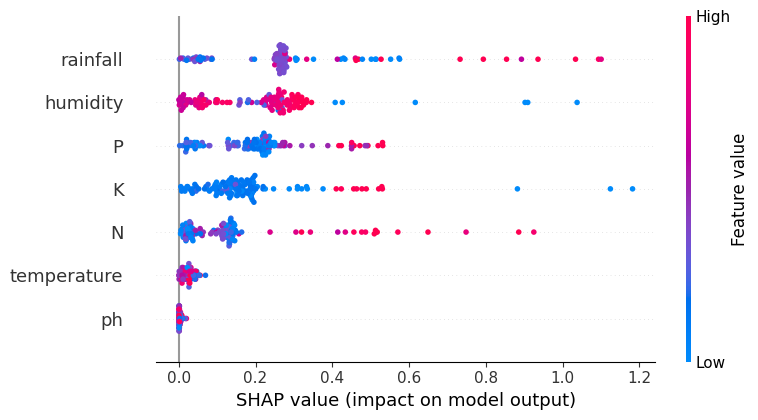

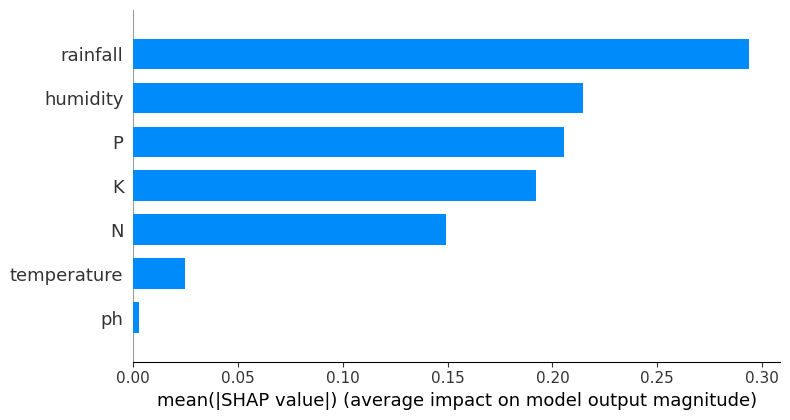


[Balanced] Training MLP for crop: pomegranate


  0%|          | 0/120 [00:00<?, ?it/s]

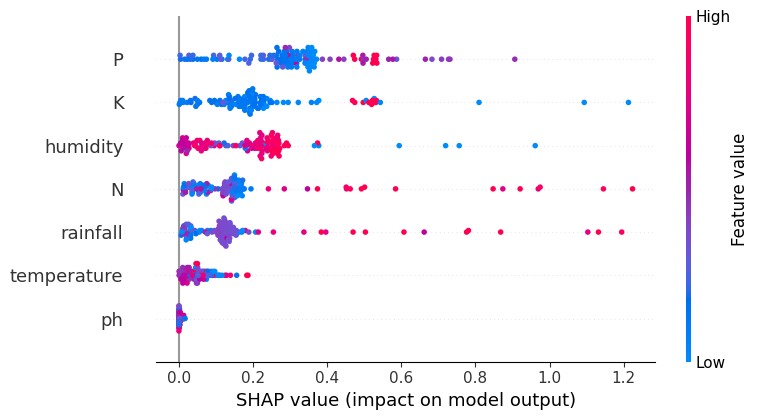

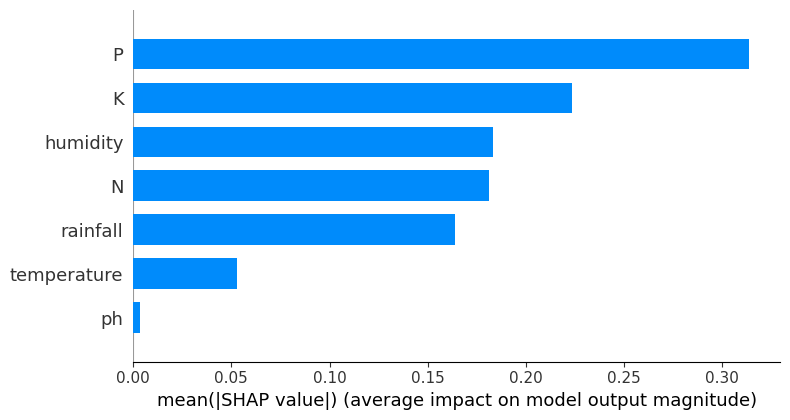

[Balanced] Feature importance saved for crop: pomegranate -> /content/drive/MyDrive/shap_feature_importance_pomegranate_balanced.csv

=== Processing crop: banana ===

[Balanced] Training XGBoost for crop: banana


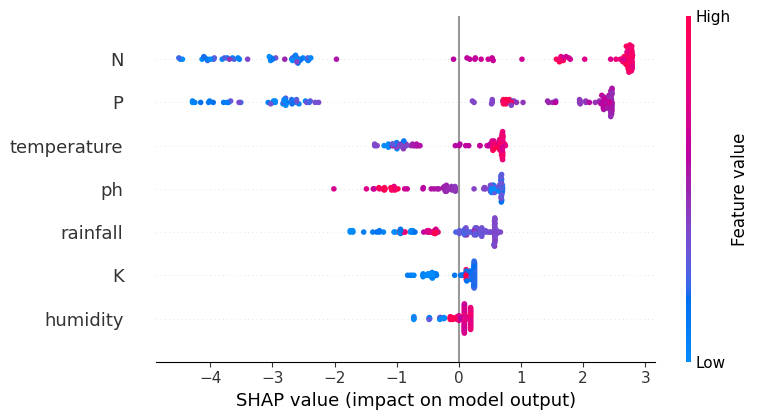

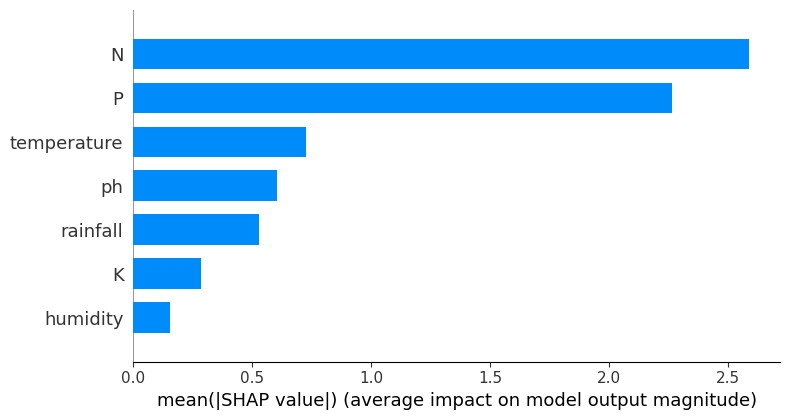


[Balanced] Training SVM for crop: banana


  0%|          | 0/120 [00:00<?, ?it/s]

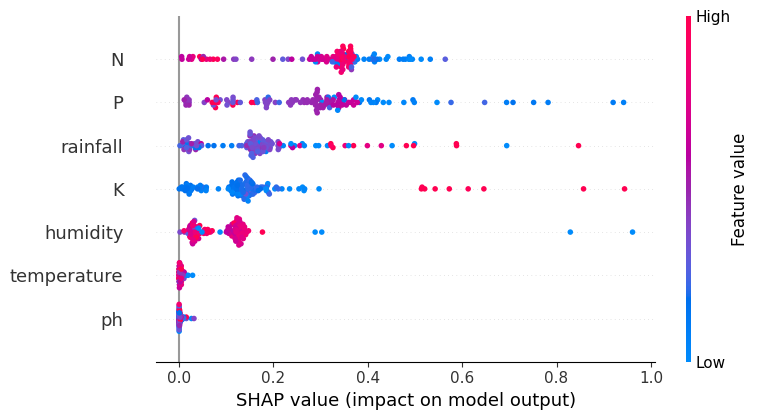

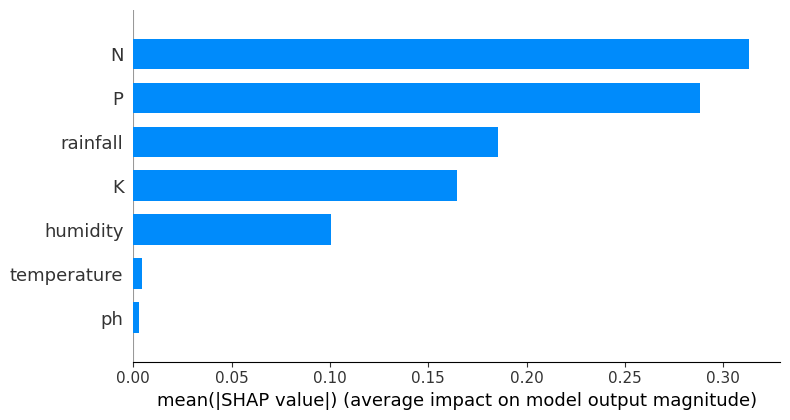


[Balanced] Training MLP for crop: banana


  0%|          | 0/120 [00:00<?, ?it/s]

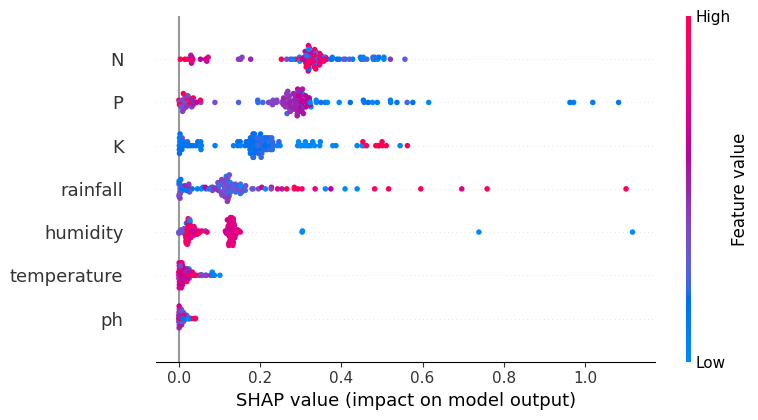

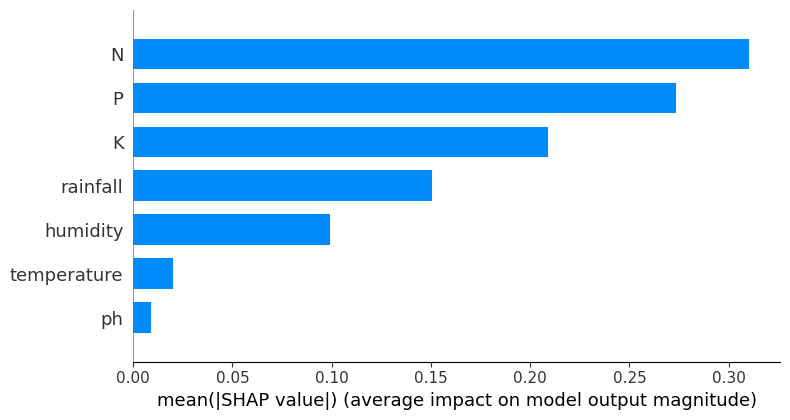

[Balanced] Feature importance saved for crop: banana -> /content/drive/MyDrive/shap_feature_importance_banana_balanced.csv

=== Processing crop: mango ===

[Balanced] Training XGBoost for crop: mango


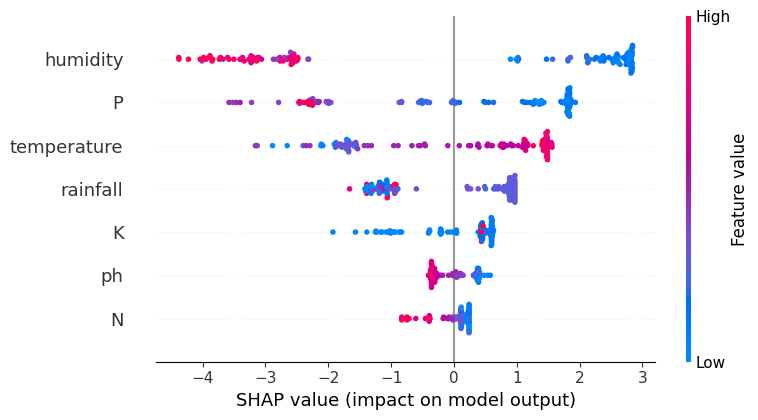

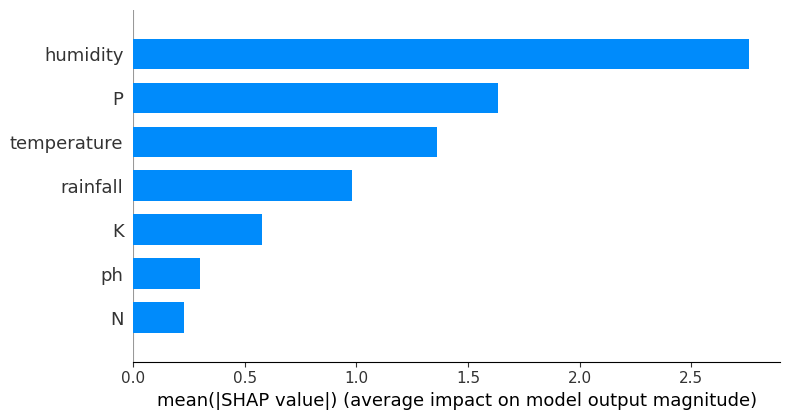


[Balanced] Training SVM for crop: mango


  0%|          | 0/120 [00:00<?, ?it/s]

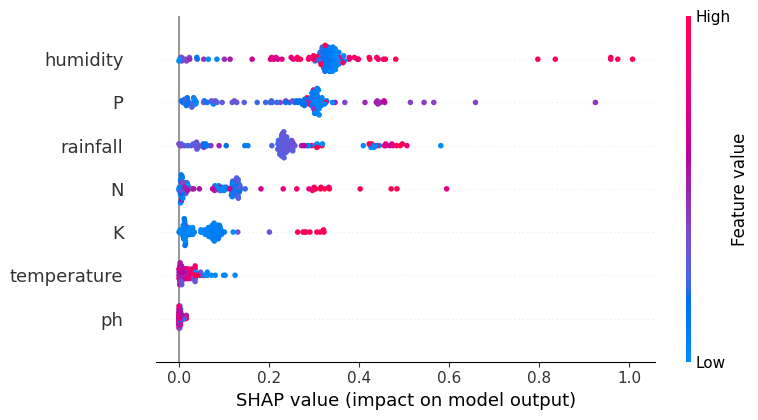

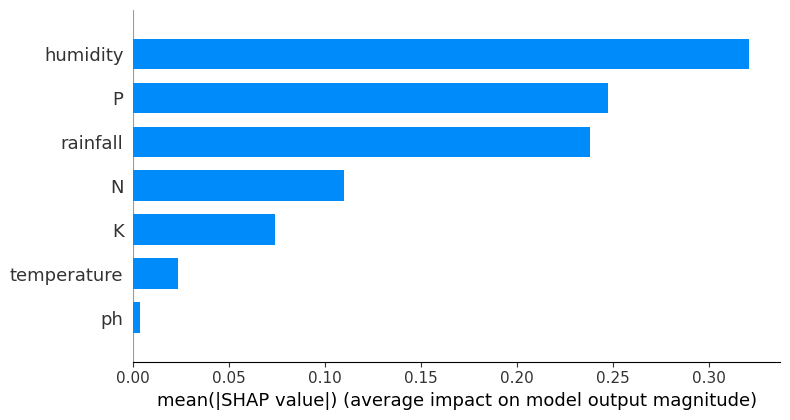


[Balanced] Training MLP for crop: mango


  0%|          | 0/120 [00:00<?, ?it/s]

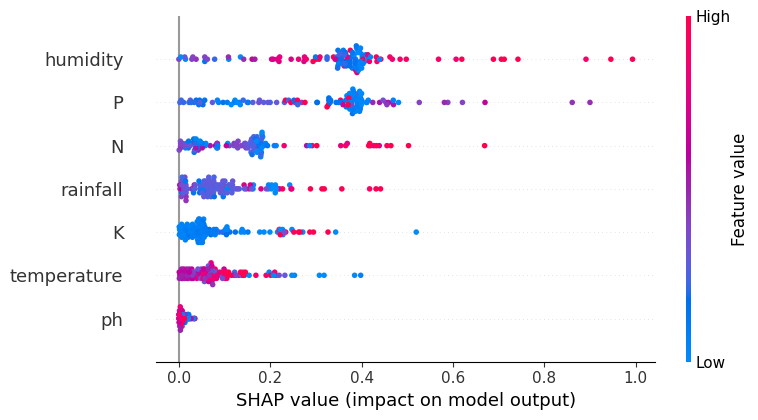

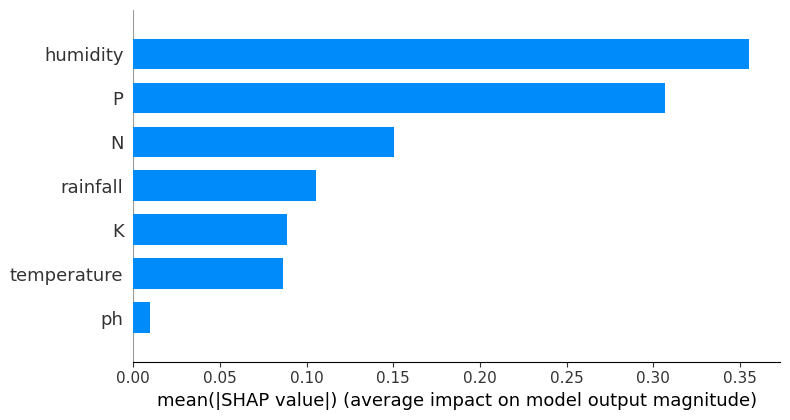

[Balanced] Feature importance saved for crop: mango -> /content/drive/MyDrive/shap_feature_importance_mango_balanced.csv

=== Processing crop: grapes ===

[Balanced] Training XGBoost for crop: grapes


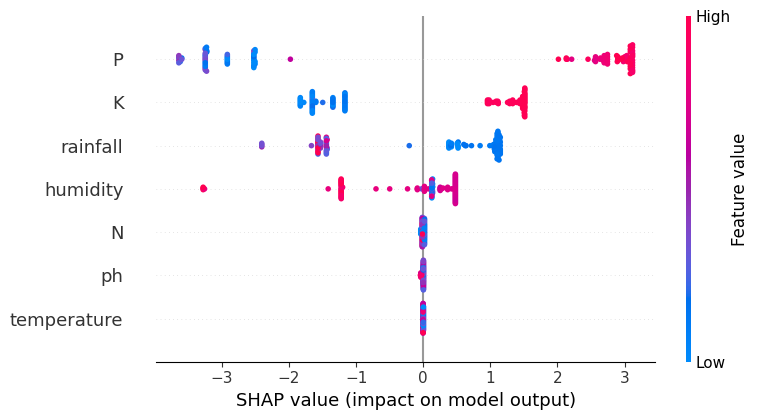

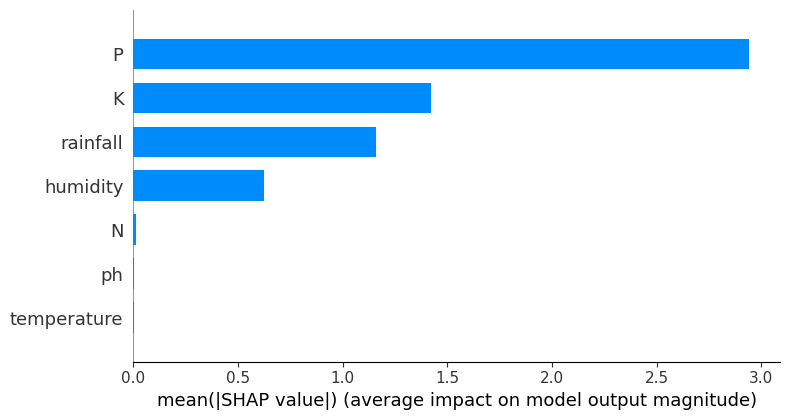


[Balanced] Training SVM for crop: grapes


  0%|          | 0/120 [00:00<?, ?it/s]

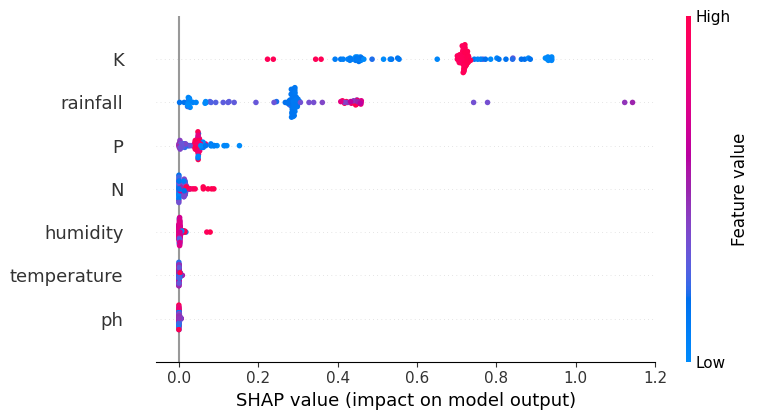

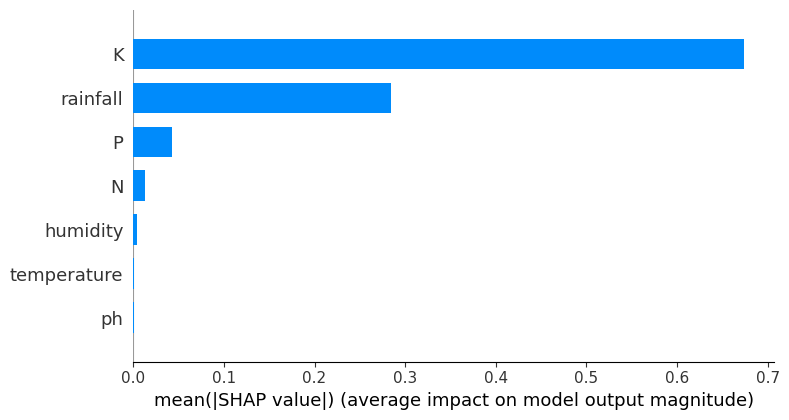


[Balanced] Training MLP for crop: grapes


  0%|          | 0/120 [00:00<?, ?it/s]

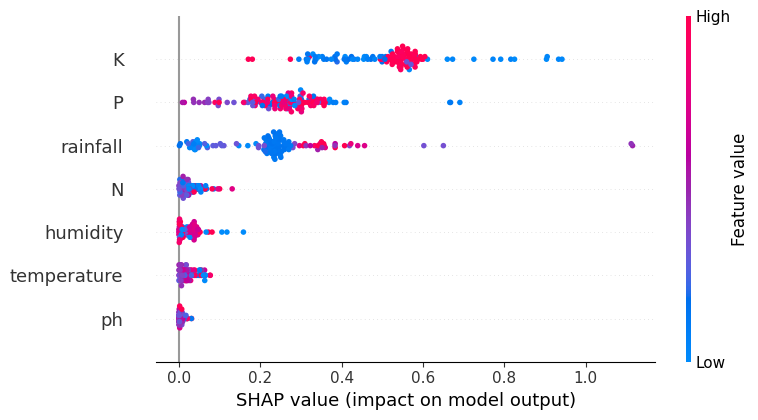

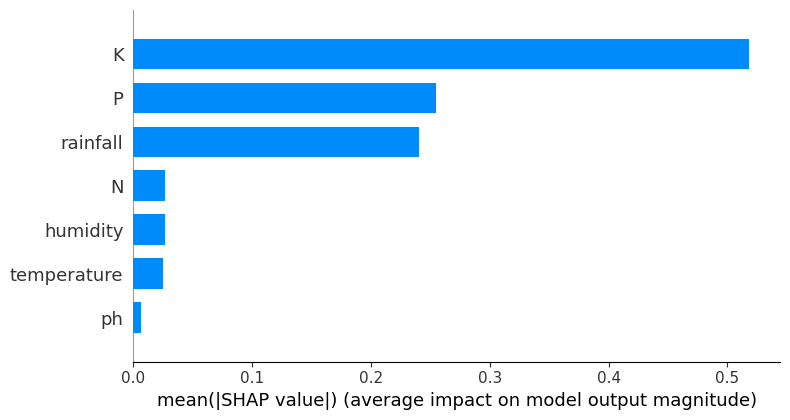

[Balanced] Feature importance saved for crop: grapes -> /content/drive/MyDrive/shap_feature_importance_grapes_balanced.csv

=== Processing crop: watermelon ===

[Balanced] Training XGBoost for crop: watermelon


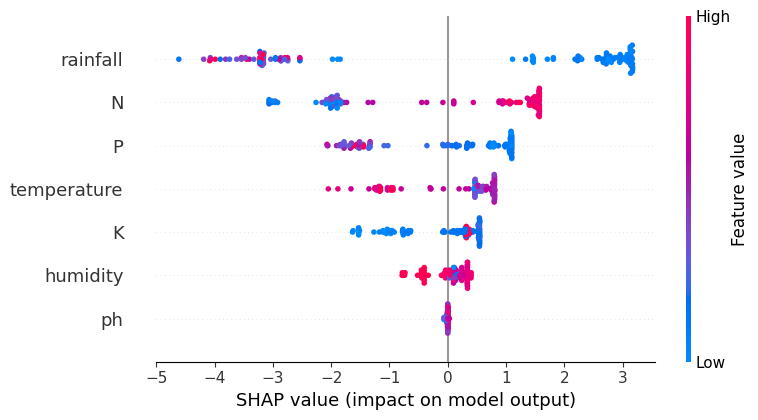

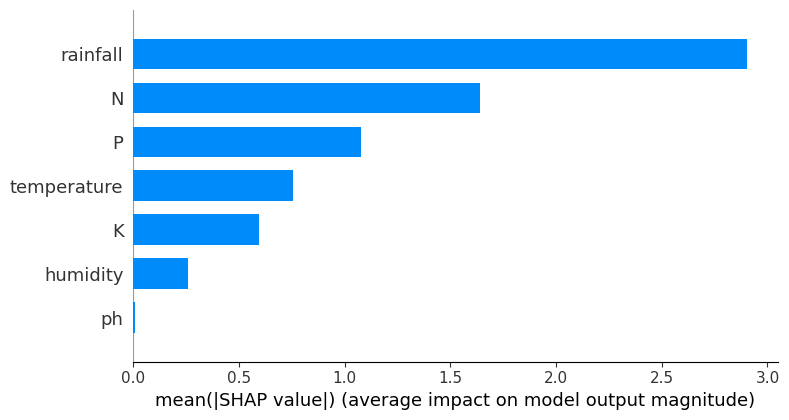


[Balanced] Training SVM for crop: watermelon


  0%|          | 0/120 [00:00<?, ?it/s]

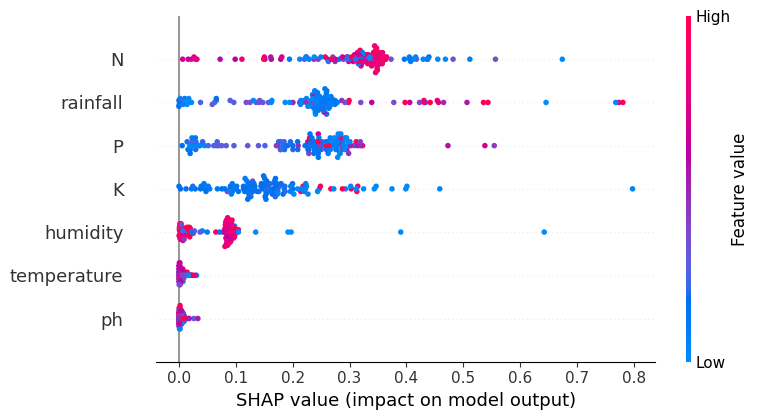

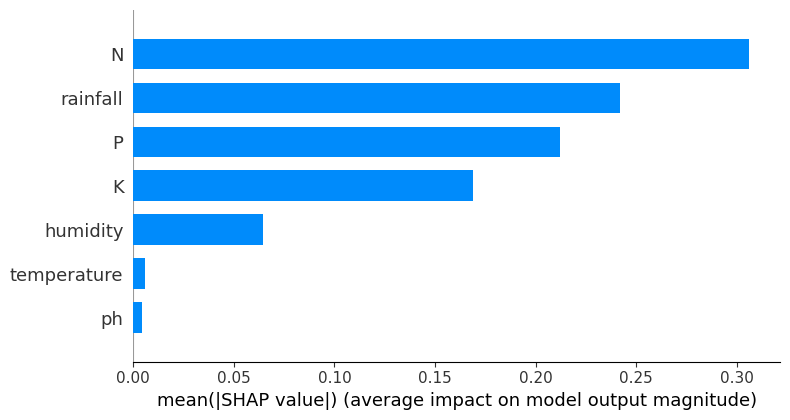


[Balanced] Training MLP for crop: watermelon


  0%|          | 0/120 [00:00<?, ?it/s]

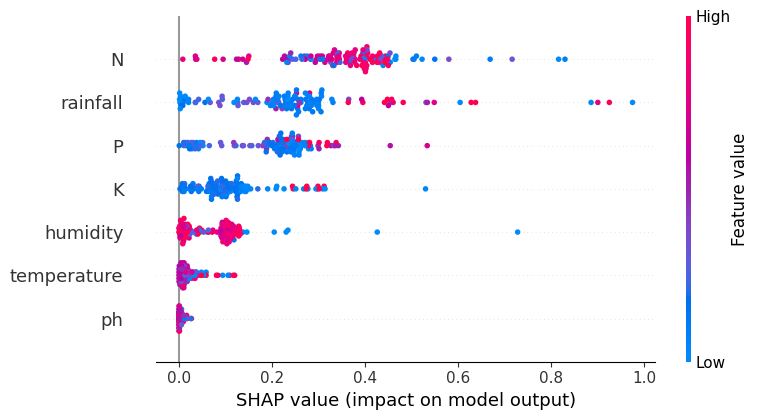

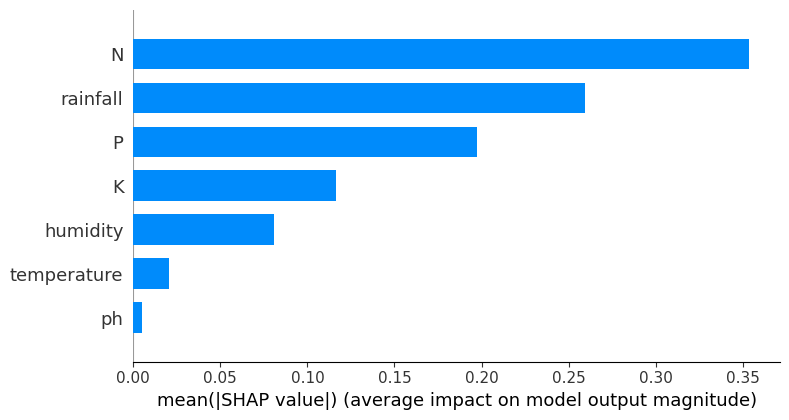

[Balanced] Feature importance saved for crop: watermelon -> /content/drive/MyDrive/shap_feature_importance_watermelon_balanced.csv

=== Processing crop: muskmelon ===

[Balanced] Training XGBoost for crop: muskmelon


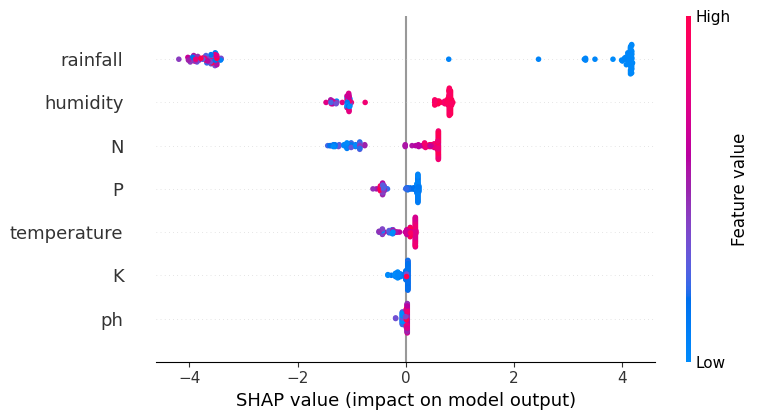

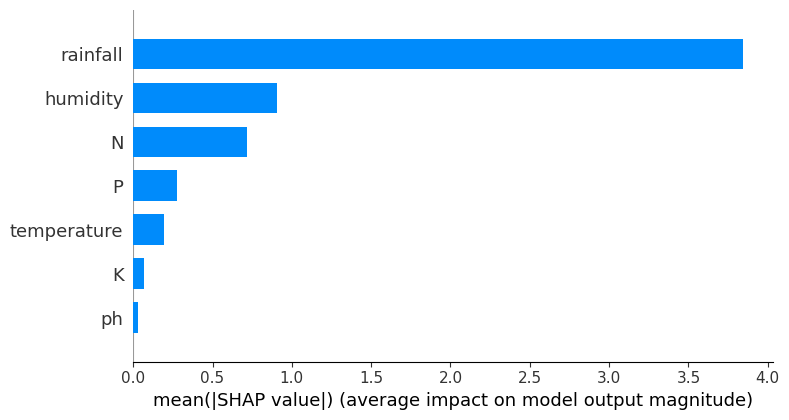


[Balanced] Training SVM for crop: muskmelon


  0%|          | 0/120 [00:00<?, ?it/s]

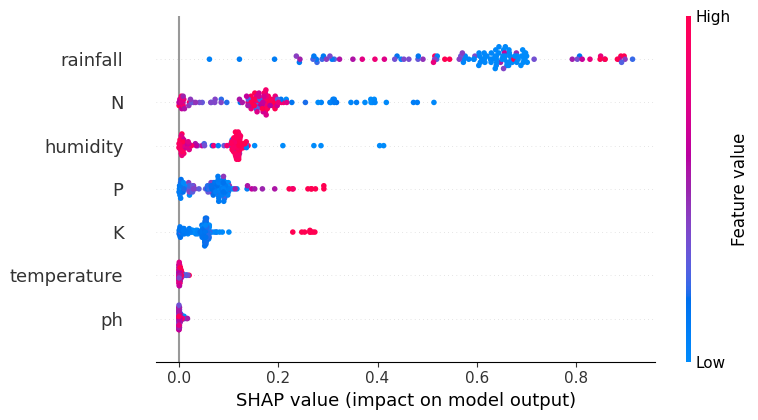

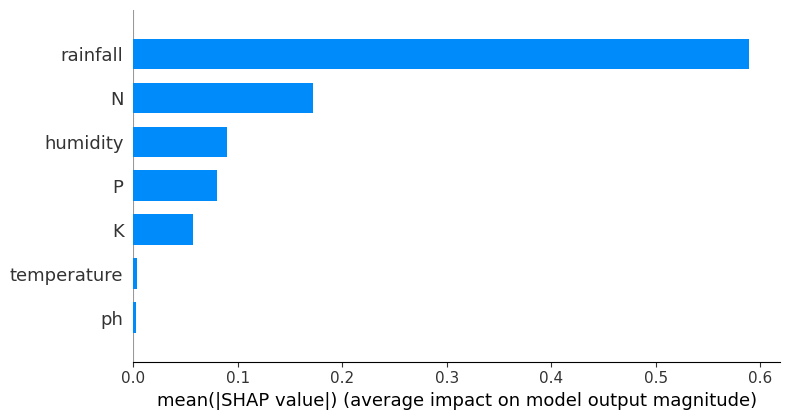


[Balanced] Training MLP for crop: muskmelon


  0%|          | 0/120 [00:00<?, ?it/s]

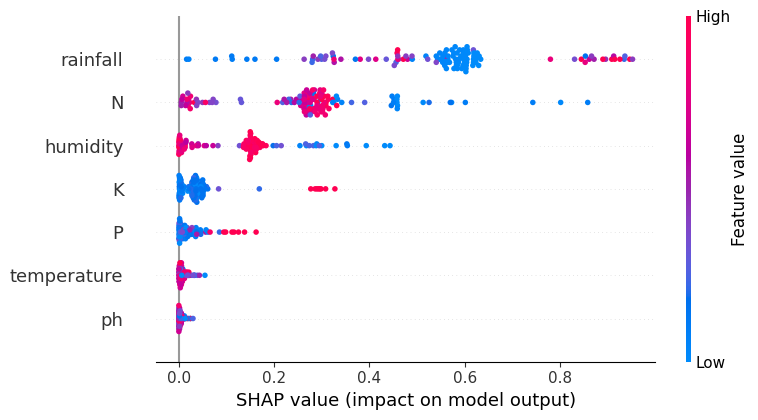

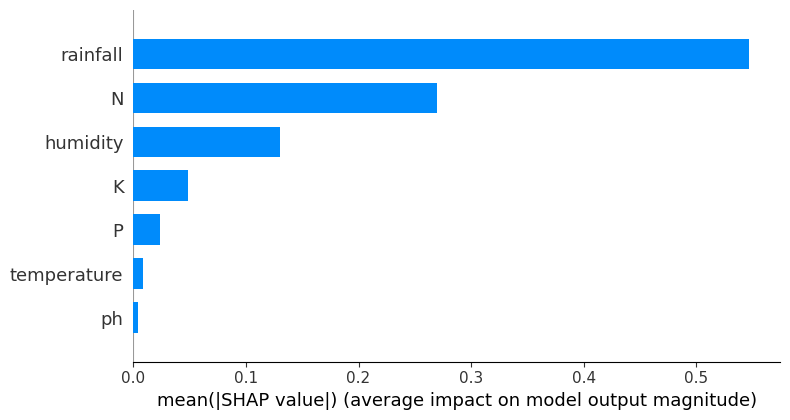

[Balanced] Feature importance saved for crop: muskmelon -> /content/drive/MyDrive/shap_feature_importance_muskmelon_balanced.csv

=== Processing crop: apple ===

[Balanced] Training XGBoost for crop: apple


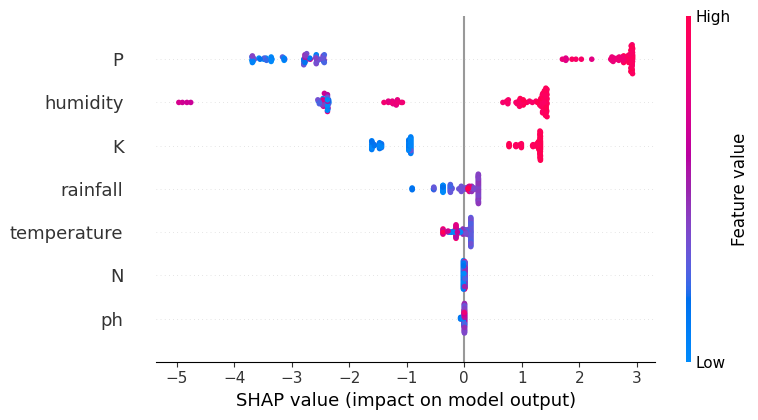

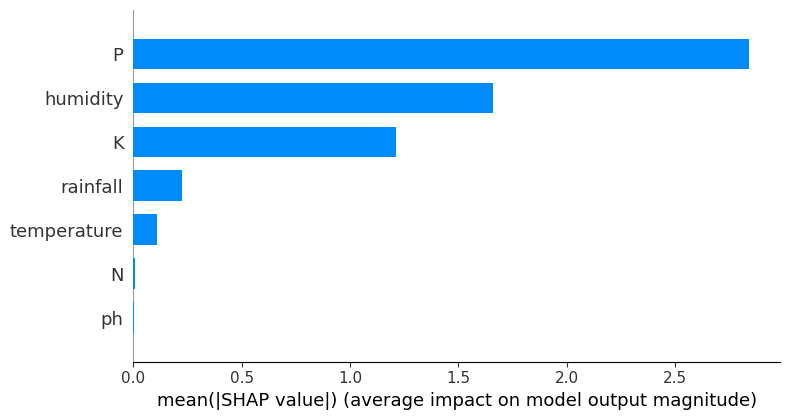


[Balanced] Training SVM for crop: apple


  0%|          | 0/120 [00:00<?, ?it/s]

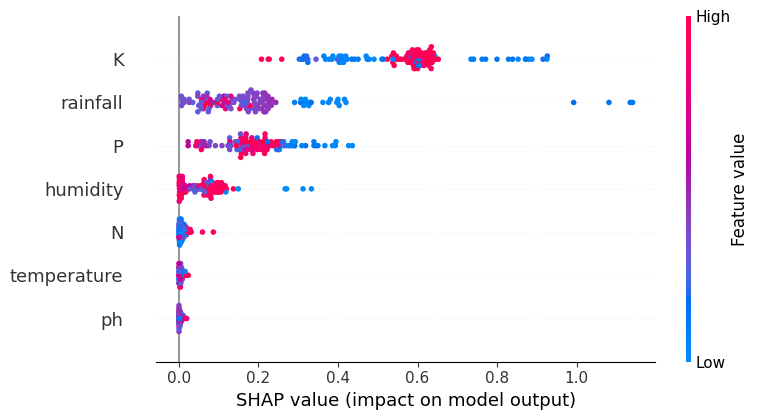

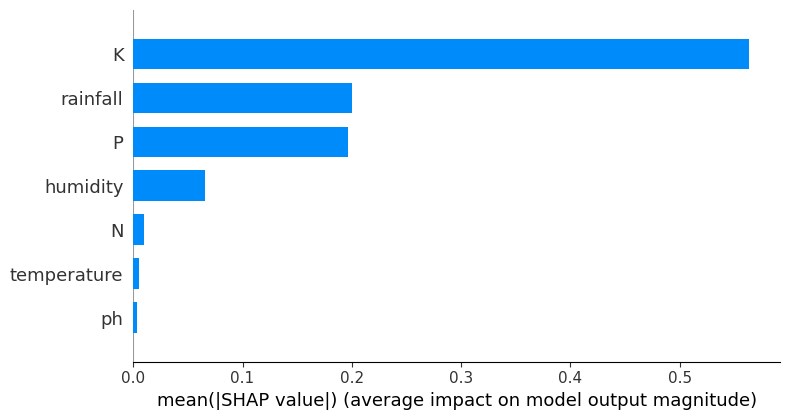


[Balanced] Training MLP for crop: apple


  0%|          | 0/120 [00:00<?, ?it/s]

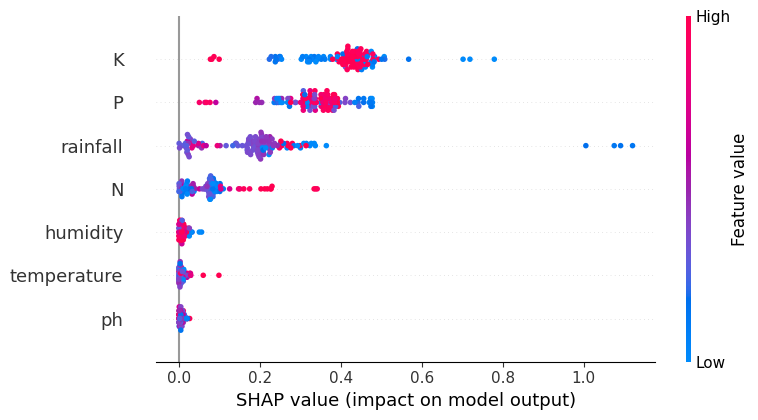

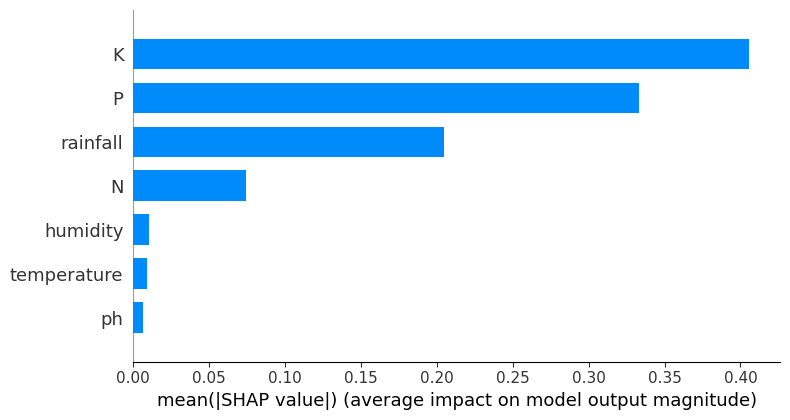

[Balanced] Feature importance saved for crop: apple -> /content/drive/MyDrive/shap_feature_importance_apple_balanced.csv

=== Processing crop: orange ===

[Balanced] Training XGBoost for crop: orange


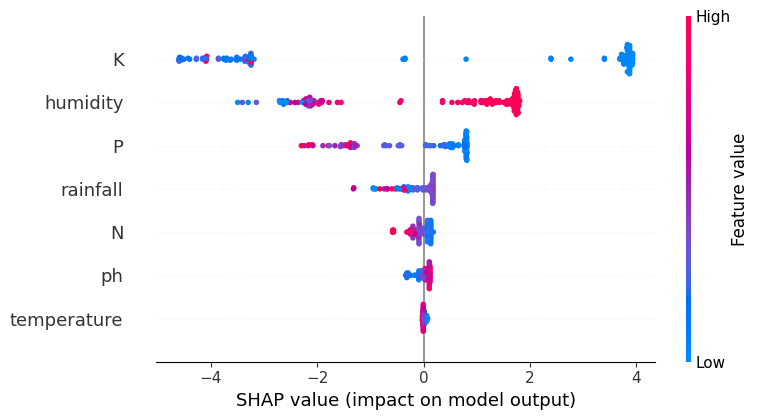

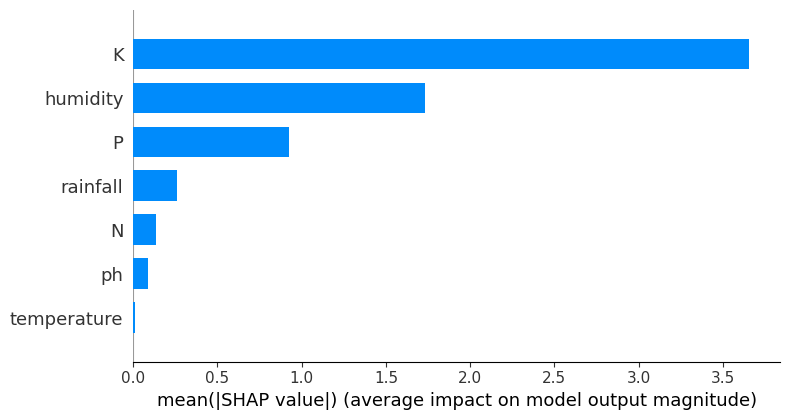


[Balanced] Training SVM for crop: orange


  0%|          | 0/120 [00:00<?, ?it/s]

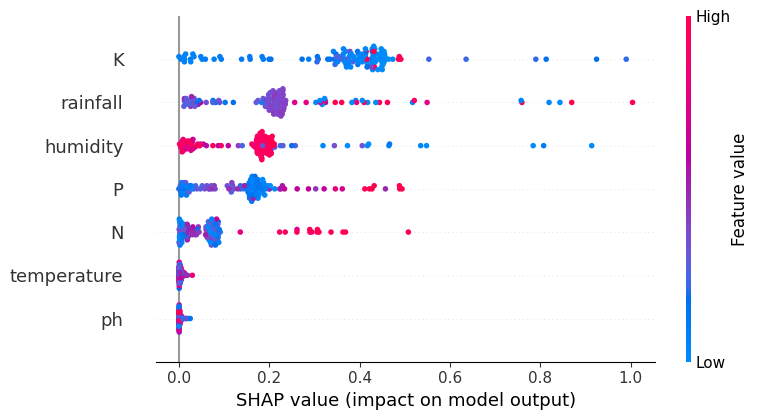

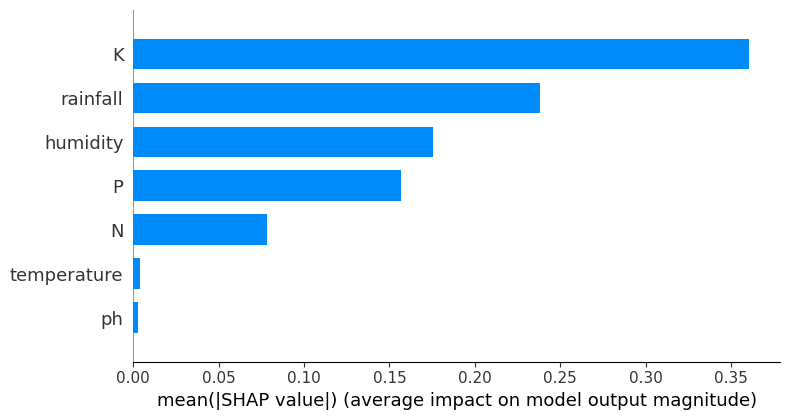


[Balanced] Training MLP for crop: orange


  0%|          | 0/120 [00:00<?, ?it/s]

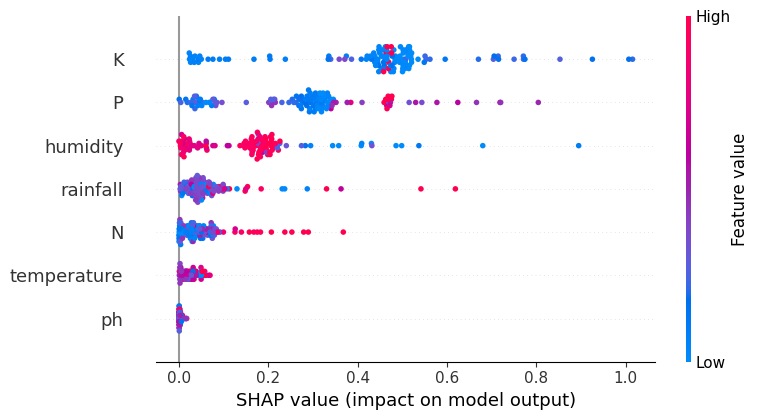

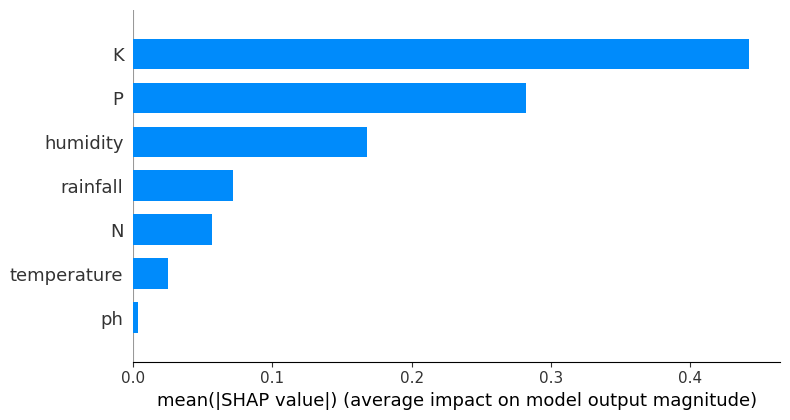

[Balanced] Feature importance saved for crop: orange -> /content/drive/MyDrive/shap_feature_importance_orange_balanced.csv

=== Processing crop: papaya ===

[Balanced] Training XGBoost for crop: papaya


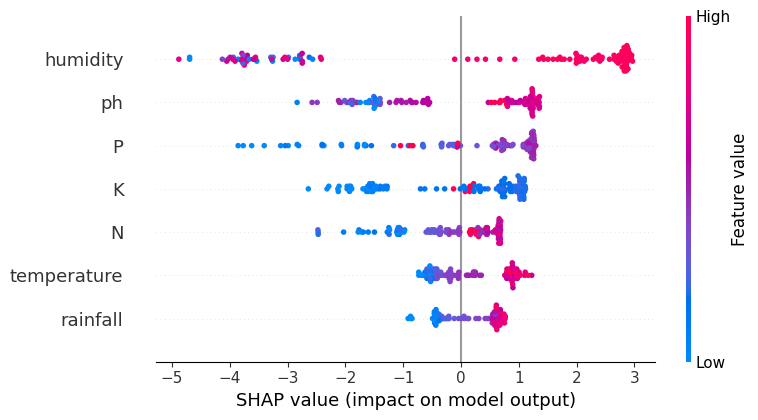

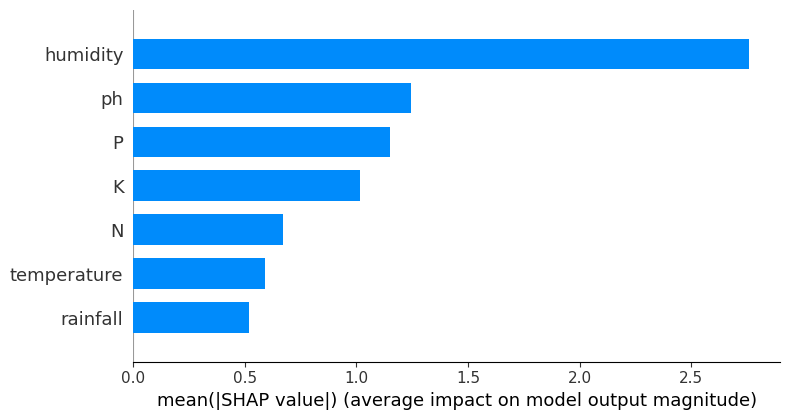


[Balanced] Training SVM for crop: papaya


  0%|          | 0/120 [00:00<?, ?it/s]

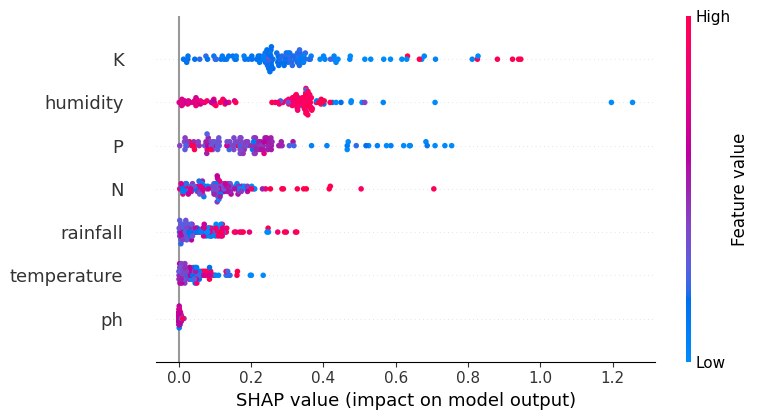

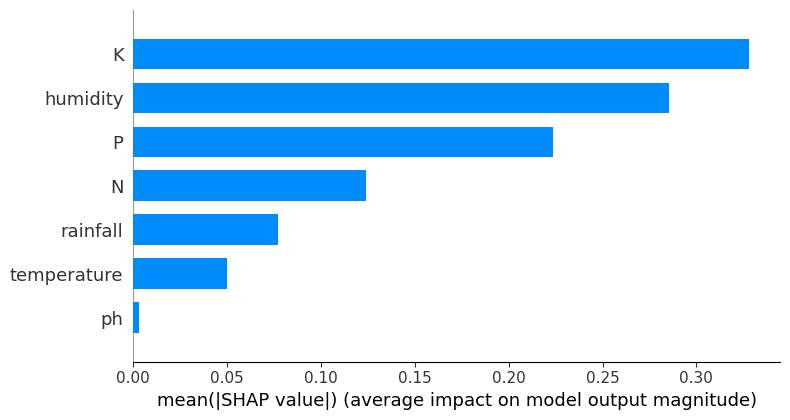


[Balanced] Training MLP for crop: papaya


  0%|          | 0/120 [00:00<?, ?it/s]

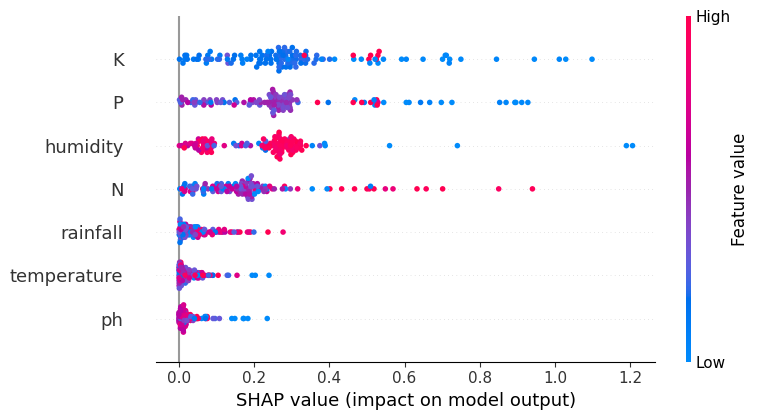

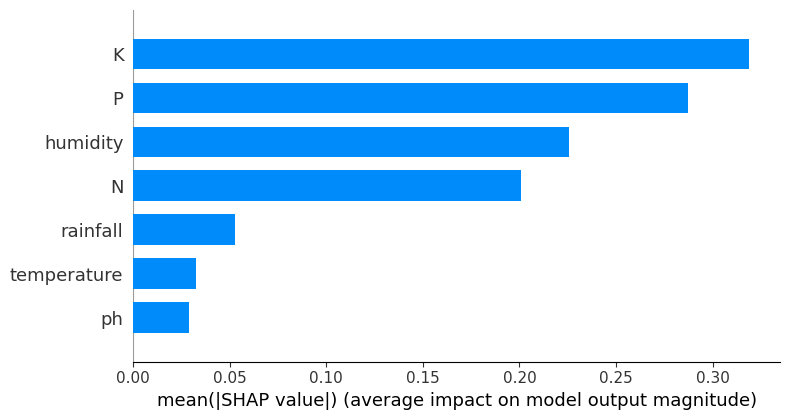

[Balanced] Feature importance saved for crop: papaya -> /content/drive/MyDrive/shap_feature_importance_papaya_balanced.csv

=== Processing crop: coconut ===

[Balanced] Training XGBoost for crop: coconut


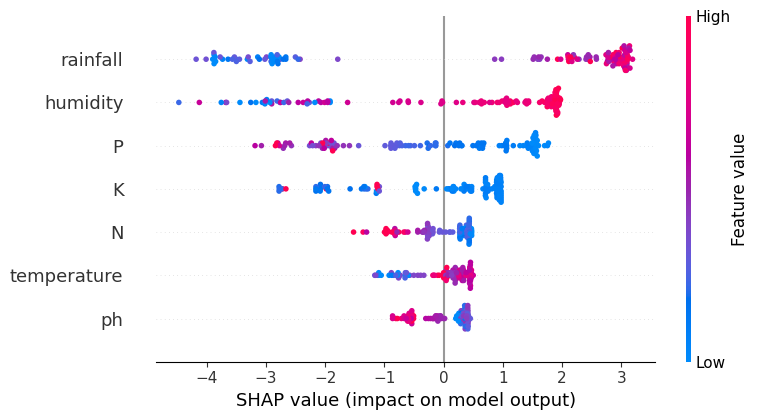

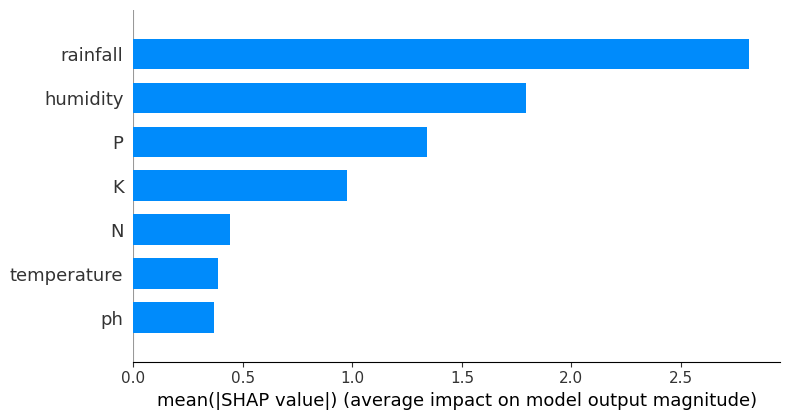


[Balanced] Training SVM for crop: coconut


  0%|          | 0/120 [00:00<?, ?it/s]

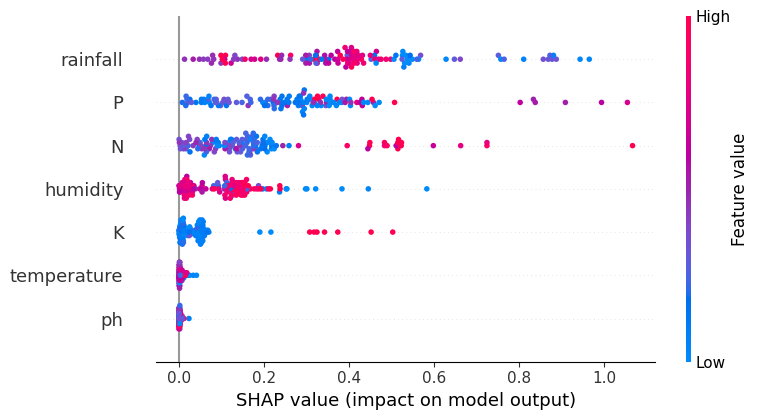

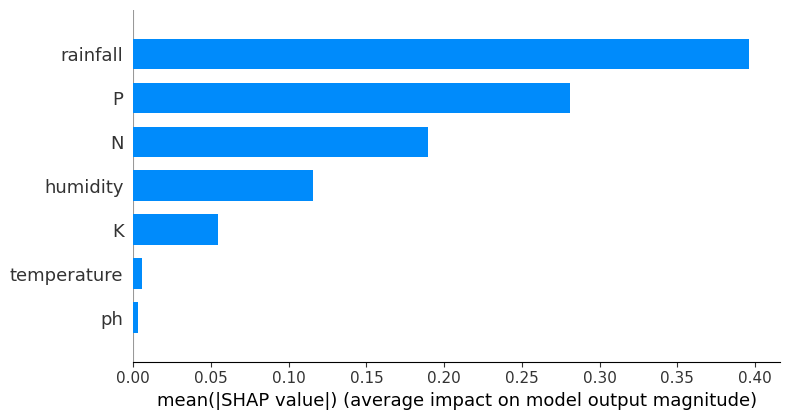


[Balanced] Training MLP for crop: coconut


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


  0%|          | 0/120 [00:00<?, ?it/s]

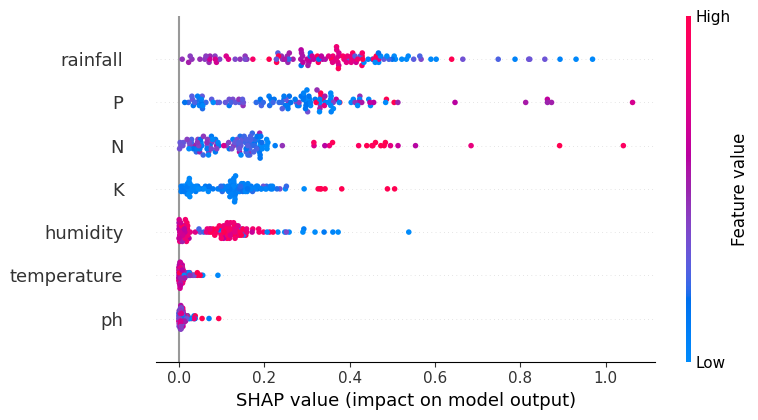

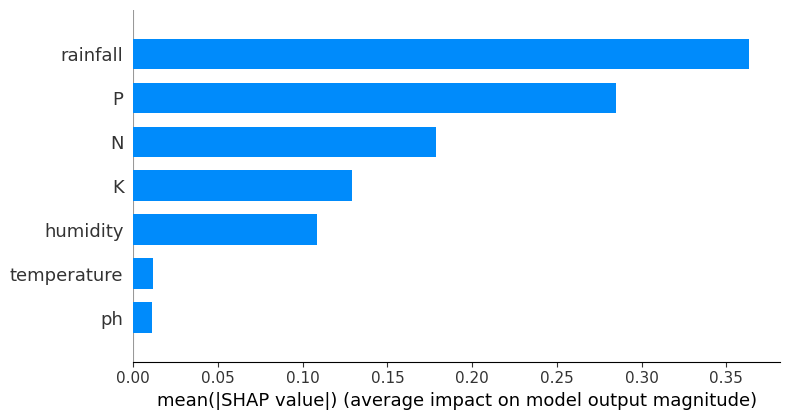

[Balanced] Feature importance saved for crop: coconut -> /content/drive/MyDrive/shap_feature_importance_coconut_balanced.csv

=== Processing crop: cotton ===

[Balanced] Training XGBoost for crop: cotton


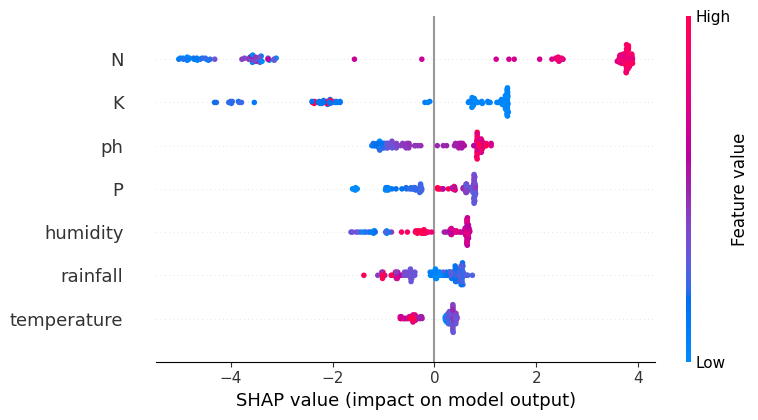

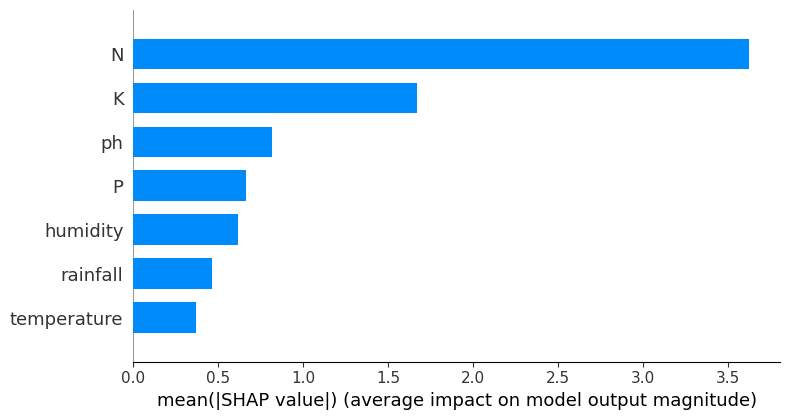


[Balanced] Training SVM for crop: cotton


  0%|          | 0/120 [00:00<?, ?it/s]

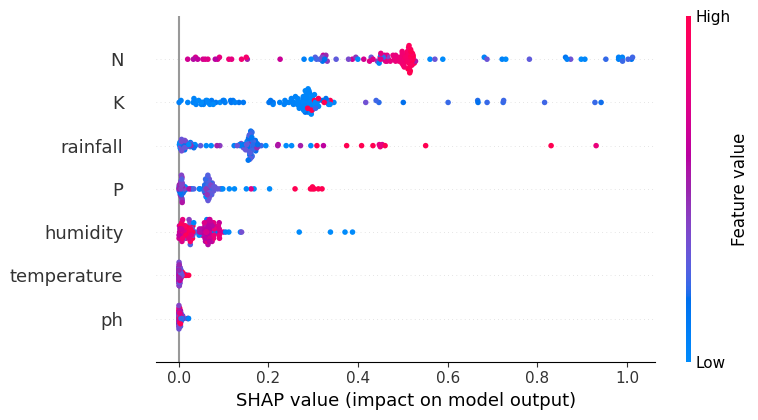

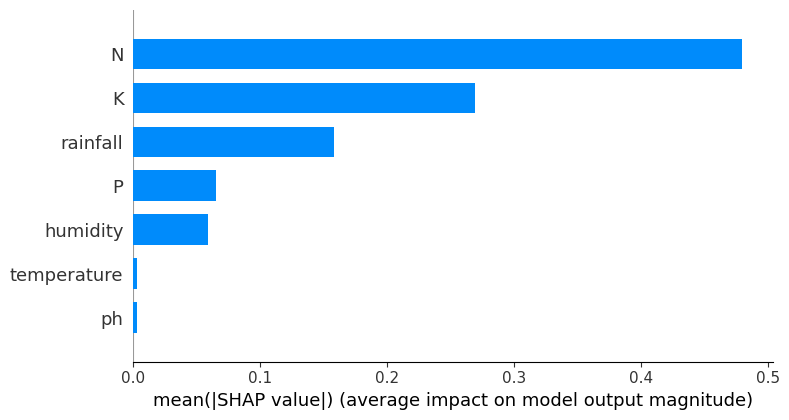


[Balanced] Training MLP for crop: cotton


  0%|          | 0/120 [00:00<?, ?it/s]

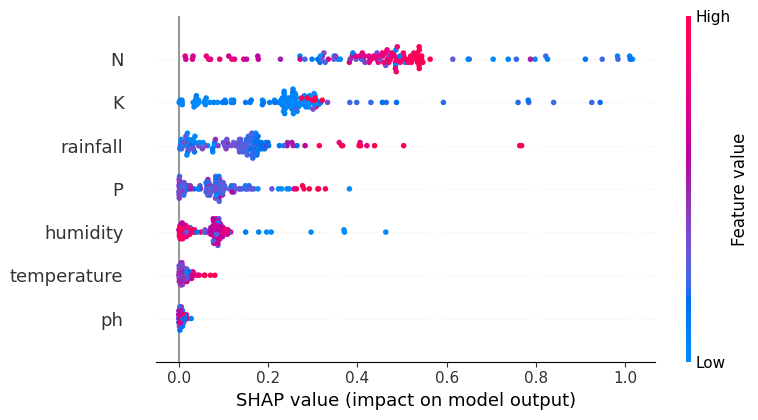

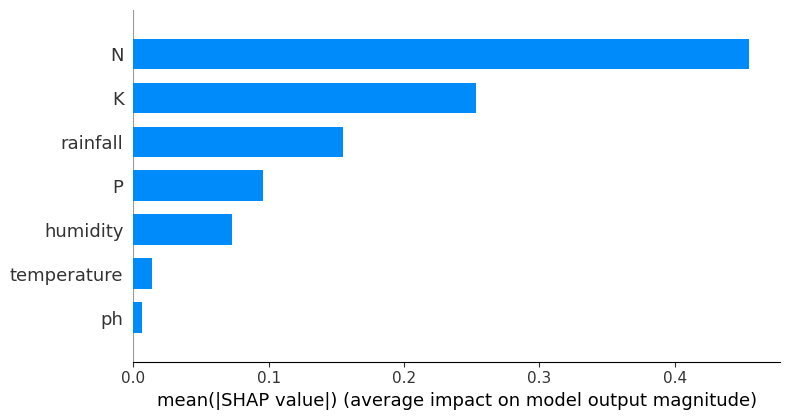

[Balanced] Feature importance saved for crop: cotton -> /content/drive/MyDrive/shap_feature_importance_cotton_balanced.csv

=== Processing crop: jute ===

[Balanced] Training XGBoost for crop: jute


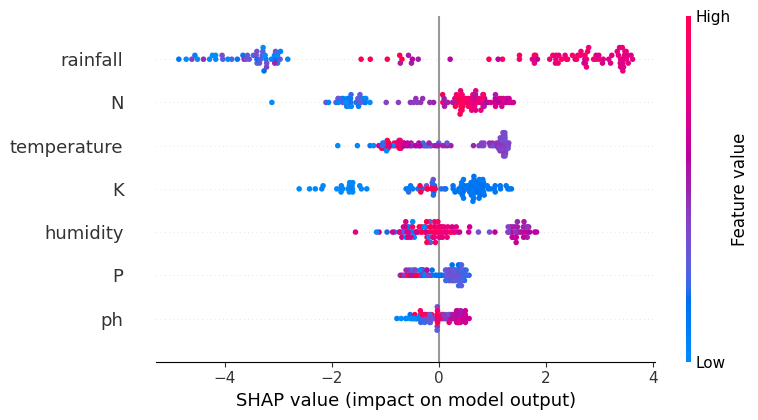

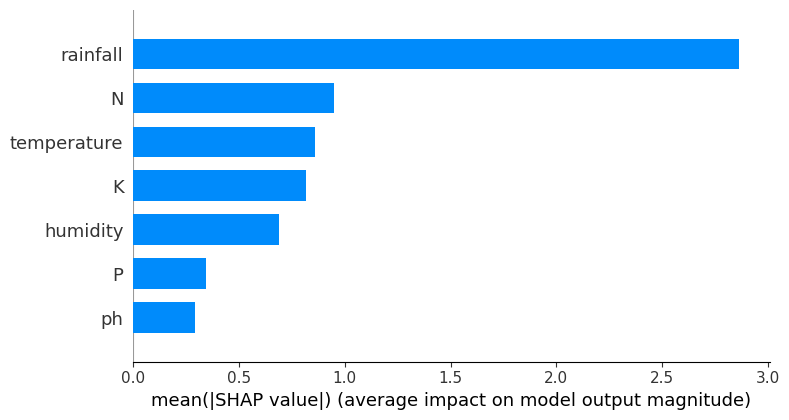


[Balanced] Training SVM for crop: jute


  0%|          | 0/120 [00:00<?, ?it/s]

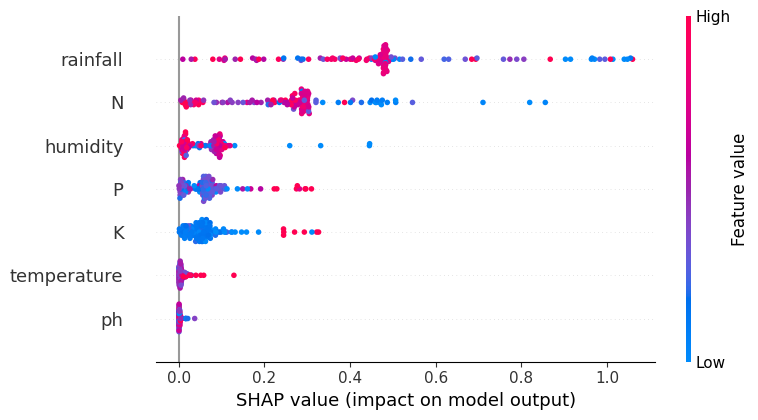

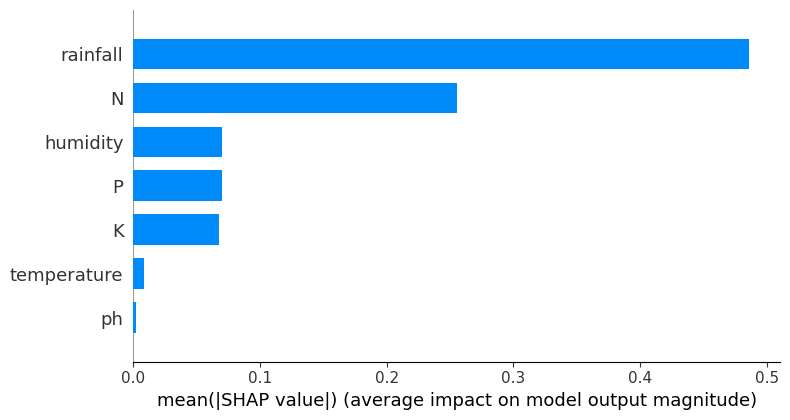


[Balanced] Training MLP for crop: jute


  0%|          | 0/120 [00:00<?, ?it/s]

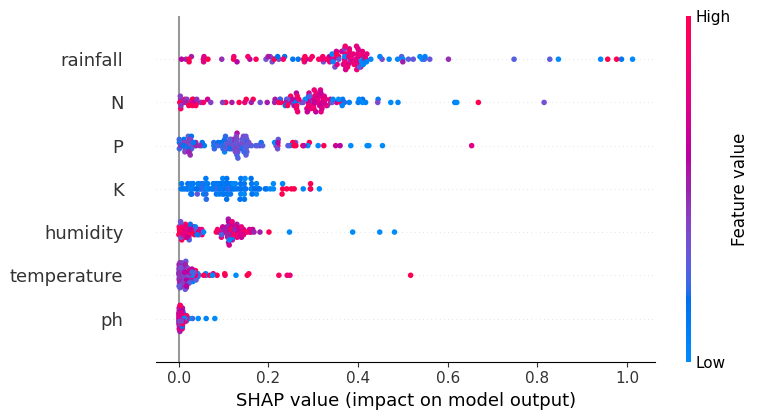

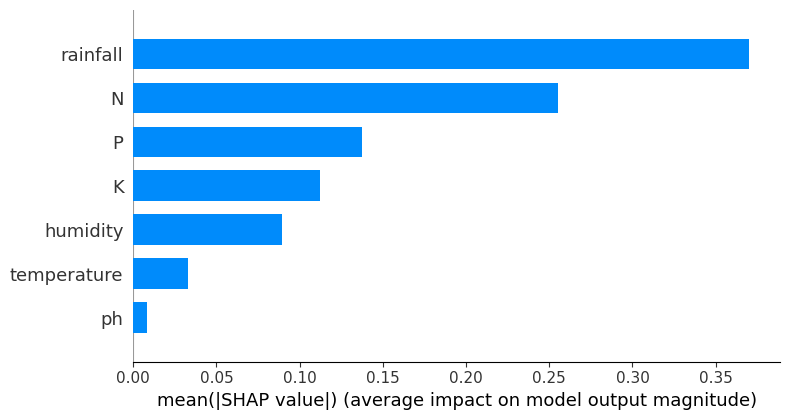

[Balanced] Feature importance saved for crop: jute -> /content/drive/MyDrive/shap_feature_importance_jute_balanced.csv

=== Processing crop: coffee ===

[Balanced] Training XGBoost for crop: coffee


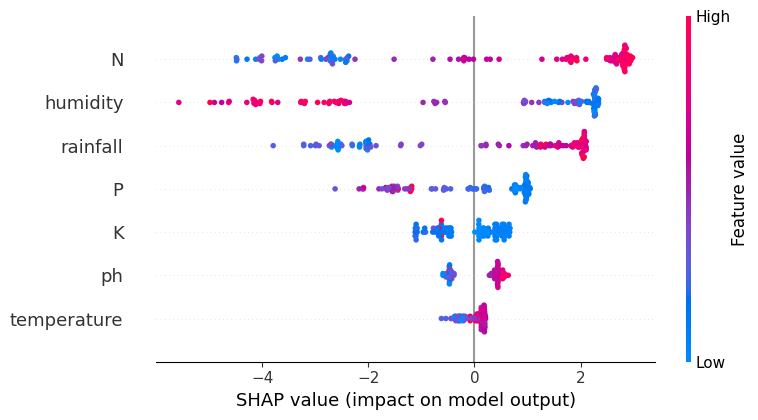

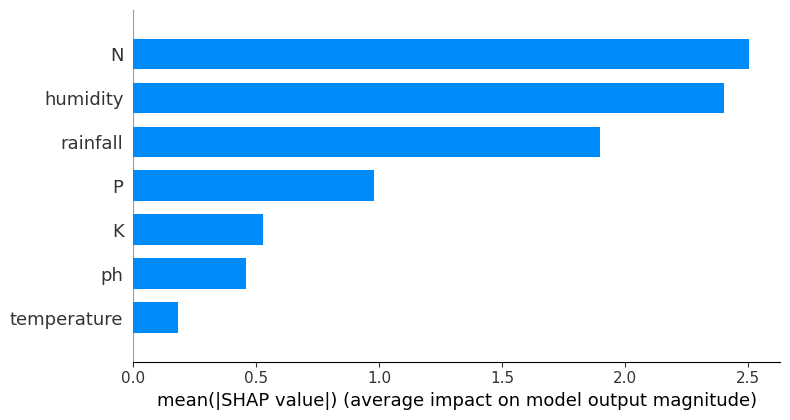


[Balanced] Training SVM for crop: coffee


  0%|          | 0/120 [00:00<?, ?it/s]

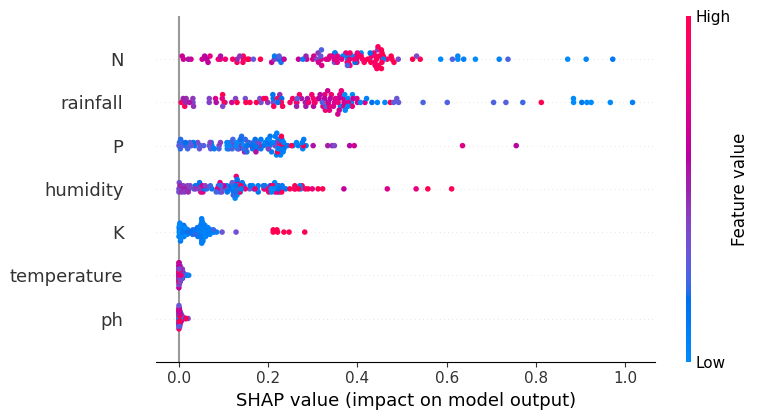

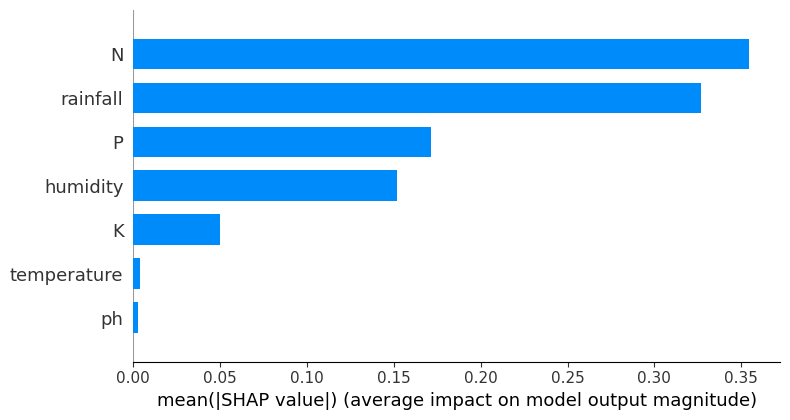


[Balanced] Training MLP for crop: coffee


  0%|          | 0/120 [00:00<?, ?it/s]

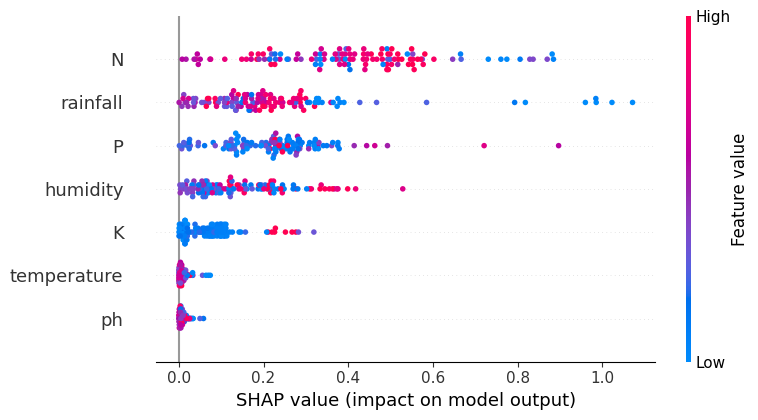

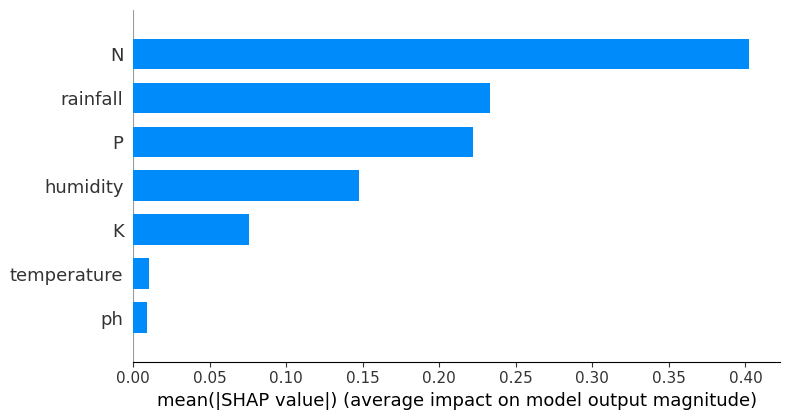

[Balanced] Feature importance saved for crop: coffee -> /content/drive/MyDrive/shap_feature_importance_coffee_balanced.csv


In [7]:
import shap
import numpy as np
import pandas as pd
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split

# ----------------------
# Helper: SVM SHAP
# ----------------------
def explain_svm_with_shap(model, X_train, X_test, feature_names):
    X_train_np = np.array(X_train)
    X_test_np = np.array(X_test)

    explainer = shap.KernelExplainer(
        model.predict_proba,
        shap.sample(X_train_np, 50, random_state=42)
    )
    raw_shap = np.array(explainer.shap_values(X_test_np, nsamples=100))
    if raw_shap.shape[0] != 2:  # If class axis not first
        raw_shap = np.transpose(raw_shap, (2, 0, 1))
    shap_values_combined = np.sum(np.abs(raw_shap), axis=0)
    assert shap_values_combined.shape == (len(X_test), len(feature_names))

    shap.summary_plot(shap_values_combined, X_test, feature_names=feature_names, show=True)
    shap.summary_plot(shap_values_combined, X_test, feature_names=feature_names, plot_type="bar", show=True)
    return shap_values_combined

# ----------------------
# Helper: MLP SHAP
# ----------------------
def explain_mlp_with_shap(model, X_train, X_test, feature_names):
    X_train_np = np.array(X_train)
    X_test_np = np.array(X_test)

    explainer = shap.KernelExplainer(
        model.predict_proba,
        shap.sample(X_train_np, 50, random_state=42)
    )
    raw_shap = np.array(explainer.shap_values(X_test_np, nsamples=100))
    if raw_shap.shape[0] != 2:
        raw_shap = np.transpose(raw_shap, (2, 0, 1))
    shap_values_combined = np.sum(np.abs(raw_shap), axis=0)
    assert shap_values_combined.shape == (len(X_test), len(feature_names))

    shap.summary_plot(shap_values_combined, X_test, feature_names=feature_names, show=True)
    shap.summary_plot(shap_values_combined, X_test, feature_names=feature_names, plot_type="bar", show=True)
    return shap_values_combined

# ----------------------
# Main SHAP runner for balanced dataset (XGB, SVM, MLP)
# ----------------------
def run_shap_for_crop(X_train, X_test, y_train, crop_name):
    models = {
        "XGBoost": XGBClassifier(
            n_estimators=300, learning_rate=0.1, max_depth=5,
            subsample=0.8, colsample_bytree=0.8, random_state=42,
            eval_metric='logloss'
        ),
        "SVM": SVC(kernel='rbf', probability=True, random_state=42),
        "MLP": MLPClassifier(hidden_layer_sizes=(50,), max_iter=500, random_state=42)
    }

    fi_all = {}

    for name, model in models.items():
        print(f"\n[Balanced] Training {name} for crop: {crop_name}")
        model.fit(X_train, y_train)

        if name == "XGBoost":
            explainer = shap.TreeExplainer(model)
            shap_values = explainer.shap_values(X_test)
            mean_abs_shap = np.abs(shap_values).mean(axis=0)
            shap.summary_plot(shap_values, X_test, feature_names=X_train.columns, show=True)
            shap.summary_plot(shap_values, X_test, feature_names=X_train.columns, plot_type="bar", show=True)

        elif name == "SVM":
            mean_abs_shap = explain_svm_with_shap(model, X_train, X_test, X_train.columns)

        elif name == "MLP":
            mean_abs_shap = explain_mlp_with_shap(model, X_train, X_test, X_train.columns)

        fi_all[name] = dict(zip(X_train.columns, mean_abs_shap))

    # Save feature importance for this crop
    output_path = f"/content/drive/MyDrive/shap_feature_importance_{crop_name}_balanced.csv"
    pd.DataFrame(fi_all).T.to_csv(output_path)
    print(f"[Balanced] Feature importance saved for crop: {crop_name} -> {output_path}")

# ----------------------
# Load dataset
# ----------------------
df = pd.read_csv('/content/drive/MyDrive/Crop_recommendation_expanded.csv')

# ----------------------
# Loop for all crops (Balanced only)
# ----------------------
for crop in df['label'].unique():
    print(f"\n=== Processing crop: {crop} ===")

    # Binary target for this crop
    df['target'] = (df['label'] == crop).astype(int)

    # Create balanced dataset
    df_pos = df[df['target'] == 1]
    df_neg = df[df['target'] == 0].sample(n=len(df_pos), random_state=42)
    df_bal = pd.concat([df_pos, df_neg]).sample(frac=1, random_state=42).reset_index(drop=True)

    X_bal = df_bal.drop(columns=['label', 'target'])
    y_bal = df_bal['target']

    # Train/test split
    X_train, X_test, y_train, y_test = train_test_split(
        X_bal, y_bal, test_size=0.2, stratify=y_bal, random_state=42
    )

    # Run SHAP for this crop
    run_shap_for_crop(X_train, X_test, y_train, crop)


Shap implementation for log reg for all crops


=== Processing crop: rice ===

[Balanced] Training Logistic Regression for SHAP (Crop: rice)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


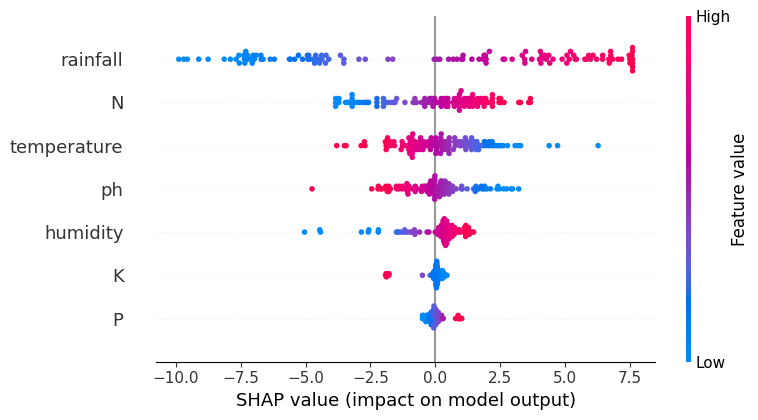

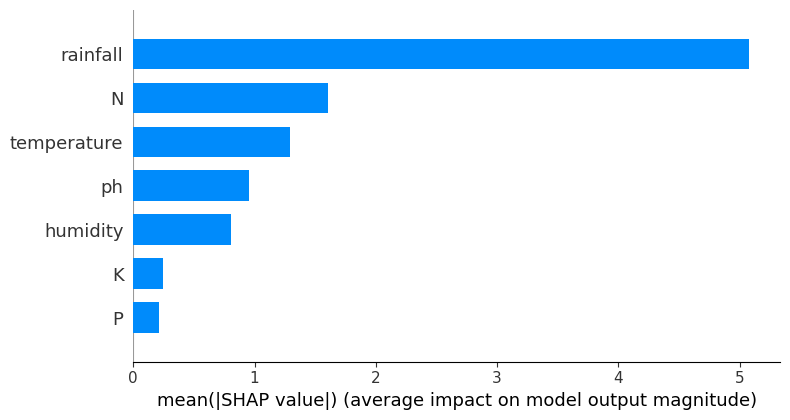

 Saved SHAP results for rice -> /content/drive/MyDrive/logreg_shap_rice_balanced.csv

=== Processing crop: maize ===

[Balanced] Training Logistic Regression for SHAP (Crop: maize)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


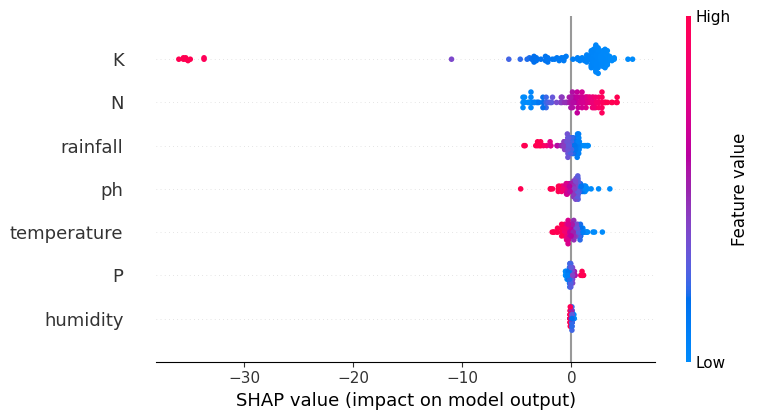

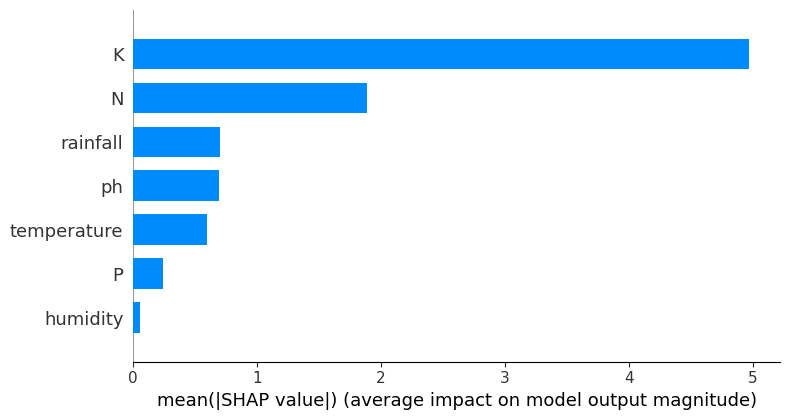

 Saved SHAP results for maize -> /content/drive/MyDrive/logreg_shap_maize_balanced.csv

=== Processing crop: chickpea ===

[Balanced] Training Logistic Regression for SHAP (Crop: chickpea)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


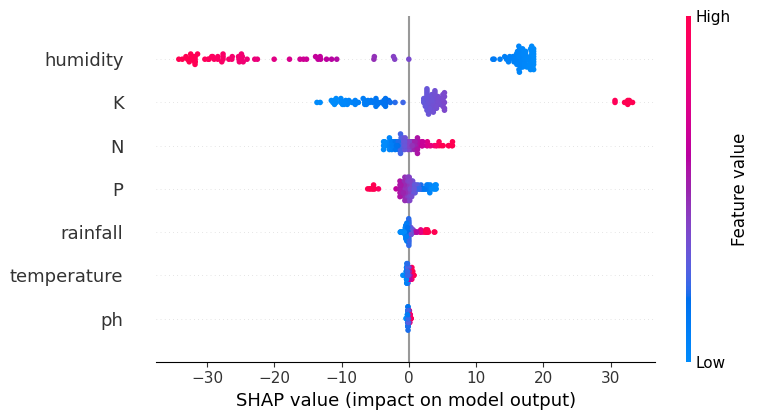

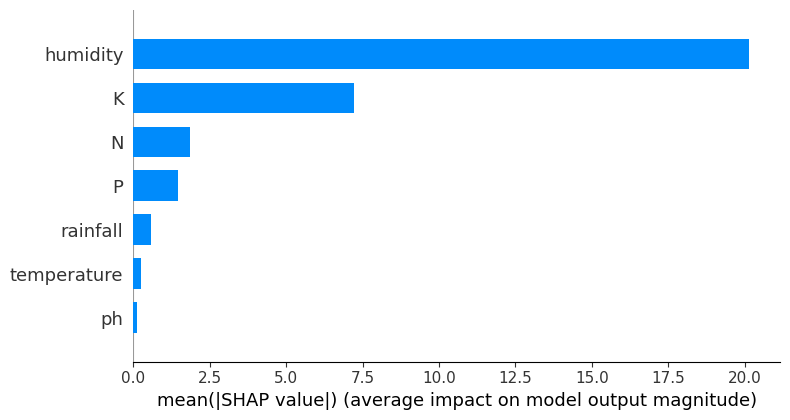

 Saved SHAP results for chickpea -> /content/drive/MyDrive/logreg_shap_chickpea_balanced.csv

=== Processing crop: kidneybeans ===

[Balanced] Training Logistic Regression for SHAP (Crop: kidneybeans)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


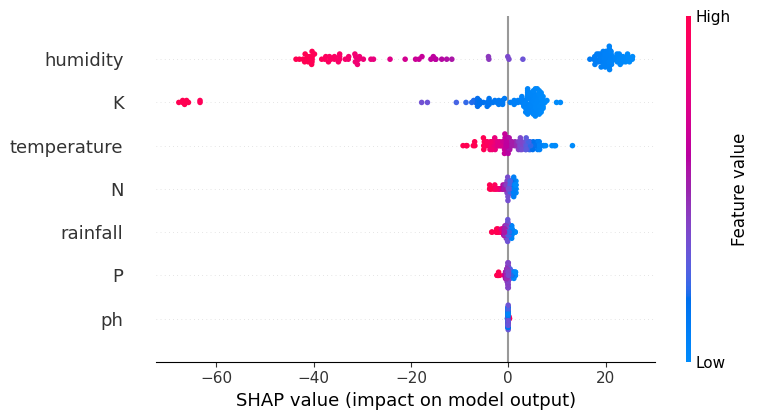

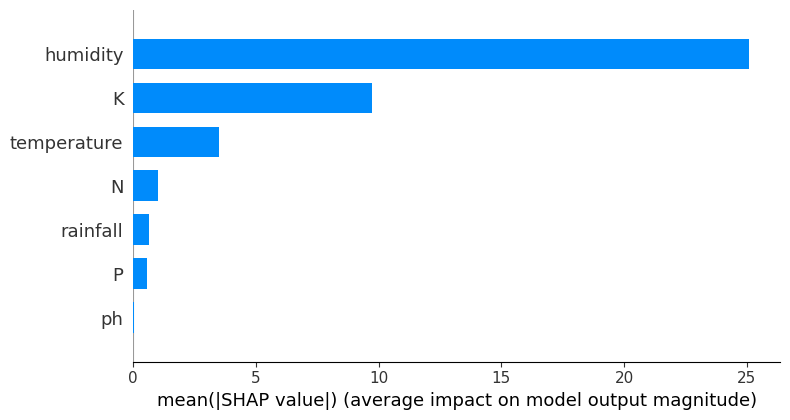

 Saved SHAP results for kidneybeans -> /content/drive/MyDrive/logreg_shap_kidneybeans_balanced.csv

=== Processing crop: pigeonpeas ===

[Balanced] Training Logistic Regression for SHAP (Crop: pigeonpeas)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


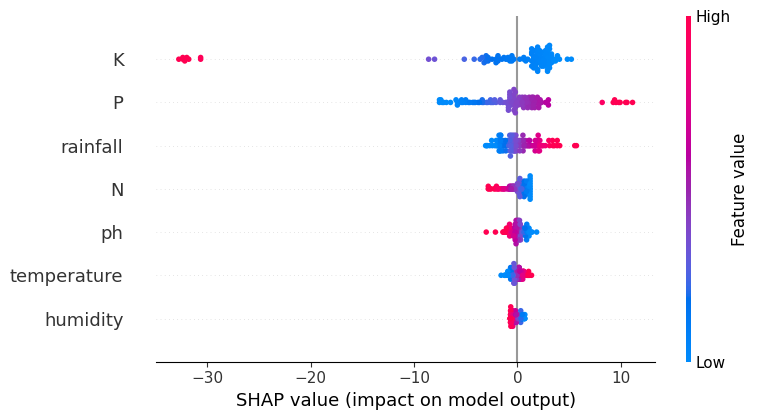

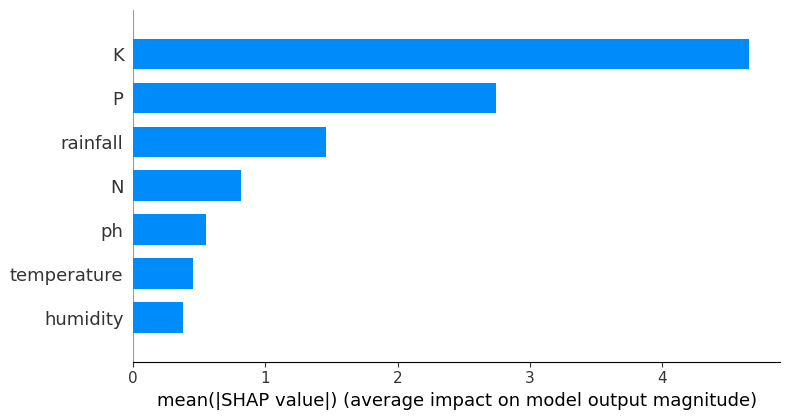

 Saved SHAP results for pigeonpeas -> /content/drive/MyDrive/logreg_shap_pigeonpeas_balanced.csv

=== Processing crop: mothbeans ===

[Balanced] Training Logistic Regression for SHAP (Crop: mothbeans)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


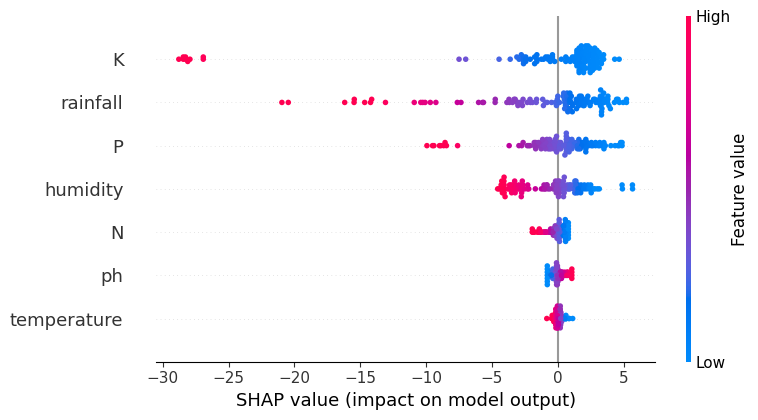

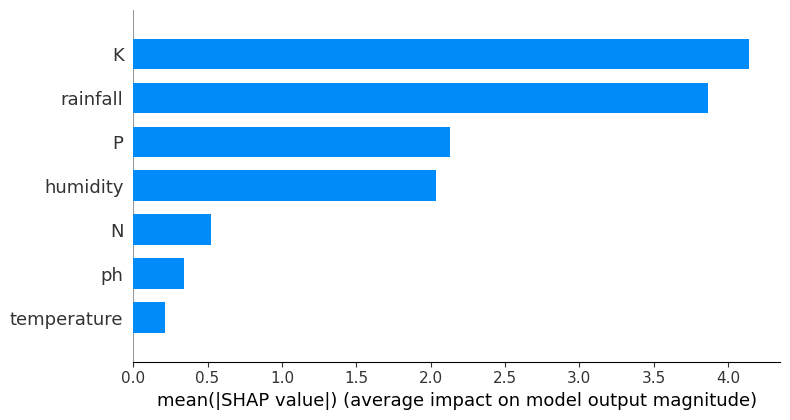

 Saved SHAP results for mothbeans -> /content/drive/MyDrive/logreg_shap_mothbeans_balanced.csv

=== Processing crop: mungbean ===

[Balanced] Training Logistic Regression for SHAP (Crop: mungbean)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


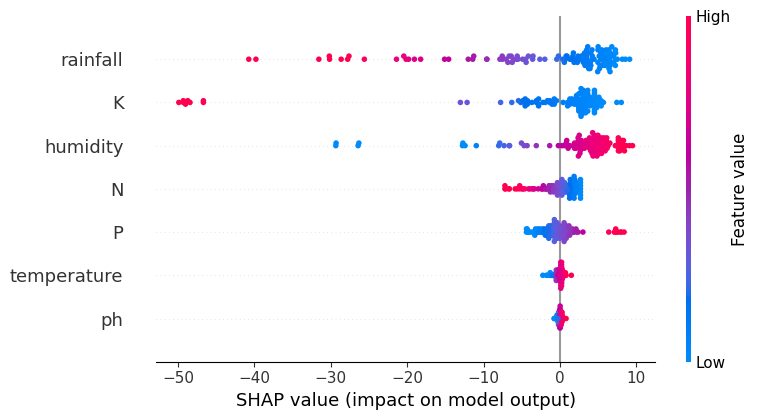

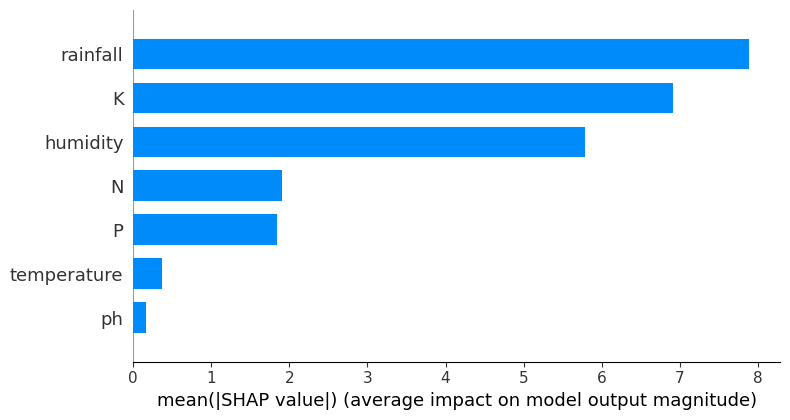

 Saved SHAP results for mungbean -> /content/drive/MyDrive/logreg_shap_mungbean_balanced.csv

=== Processing crop: blackgram ===

[Balanced] Training Logistic Regression for SHAP (Crop: blackgram)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


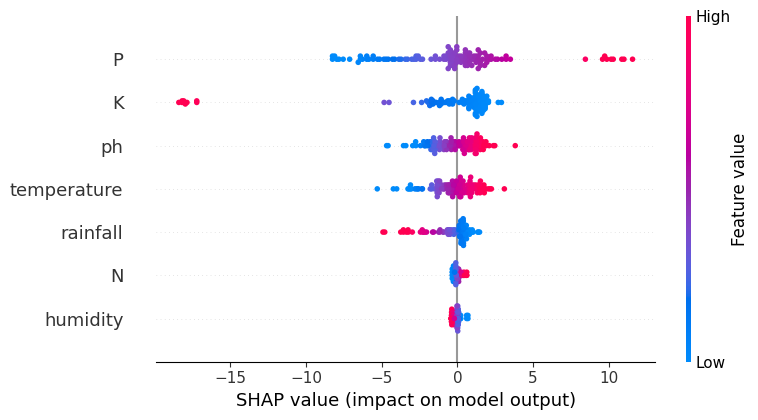

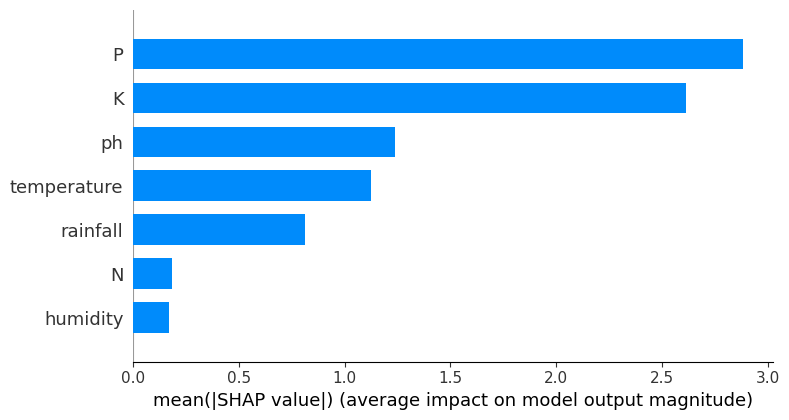

 Saved SHAP results for blackgram -> /content/drive/MyDrive/logreg_shap_blackgram_balanced.csv

=== Processing crop: lentil ===

[Balanced] Training Logistic Regression for SHAP (Crop: lentil)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


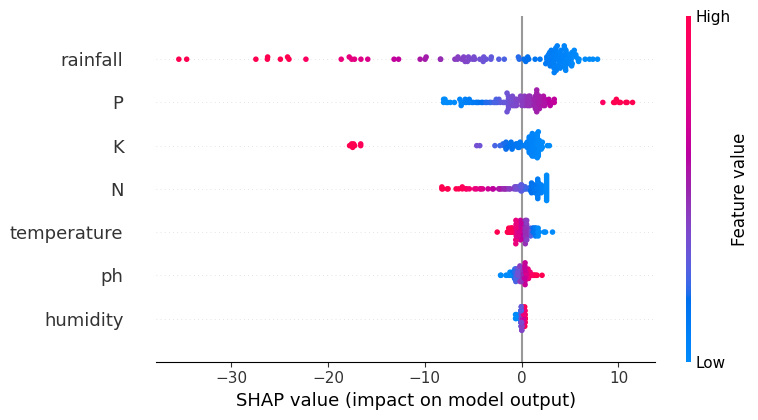

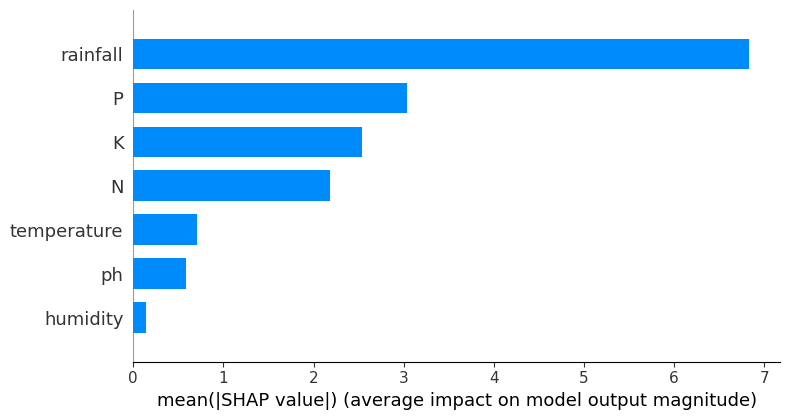

 Saved SHAP results for lentil -> /content/drive/MyDrive/logreg_shap_lentil_balanced.csv

=== Processing crop: pomegranate ===

[Balanced] Training Logistic Regression for SHAP (Crop: pomegranate)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


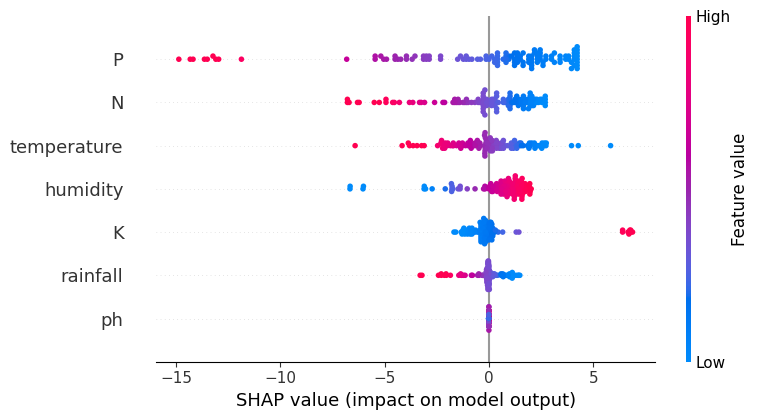

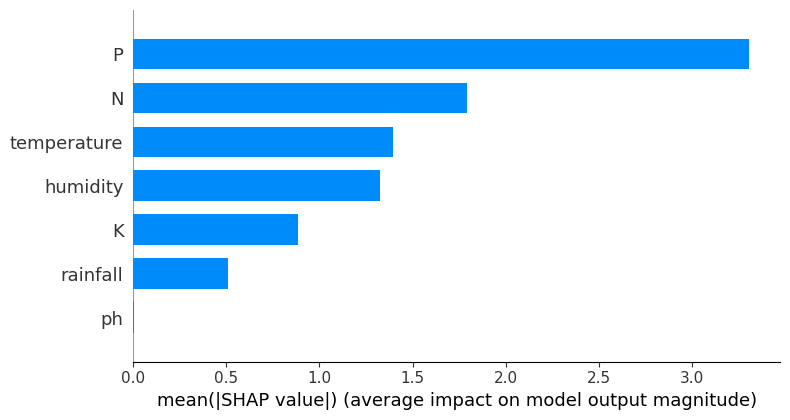

 Saved SHAP results for pomegranate -> /content/drive/MyDrive/logreg_shap_pomegranate_balanced.csv

=== Processing crop: banana ===

[Balanced] Training Logistic Regression for SHAP (Crop: banana)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


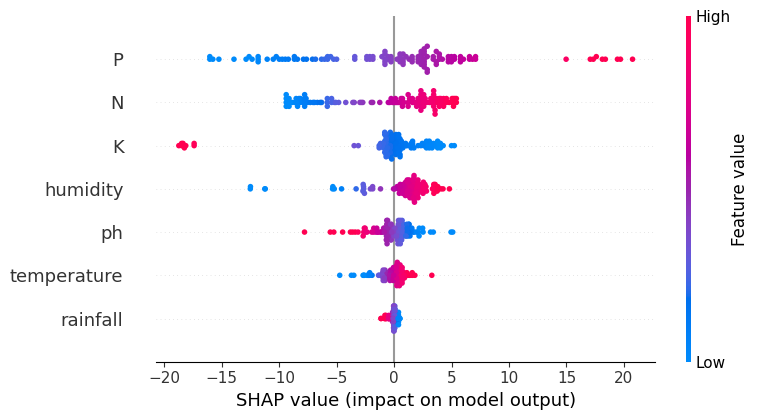

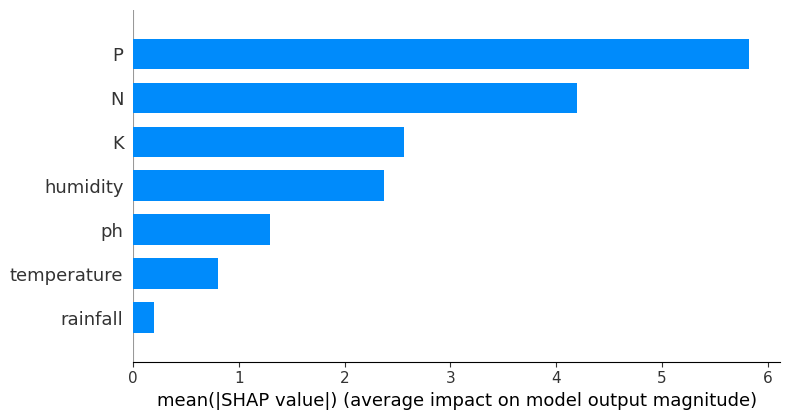

 Saved SHAP results for banana -> /content/drive/MyDrive/logreg_shap_banana_balanced.csv

=== Processing crop: mango ===

[Balanced] Training Logistic Regression for SHAP (Crop: mango)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


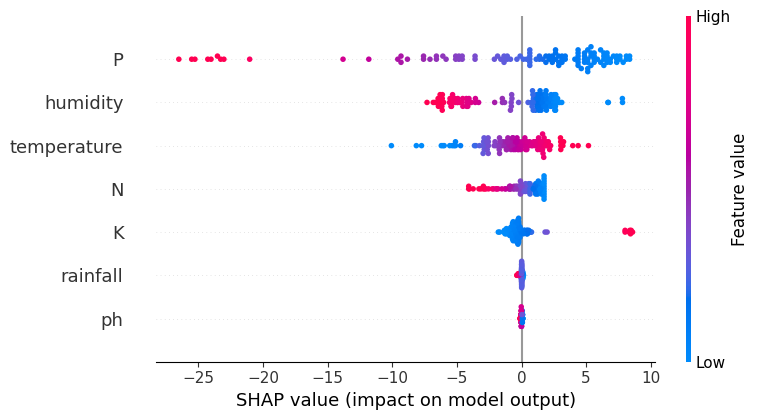

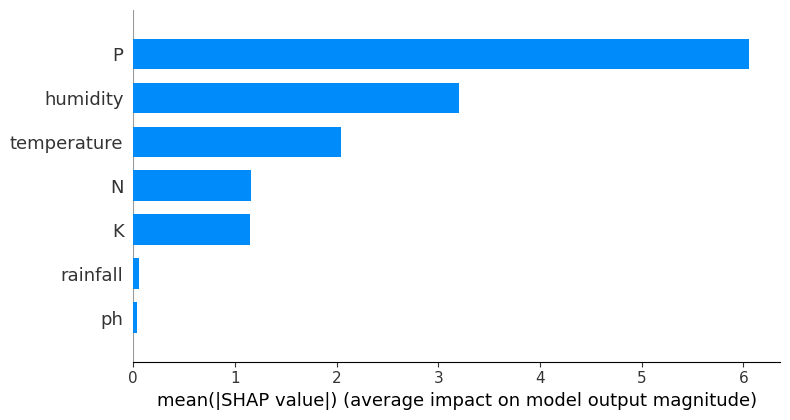

 Saved SHAP results for mango -> /content/drive/MyDrive/logreg_shap_mango_balanced.csv

=== Processing crop: grapes ===

[Balanced] Training Logistic Regression for SHAP (Crop: grapes)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


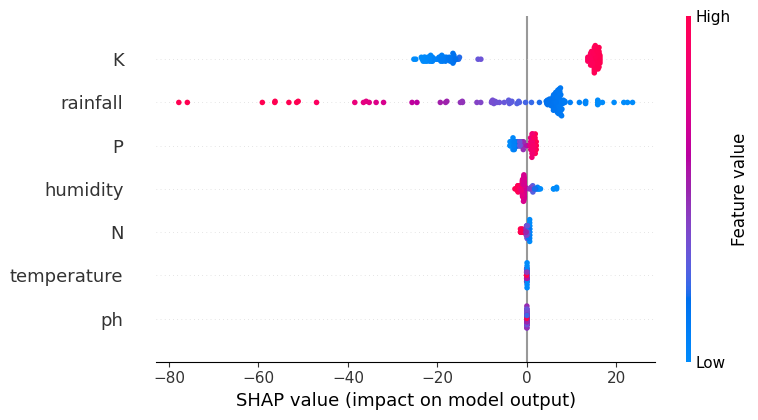

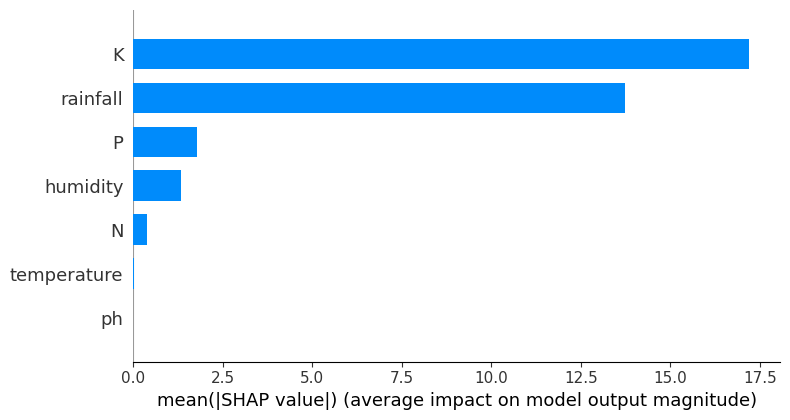

 Saved SHAP results for grapes -> /content/drive/MyDrive/logreg_shap_grapes_balanced.csv

=== Processing crop: watermelon ===

[Balanced] Training Logistic Regression for SHAP (Crop: watermelon)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


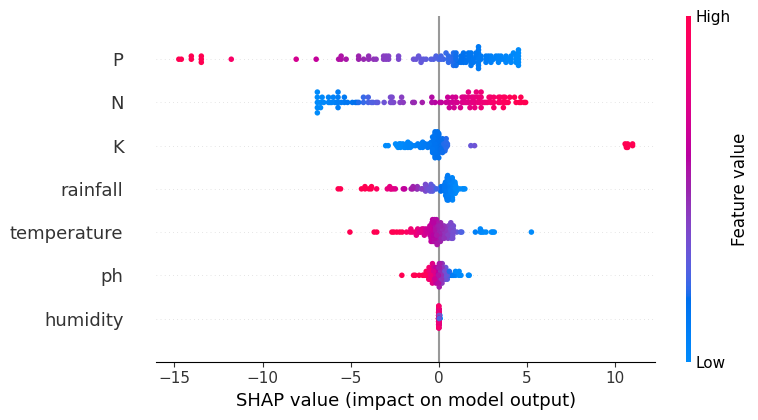

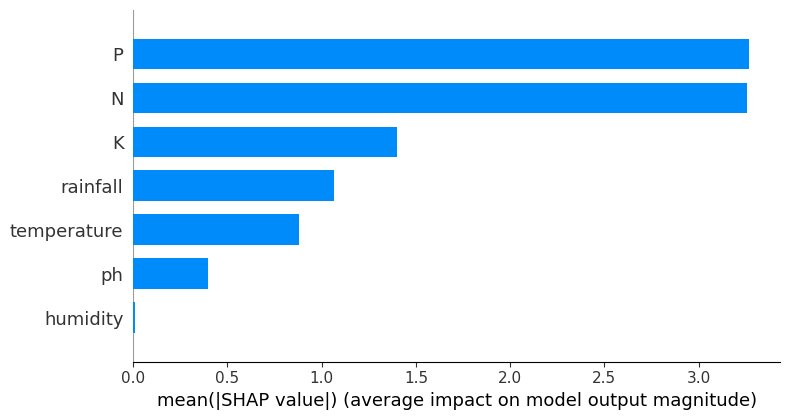

 Saved SHAP results for watermelon -> /content/drive/MyDrive/logreg_shap_watermelon_balanced.csv

=== Processing crop: muskmelon ===

[Balanced] Training Logistic Regression for SHAP (Crop: muskmelon)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


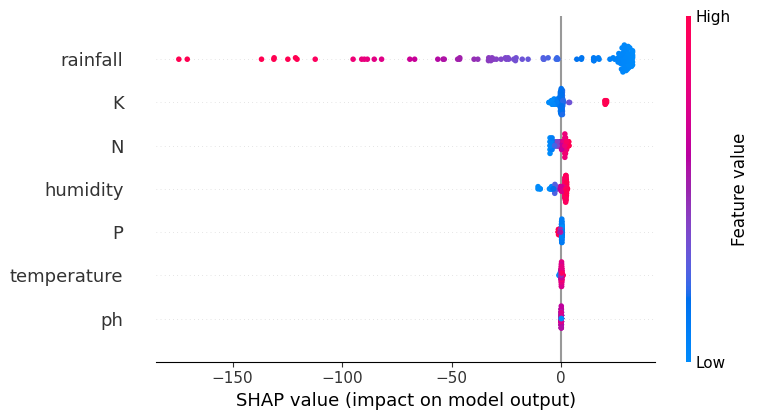

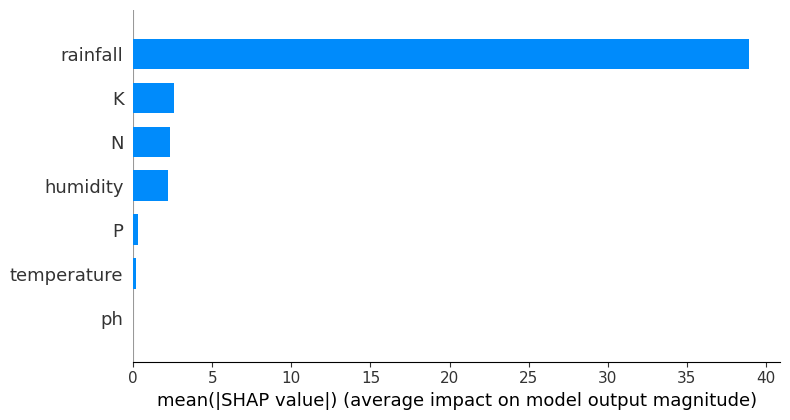

 Saved SHAP results for muskmelon -> /content/drive/MyDrive/logreg_shap_muskmelon_balanced.csv

=== Processing crop: apple ===

[Balanced] Training Logistic Regression for SHAP (Crop: apple)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


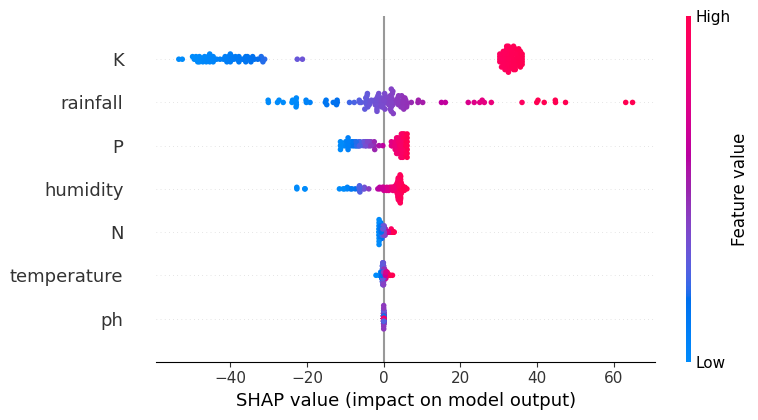

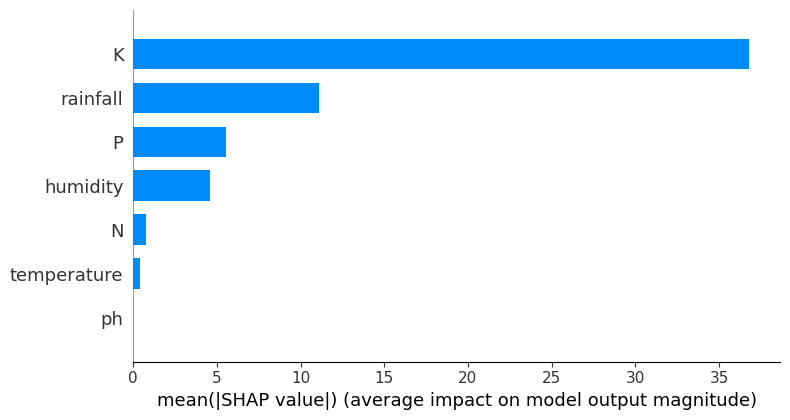

 Saved SHAP results for apple -> /content/drive/MyDrive/logreg_shap_apple_balanced.csv

=== Processing crop: orange ===

[Balanced] Training Logistic Regression for SHAP (Crop: orange)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


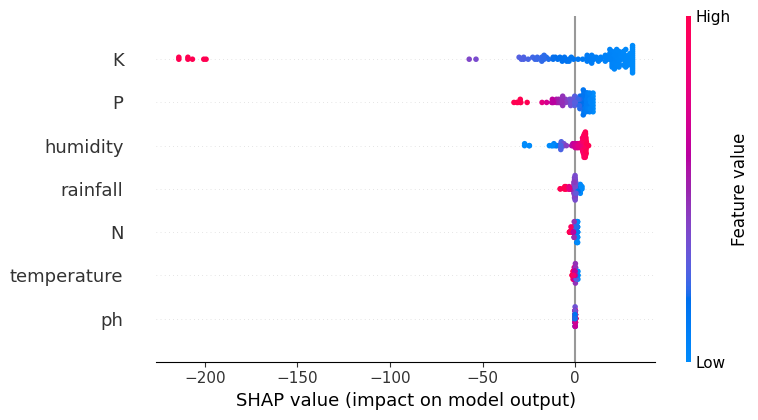

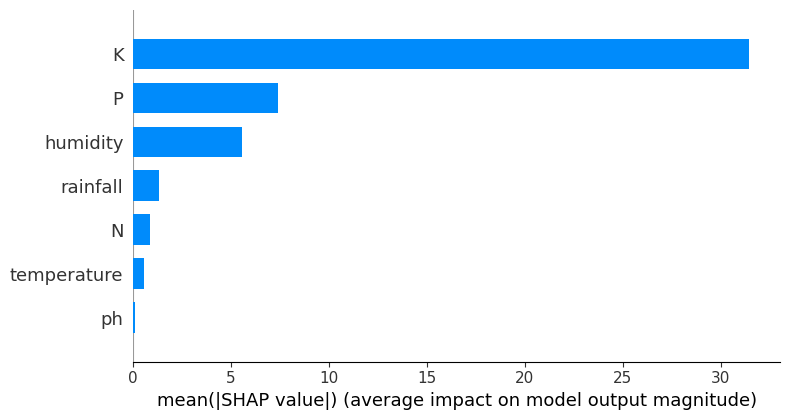

 Saved SHAP results for orange -> /content/drive/MyDrive/logreg_shap_orange_balanced.csv

=== Processing crop: papaya ===

[Balanced] Training Logistic Regression for SHAP (Crop: papaya)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


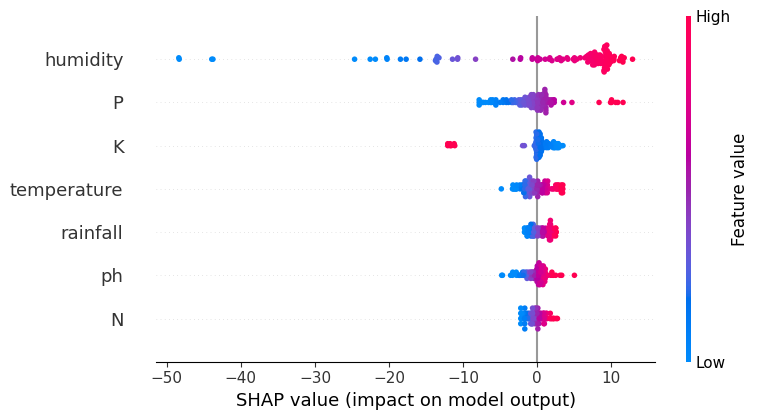

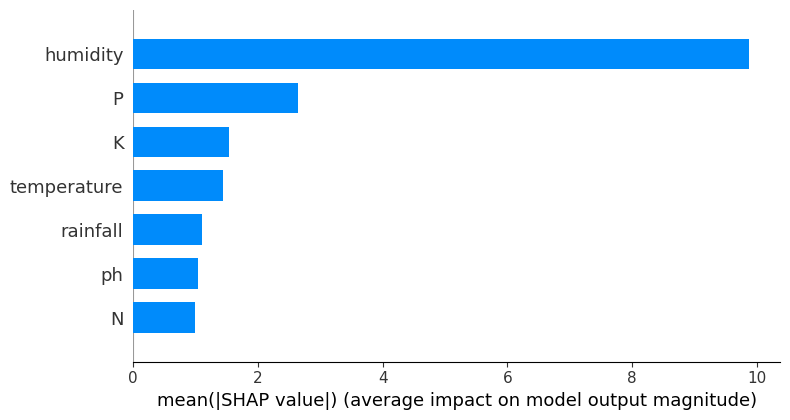

 Saved SHAP results for papaya -> /content/drive/MyDrive/logreg_shap_papaya_balanced.csv

=== Processing crop: coconut ===

[Balanced] Training Logistic Regression for SHAP (Crop: coconut)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


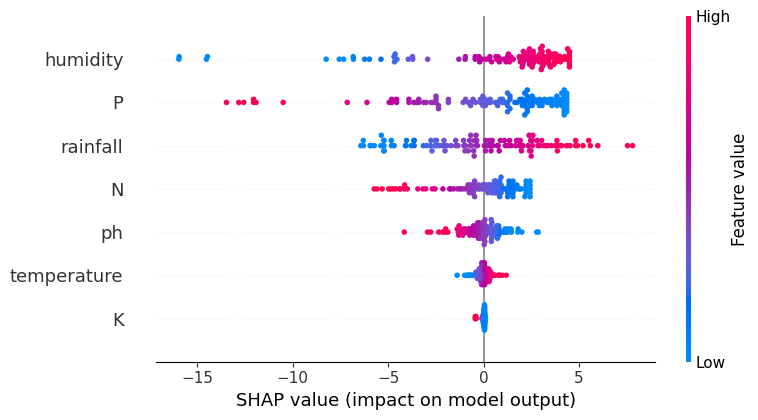

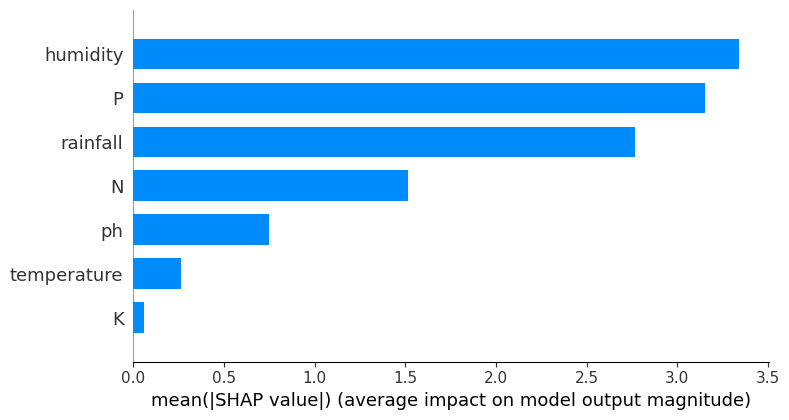

 Saved SHAP results for coconut -> /content/drive/MyDrive/logreg_shap_coconut_balanced.csv

=== Processing crop: cotton ===

[Balanced] Training Logistic Regression for SHAP (Crop: cotton)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


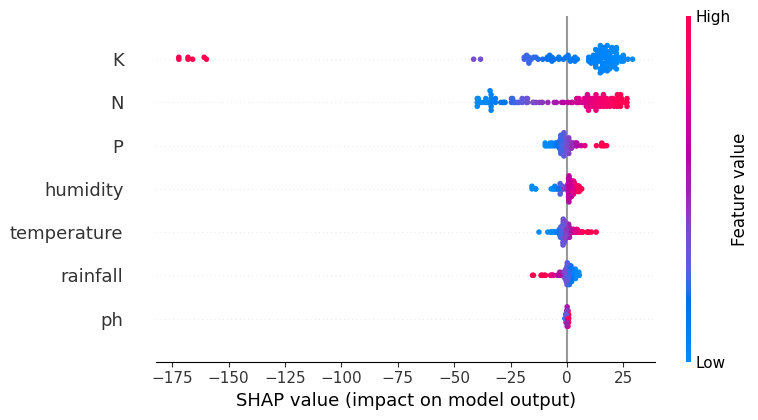

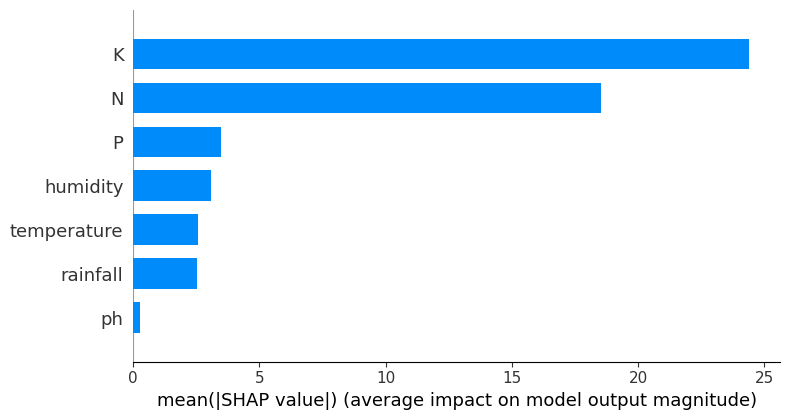

 Saved SHAP results for cotton -> /content/drive/MyDrive/logreg_shap_cotton_balanced.csv

=== Processing crop: jute ===

[Balanced] Training Logistic Regression for SHAP (Crop: jute)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


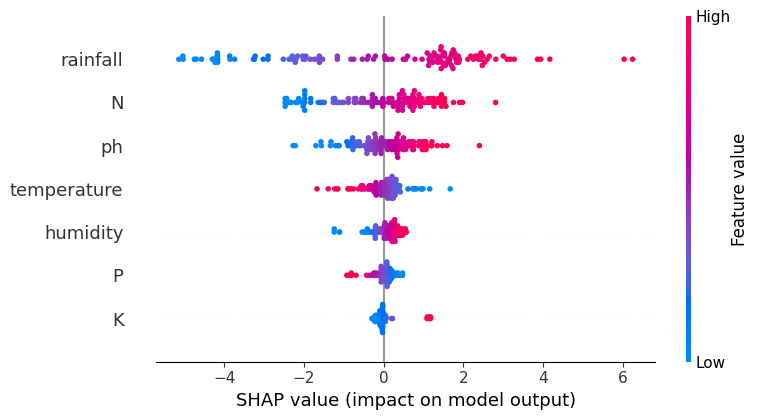

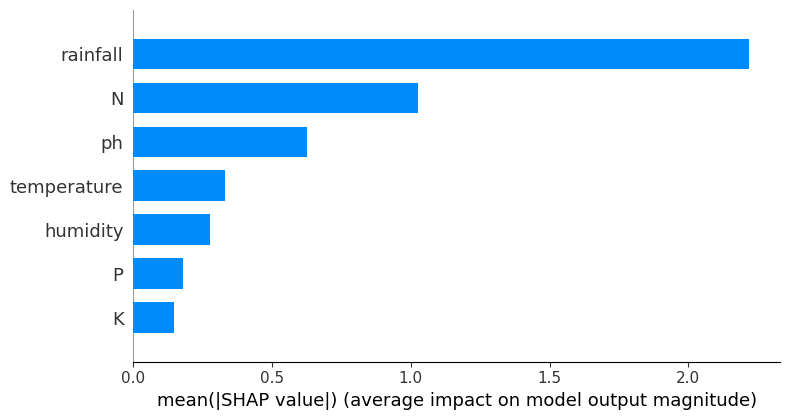

 Saved SHAP results for jute -> /content/drive/MyDrive/logreg_shap_jute_balanced.csv

=== Processing crop: coffee ===

[Balanced] Training Logistic Regression for SHAP (Crop: coffee)...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


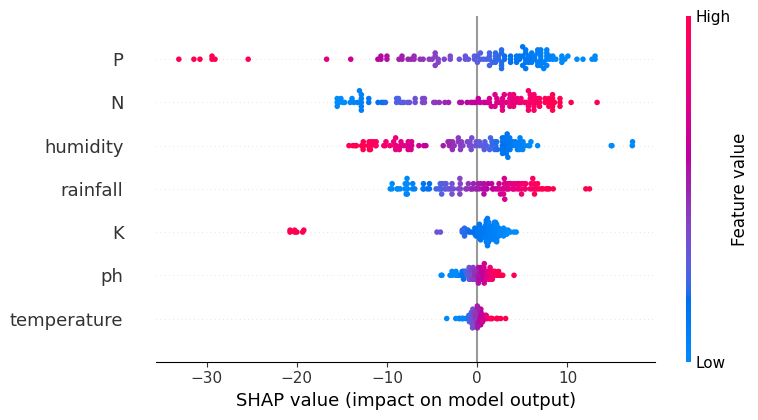

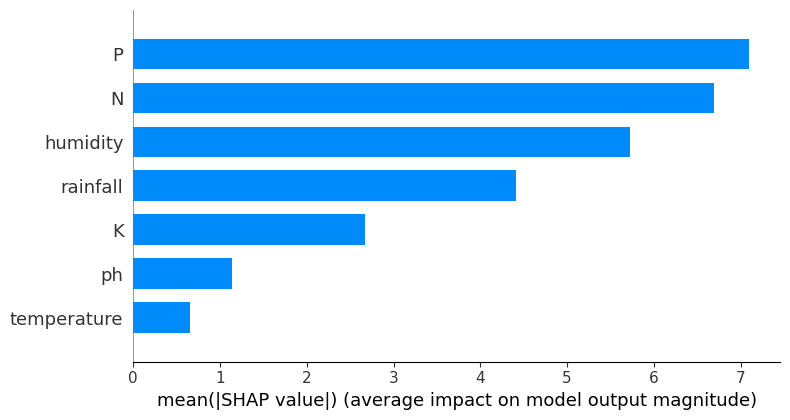

 Saved SHAP results for coffee -> /content/drive/MyDrive/logreg_shap_coffee_balanced.csv


In [8]:
import shap
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

# ----------------------
# Logistic Regression Model
# ----------------------
def get_logreg_model():
    return LogisticRegression(max_iter=1000, solver="lbfgs", random_state=42)

# ----------------------
# SHAP Implementation for Logistic Regression
# ----------------------
def run_shap_logreg(model, X_train, X_test, y_train, crop_name):
    print(f"\n[Balanced] Training Logistic Regression for SHAP (Crop: {crop_name})...")
    model.fit(X_train, y_train)

    explainer = shap.LinearExplainer(model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)

    # Take absolute mean importance
    mean_abs_shap = np.abs(shap_values).mean(axis=0)

    shap_df = pd.DataFrame({
        "Feature": X_train.columns,
        "LogReg_SHAP": mean_abs_shap
    }).sort_values(by="LogReg_SHAP", ascending=False)

    # SHAP plots
    shap.summary_plot(shap_values, X_test, feature_names=X_train.columns, show=True)
    shap.summary_plot(shap_values, X_test, feature_names=X_train.columns, plot_type="bar", show=True)

    return shap_df

# ----------------------
# Load dataset
# ----------------------
df = pd.read_csv('/content/drive/MyDrive/Crop_recommendation_expanded.csv')

# ----------------------
# Loop through all crops (Balanced only)
# ----------------------
for crop in df['label'].unique():
    print(f"\n=== Processing crop: {crop} ===")

    # Binary target for this crop
    df['target'] = (df['label'] == crop).astype(int)

    # Create balanced dataset
    df_pos = df[df['target'] == 1]
    df_neg = df[df['target'] == 0].sample(n=len(df_pos), random_state=42)
    df_bal = pd.concat([df_pos, df_neg]).sample(frac=1, random_state=42).reset_index(drop=True)

    X_bal = df_bal.drop(columns=['label', 'target'])
    y_bal = df_bal['target']

    # Train/test split
    X_train, X_test, y_train, y_test = train_test_split(
        X_bal, y_bal, test_size=0.2, stratify=y_bal, random_state=42
    )

    # Create new Logistic Regression model for this crop
    logreg_model = get_logreg_model()

    # Run SHAP
    shap_df = run_shap_logreg(logreg_model, X_train, X_test, y_train, crop)

    # Save CSV per crop
    output_path = f"/content/drive/MyDrive/logreg_shap_{crop}_balanced.csv"
    shap_df.to_csv(output_path, index=False)
    print(f" Saved SHAP results for {crop} -> {output_path}")


Cross validation for all crops

In [9]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.inspection import permutation_importance
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

# ----------------------
# Function for CV Stability Analysis
# ----------------------
def cross_val_feature_stability(model, X, y, model_name, n_splits=5, scoring='accuracy', save_dir=None):
    """
    Run cross-validation to measure feature importance stability using permutation importance.
    Returns dataframe of feature stability metrics.
    """
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    feature_importances = pd.DataFrame(index=X.columns)

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y), start=1):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

        # Fit model
        model.fit(X_train, y_train)

        # Permutation importance
        pfi_result = permutation_importance(
            model, X_val, y_val,
            scoring=scoring,
            n_repeats=10,
            random_state=42,
            n_jobs=-1
        )

        feature_importances[f"Fold_{fold}"] = pfi_result.importances_mean

    # Calculate mean, std, and CV%
    feature_importances["Mean_Importance"] = feature_importances.mean(axis=1)
    feature_importances["Std_Importance"] = feature_importances.std(axis=1)
    feature_importances["CV_Percent"] = (
        feature_importances["Std_Importance"] /
        feature_importances["Mean_Importance"].replace(0, np.nan)
    ) * 100

    # Sort by mean importance
    feature_importances = feature_importances.sort_values(by="Mean_Importance", ascending=False)
    feature_importances = feature_importances.reset_index().rename(columns={"index": "Feature"})

    # Save individual model CSV
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        file_path = os.path.join(save_dir, f"{model_name}_cv_feature_stability.csv")
        feature_importances.to_csv(file_path, index=False)
        print(f"✅ Saved: {file_path}")

    return feature_importances

# ----------------------
# Models for CV
# ----------------------
models = {
    "XGB": XGBClassifier(
        n_estimators=200, learning_rate=0.1, max_depth=5,
        subsample=0.8, colsample_bytree=0.8,
        random_state=42, eval_metric='logloss'
    ),
    "SVM": SVC(
        probability=True, kernel="rbf", random_state=42
    ),
    "MLP": MLPClassifier(
        hidden_layer_sizes=(100,), max_iter=500, random_state=42
    ),
    "LogReg": LogisticRegression(
        max_iter=1000, solver="lbfgs", random_state=42
    )
}

# ----------------------
# Load dataset
# ----------------------
df = pd.read_csv('/content/drive/MyDrive/Crop_recommendation_expanded.csv')

# ----------------------
# Loop for all crops (Balanced only)
# ----------------------
for crop in df['label'].unique():
    print(f"\n=== Processing crop: {crop} ===")

    # Binary target for this crop
    df['target'] = (df['label'] == crop).astype(int)

    # Balanced dataset
    df_pos = df[df['target'] == 1]
    df_neg = df[df['target'] == 0].sample(n=len(df_pos), random_state=42)
    df_bal = pd.concat([df_pos, df_neg]).sample(frac=1, random_state=42).reset_index(drop=True)

    X_bal = df_bal.drop(columns=['label', 'target'])
    y_bal = df_bal['target']

    # Output directory for this crop
    save_dir_crop = f"/content/drive/MyDrive/cv_results_balanced/{crop}"
    os.makedirs(save_dir_crop, exist_ok=True)

    # Run CV stability for all models
    results = {}
    for model_name, model in models.items():
        results[model_name] = cross_val_feature_stability(
            model, X_bal, y_bal, model_name,
            save_dir=save_dir_crop
        )

    # Merge Mean_Importance for all models into one table
    merged_df = results["XGB"][["Feature", "Mean_Importance"]].rename(columns={"Mean_Importance": "XGB_CV"})
    for model_name in ["SVM", "MLP", "LogReg"]:
        merged_df = merged_df.merge(
            results[model_name][["Feature", "Mean_Importance"]].rename(columns={"Mean_Importance": f"{model_name}_CV"}),
            on="Feature"
        )

    # Save combined table for this crop
    combined_path = os.path.join(save_dir_crop, f"{crop}_cv_feature_importance_all_models.csv")
    merged_df.to_csv(combined_path, index=False)
    print(f"📄 Saved combined CV importance table for {crop}: {combined_path}")



=== Processing crop: rice ===
✅ Saved: /content/drive/MyDrive/cv_results_balanced/rice/XGB_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/rice/SVM_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/rice/MLP_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/rice/LogReg_cv_feature_stability.csv
📄 Saved combined CV importance table for rice: /content/drive/MyDrive/cv_results_balanced/rice/rice_cv_feature_importance_all_models.csv

=== Processing crop: maize ===
✅ Saved: /content/drive/MyDrive/cv_results_balanced/maize/XGB_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/maize/SVM_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/maize/MLP_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/maize/LogReg_cv_feature_stability.csv
📄 Saved combined CV importance table for maize: /content/drive/MyDrive/cv_results_balanced/maize/maize

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


✅ Saved: /content/drive/MyDrive/cv_results_balanced/kidneybeans/MLP_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/kidneybeans/LogReg_cv_feature_stability.csv
📄 Saved combined CV importance table for kidneybeans: /content/drive/MyDrive/cv_results_balanced/kidneybeans/kidneybeans_cv_feature_importance_all_models.csv

=== Processing crop: pigeonpeas ===
✅ Saved: /content/drive/MyDrive/cv_results_balanced/pigeonpeas/XGB_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/pigeonpeas/SVM_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/pigeonpeas/MLP_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/pigeonpeas/LogReg_cv_feature_stability.csv
📄 Saved combined CV importance table for pigeonpeas: /content/drive/MyDrive/cv_results_balanced/pigeonpeas/pigeonpeas_cv_feature_importance_all_models.csv

=== Processing crop: mothbeans ===
✅ Saved: /content/drive/MyDrive/cv_results_balanced/mo

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


✅ Saved: /content/drive/MyDrive/cv_results_balanced/mothbeans/MLP_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/mothbeans/LogReg_cv_feature_stability.csv
📄 Saved combined CV importance table for mothbeans: /content/drive/MyDrive/cv_results_balanced/mothbeans/mothbeans_cv_feature_importance_all_models.csv

=== Processing crop: mungbean ===
✅ Saved: /content/drive/MyDrive/cv_results_balanced/mungbean/XGB_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/mungbean/SVM_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/mungbean/MLP_cv_feature_stability.csv
✅ Saved: /content/drive/MyDrive/cv_results_balanced/mungbean/LogReg_cv_feature_stability.csv
📄 Saved combined CV importance table for mungbean: /content/drive/MyDrive/cv_results_balanced/mungbean/mungbean_cv_feature_importance_all_models.csv

=== Processing crop: blackgram ===
✅ Saved: /content/drive/MyDrive/cv_results_balanced/blackgram/XGB_cv_feature_sta

Final feature consensus ranking

In [11]:
import pandas as pd
import os

# Path base for all crops
base_dir = "/content/drive/MyDrive"

# List of crops (from your dataset)
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

print("=== Checking CSV Column Names & Previews for ALL crops ===")
for crop in crops:
    print(f"\n=== Crop: {crop} ===")

    files = {
        # Changed here to match saved naming convention from SHAP code
        "SHAP Balanced": f"{base_dir}/shap_feature_importance_{crop}_balanced.csv",
        "LogReg SHAP": f"{base_dir}/logreg_shap_{crop}_balanced.csv",
        "CV Merged": f"{base_dir}/cv_results_balanced/{crop}/{crop}_cv_feature_importance_all_models.csv"
    }

    for name, path in files.items():
        print(f"\n{name}:")
        if os.path.exists(path):
            try:
                df = pd.read_csv(path, nrows=5)
                print("Columns:", df.columns.tolist())
                if "Unnamed: 0" in df.columns:
                    print("Note: 'Unnamed: 0' likely index column from previous save.")
                print("Preview:\n", df.head(2))
            except Exception as e:
                print(f"Error reading {path}: {e}")
        else:
            print(f"File not found: {path}")

# === Check in-memory CV results if available ===
print("\n=== Checking In-Memory CV Results ===")
for var_name in ["cv_results", "results"]:
    if var_name in globals():
        var_obj = globals()[var_name]
        if isinstance(var_obj, dict):
            for model in ["XGB", "SVM", "MLP", "LogReg"]:
                if model in var_obj:
                    print(f"\n{var_name} -> {model} columns:")
                    print(var_obj[model].columns.tolist())
                else:
                    print(f"{var_name} -> {model} not found in dict.")
        else:
            print(f"{var_name} exists but is not a dict.")
    else:
        print(f"{var_name} not defined.")


=== Checking CSV Column Names & Previews for ALL crops ===

=== Crop: rice ===

SHAP Balanced:
Columns: ['Unnamed: 0', 'N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']
Note: 'Unnamed: 0' likely index column from previous save.
Preview:
   Unnamed: 0                                                  N  \
0    XGBoost                                 0.9221122860908508   
1        SVM  [2.70144685e-02 1.40209060e-05 2.99713515e-02 ...   

                                                   P  \
0                                0.10821936279535294   
1  [2.28362798e-02 6.76334181e-03 1.90520093e-02 ...   

                                                   K  \
0                                 0.5138199329376221   
1  [1.20549785e-01 2.95250186e-02 4.42143977e-02 ...   

                                         temperature  \
0                                 0.6019121408462524   
1  [1.14895289e-01 2.55448854e-02 4.63247649e-02 ...   

                                           

In [13]:
import pandas as pd
import numpy as np
import ast
import os

# ==============================
# Function to parse and average list-like SHAP values
# ==============================
def extract_value(val):
    # If value is string like "[0.0935 0.0935]"
    if isinstance(val, str) and val.startswith("["):
        try:
            arr = np.array(ast.literal_eval(val))
            return float(np.mean(np.abs(arr)))
        except:
            return np.nan
    # If already list or array
    elif isinstance(val, (list, np.ndarray)):
        return float(np.mean(np.abs(val)))
    # If scalar
    else:
        try:
            return float(val)
        except:
            return np.nan

# ==============================
# Crop list (adjust if needed)
# ==============================
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

base_dir = "/content/drive/MyDrive"

# ==============================
# Process each crop
# ==============================
for crop in crops:
    # ✅ Corrected path based on SHAP generation naming
    shap_bal_path = f"{base_dir}/shap_feature_importance_{crop}_balanced.csv"

    if not os.path.exists(shap_bal_path):
        print(f"❌ SHAP Balanced not found for crop: {crop}")
        continue

    try:
        # Load SHAP Balanced
        shap_raw = pd.read_csv(shap_bal_path)

        # Rename Unnamed: 0 if present
        if 'Unnamed: 0' in shap_raw.columns:
            shap_raw = shap_raw.rename(columns={'Unnamed: 0': 'Model'})

        # Keep only relevant models
        shap_raw = shap_raw[shap_raw['Model'].isin(['XGBoost', 'SVM', 'MLP'])]

        # Apply parsing to feature columns
        feature_cols = [col for col in shap_raw.columns if col != 'Model']
        for col in feature_cols:
            shap_raw[col] = shap_raw[col].apply(extract_value)

        # Transpose so features become rows
        shap_df = shap_raw.set_index('Model').T.reset_index()
        shap_df = shap_df.rename(columns={'index': 'Feature',
                                          'XGBoost': 'XGB_SHAP',
                                          'SVM': 'SVM_SHAP',
                                          'MLP': 'MLP_SHAP'})

        # Normalize SHAP columns so each sums to 1
        for col in ['XGB_SHAP', 'SVM_SHAP', 'MLP_SHAP']:
            shap_df[col] = shap_df[col] / shap_df[col].sum()

        # Save as partial merge table for now
        partial_merge_path = f"{base_dir}/{crop}_feature_importance_partial_merge.csv"
        shap_df.to_csv(partial_merge_path, index=False)

        print(f"✅ Processed SHAP Balanced for crop: {crop} -> Saved to {partial_merge_path}")

    except Exception as e:
        print(f"⚠️ Error processing {crop}: {e}")


✅ Processed SHAP Balanced for crop: rice -> Saved to /content/drive/MyDrive/rice_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: maize -> Saved to /content/drive/MyDrive/maize_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: chickpea -> Saved to /content/drive/MyDrive/chickpea_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: kidneybeans -> Saved to /content/drive/MyDrive/kidneybeans_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: pigeonpeas -> Saved to /content/drive/MyDrive/pigeonpeas_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: mothbeans -> Saved to /content/drive/MyDrive/mothbeans_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: mungbean -> Saved to /content/drive/MyDrive/mungbean_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: blackgram -> Saved to /content/drive/MyDrive/blackgram_feature_importance_partial_me

In [15]:
import pandas as pd
import numpy as np
import ast
import os

# ==============================
# Function to parse and average list-like SHAP values
# ==============================
def extract_value(val):
    if isinstance(val, str) and val.startswith("["):
        try:
            arr = np.array(ast.literal_eval(val))
            return float(np.mean(np.abs(arr)))
        except:
            return np.nan
    elif isinstance(val, (list, np.ndarray)):
        return float(np.mean(np.abs(val)))
    else:
        try:
            return float(val)
        except:
            return np.nan

# ==============================
# Crop list (adjust if needed)
# ==============================
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

base_dir = "/content/drive/MyDrive"

# ==============================
# Process each crop
# ==============================
for crop in crops:
    # Try both naming patterns
    shap_bal_path_1 = f"{base_dir}/{crop}_shap_feature_importance_balanced.csv"
    shap_bal_path_2 = f"{base_dir}/shap_feature_importance_{crop}_balanced.csv"

    # Pick the one that exists
    if os.path.exists(shap_bal_path_1):
        shap_bal_path = shap_bal_path_1
    elif os.path.exists(shap_bal_path_2):
        shap_bal_path = shap_bal_path_2
    else:
        print(f"❌ SHAP Balanced not found for crop: {crop}")
        continue

    try:
        # Load SHAP Balanced
        shap_raw = pd.read_csv(shap_bal_path)

        # Rename Unnamed: 0 if present
        if 'Unnamed: 0' in shap_raw.columns:
            shap_raw = shap_raw.rename(columns={'Unnamed: 0': 'Model'})

        # Keep only relevant models
        shap_raw = shap_raw[shap_raw['Model'].isin(['XGBoost', 'SVM', 'MLP'])]

        # Apply parsing to feature columns
        feature_cols = [col for col in shap_raw.columns if col != 'Model']
        for col in feature_cols:
            shap_raw[col] = shap_raw[col].apply(extract_value)

        # Transpose so features become rows
        shap_df = shap_raw.set_index('Model').T.reset_index()
        shap_df = shap_df.rename(columns={
            'index': 'Feature',
            'XGBoost': 'XGB_SHAP',
            'SVM': 'SVM_SHAP',
            'MLP': 'MLP_SHAP'
        })

        # Normalize SHAP columns so each sums to 1
        for col in ['XGB_SHAP', 'SVM_SHAP', 'MLP_SHAP']:
            shap_df[col] = shap_df[col] / shap_df[col].sum()

        # Save as partial merge table
        partial_merge_path = f"{base_dir}/{crop}_feature_importance_partial_merge.csv"
        shap_df.to_csv(partial_merge_path, index=False)

        print(f"✅ Processed SHAP Balanced for crop: {crop} ({os.path.basename(shap_bal_path)}) -> Saved to {partial_merge_path}")

    except Exception as e:
        print(f"⚠️ Error processing {crop}: {e}")


✅ Processed SHAP Balanced for crop: rice (rice_shap_feature_importance_balanced.csv) -> Saved to /content/drive/MyDrive/rice_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: maize (shap_feature_importance_maize_balanced.csv) -> Saved to /content/drive/MyDrive/maize_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: chickpea (shap_feature_importance_chickpea_balanced.csv) -> Saved to /content/drive/MyDrive/chickpea_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: kidneybeans (shap_feature_importance_kidneybeans_balanced.csv) -> Saved to /content/drive/MyDrive/kidneybeans_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: pigeonpeas (shap_feature_importance_pigeonpeas_balanced.csv) -> Saved to /content/drive/MyDrive/pigeonpeas_feature_importance_partial_merge.csv
✅ Processed SHAP Balanced for crop: mothbeans (shap_feature_importance_mothbeans_balanced.csv) -> Saved to /content/drive/MyDrive/mothbe

In [16]:
import os
import pandas as pd

# Base directory and crop list
base_dir = "/content/drive/MyDrive"
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

print("=== Debug: Checking SHAP computations for all crops ===")
for crop in crops:
    path = f"{base_dir}/{crop}_feature_importance_partial_merge.csv"
    if not os.path.exists(path):
        print(f"❌ File missing for crop: {crop}")
        continue

    try:
        df = pd.read_csv(path)
        shap_cols = [col for col in df.columns if "_SHAP" in col]

        print(f"\n=== {crop.upper()} ===")
        print(f"Columns found: {shap_cols if shap_cols else '❌ No SHAP columns found'}")
        print(df.head(3))  # Show first 3 rows
    except Exception as e:
        print(f"⚠️ Error reading {crop}: {e}")


=== Debug: Checking SHAP computations for all crops ===

=== RICE ===
Columns found: ['XGB_SHAP', 'SVM_SHAP', 'MLP_SHAP']
  Feature  XGB_SHAP  SVM_SHAP  MLP_SHAP
0       N  0.201571       NaN       NaN
1       P  0.050652       NaN       NaN
2       K  0.035653       NaN       NaN

=== MAIZE ===
Columns found: ['XGB_SHAP', 'SVM_SHAP', 'MLP_SHAP']
  Feature  XGB_SHAP  SVM_SHAP  MLP_SHAP
0       N  0.302024       NaN       NaN
1       P  0.025548       NaN       NaN
2       K  0.224326       NaN       NaN

=== CHICKPEA ===
Columns found: ['XGB_SHAP', 'SVM_SHAP', 'MLP_SHAP']
  Feature  XGB_SHAP  SVM_SHAP  MLP_SHAP
0       N  0.004266       NaN       NaN
1       P  0.018843       NaN       NaN
2       K  0.284189       NaN       NaN

=== KIDNEYBEANS ===
Columns found: ['XGB_SHAP', 'SVM_SHAP', 'MLP_SHAP']
  Feature  XGB_SHAP  SVM_SHAP  MLP_SHAP
0       N  0.063032       NaN       NaN
1       P  0.034795       NaN       NaN
2       K  0.132179       NaN       NaN

=== PIGEONPEAS ===
Columns 

In [17]:
import shap
import numpy as np
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
import os

# ==============================
# Paths & crop list
# ==============================
base_dir = "/content/drive/MyDrive"
data_path = f"{base_dir}/Crop_recommendation_expanded.csv"
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

# ==============================
# Load dataset once
# ==============================
df = pd.read_csv(data_path)

# ==============================
# Loop through each crop
# ==============================
for crop in crops:
    print(f"\n=== Processing SVM SHAP for crop: {crop} ===")

    # Check if partial merge file exists
    partial_merge_path = f"{base_dir}/{crop}_feature_importance_partial_merge.csv"
    if not os.path.exists(partial_merge_path):
        print(f"❌ Partial merge file missing for {crop}, skipping...")
        continue

    # Create balanced dataset
    df['target'] = (df['label'] == crop).astype(int)
    df_pos = df[df['target'] == 1]
    df_neg = df[df['target'] == 0].sample(n=len(df_pos), random_state=42)
    df_bal = pd.concat([df_pos, df_neg]).sample(frac=1, random_state=42).reset_index(drop=True)

    X_bal = df_bal.drop(columns=['label', 'target'])
    y_bal = df_bal['target']

    # Train/test split
    X_train, X_test, y_train, y_test = train_test_split(
        X_bal, y_bal, test_size=0.2, stratify=y_bal, random_state=42
    )

    # Train SVM model
    print("[Balanced] Training SVM...")
    svm_model = SVC(kernel='rbf', probability=True, random_state=42)
    svm_model.fit(X_train, y_train)

    # SHAP computation
    print("[Balanced] Computing SHAP values...")
    X_train_np = np.array(X_train)
    X_test_np = np.array(X_test)

    background = shap.sample(X_train_np, 50, random_state=42)
    explainer = shap.KernelExplainer(svm_model.predict_proba, background)

    shap_values_all_classes = explainer.shap_values(X_test_np, nsamples=100)

    # Convert to numpy if needed
    if isinstance(shap_values_all_classes, list):
        shap_values_all_classes = np.array(shap_values_all_classes)
    if shap_values_all_classes.shape[0] != 2:
        shap_values_all_classes = np.transpose(shap_values_all_classes, (2, 0, 1))

    shap_values_combined = np.sum(np.abs(shap_values_all_classes), axis=0)
    mean_abs_shap = np.abs(shap_values_combined).mean(axis=0)

    assert mean_abs_shap.shape[0] == len(X_train.columns), "Feature count mismatch!"

    # Prepare DataFrame
    svm_shap_df = pd.DataFrame({
        'Feature': X_train.columns,
        'SVM_SHAP': mean_abs_shap
    })
    svm_shap_df['SVM_SHAP'] = svm_shap_df['SVM_SHAP'] / svm_shap_df['SVM_SHAP'].sum()

    # Merge into partial file
    partial_df = pd.read_csv(partial_merge_path)
    partial_df = partial_df.drop(columns=[col for col in partial_df.columns if col.startswith("SVM_SHAP")], errors="ignore")
    merged_df = partial_df.merge(svm_shap_df, on='Feature', how='left')

    merged_df.to_csv(partial_merge_path, index=False)
    print(f"✅ Updated SVM_SHAP for {crop} -> Saved to {partial_merge_path}")



=== Processing SVM SHAP for crop: rice ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for rice -> Saved to /content/drive/MyDrive/rice_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: maize ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for maize -> Saved to /content/drive/MyDrive/maize_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: chickpea ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for chickpea -> Saved to /content/drive/MyDrive/chickpea_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: kidneybeans ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for kidneybeans -> Saved to /content/drive/MyDrive/kidneybeans_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: pigeonpeas ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for pigeonpeas -> Saved to /content/drive/MyDrive/pigeonpeas_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: mothbeans ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for mothbeans -> Saved to /content/drive/MyDrive/mothbeans_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: mungbean ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for mungbean -> Saved to /content/drive/MyDrive/mungbean_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: blackgram ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for blackgram -> Saved to /content/drive/MyDrive/blackgram_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: lentil ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for lentil -> Saved to /content/drive/MyDrive/lentil_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: pomegranate ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for pomegranate -> Saved to /content/drive/MyDrive/pomegranate_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: banana ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for banana -> Saved to /content/drive/MyDrive/banana_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: mango ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for mango -> Saved to /content/drive/MyDrive/mango_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: grapes ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for grapes -> Saved to /content/drive/MyDrive/grapes_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: watermelon ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for watermelon -> Saved to /content/drive/MyDrive/watermelon_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: muskmelon ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for muskmelon -> Saved to /content/drive/MyDrive/muskmelon_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: apple ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for apple -> Saved to /content/drive/MyDrive/apple_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: orange ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for orange -> Saved to /content/drive/MyDrive/orange_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: papaya ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for papaya -> Saved to /content/drive/MyDrive/papaya_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: coconut ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for coconut -> Saved to /content/drive/MyDrive/coconut_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: cotton ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for cotton -> Saved to /content/drive/MyDrive/cotton_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: jute ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for jute -> Saved to /content/drive/MyDrive/jute_feature_importance_partial_merge.csv

=== Processing SVM SHAP for crop: coffee ===
[Balanced] Training SVM...
[Balanced] Computing SHAP values...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated SVM_SHAP for coffee -> Saved to /content/drive/MyDrive/coffee_feature_importance_partial_merge.csv


In [18]:
import shap
import numpy as np
import pandas as pd
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
import os

# ==============================
# Paths & crop list
# ==============================
base_dir = "/content/drive/MyDrive"
data_path = f"{base_dir}/Crop_recommendation_expanded.csv"
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

# ==============================
# Load dataset once
# ==============================
df = pd.read_csv(data_path)

# ==============================
# Loop through each crop
# ==============================
for crop in crops:
    print(f"\n=== Processing MLP SHAP for crop: {crop} ===")

    # Check if partial merge file exists
    partial_merge_path = f"{base_dir}/{crop}_feature_importance_partial_merge.csv"
    if not os.path.exists(partial_merge_path):
        print(f"❌ Partial merge file missing for {crop}, skipping...")
        continue

    # Create balanced dataset
    df['target'] = (df['label'] == crop).astype(int)
    df_pos = df[df['target'] == 1]
    if len(df_pos) == 0:
        print(f"⚠️ No positive samples for {crop}, skipping...")
        continue
    df_neg = df[df['target'] == 0].sample(n=len(df_pos), random_state=42)
    df_bal = pd.concat([df_pos, df_neg]).sample(frac=1, random_state=42).reset_index(drop=True)

    X_bal = df_bal.drop(columns=['label', 'target'])
    y_bal = df_bal['target']

    # Train/test split
    X_train, X_test, y_train, y_test = train_test_split(
        X_bal, y_bal, test_size=0.2, stratify=y_bal, random_state=42
    )

    # Train MLP model
    print("[Balanced] Training MLP...")
    mlp_model = MLPClassifier(hidden_layer_sizes=(50,), max_iter=500, random_state=42)
    mlp_model.fit(X_train, y_train)

    # SHAP computation
    print("[Balanced] Computing SHAP values for MLP...")
    X_train_np = np.array(X_train)
    X_test_np = np.array(X_test)

    # Use a smaller background set for speed
    background = shap.sample(X_train_np, 50, random_state=42)
    explainer = shap.KernelExplainer(mlp_model.predict_proba, background)

    shap_values_all_classes = explainer.shap_values(X_test_np, nsamples=100)

    # Convert to numpy if needed
    if isinstance(shap_values_all_classes, list):
        shap_values_all_classes = np.array(shap_values_all_classes)
    if shap_values_all_classes.shape[0] != 2:
        shap_values_all_classes = np.transpose(shap_values_all_classes, (2, 0, 1))

    # Combine SHAP values across classes → absolute mean
    shap_values_combined = np.sum(np.abs(shap_values_all_classes), axis=0)
    mean_abs_shap = np.abs(shap_values_combined).mean(axis=0)

    assert mean_abs_shap.shape[0] == len(X_train.columns), "Feature count mismatch!"

    # Prepare DataFrame
    mlp_shap_df = pd.DataFrame({
        'Feature': X_train.columns,
        'MLP_SHAP': mean_abs_shap
    })
    mlp_shap_df['MLP_SHAP'] = mlp_shap_df['MLP_SHAP'] / mlp_shap_df['MLP_SHAP'].sum()

    # Merge into partial file
    partial_df = pd.read_csv(partial_merge_path)
    partial_df = partial_df.drop(columns=[col for col in partial_df.columns if col.startswith("MLP_SHAP")], errors="ignore")
    merged_df = partial_df.merge(mlp_shap_df, on='Feature', how='left')

    merged_df.to_csv(partial_merge_path, index=False)
    print(f"✅ Updated MLP_SHAP for {crop} -> Saved to {partial_merge_path}")



=== Processing MLP SHAP for crop: rice ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for rice -> Saved to /content/drive/MyDrive/rice_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: maize ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for maize -> Saved to /content/drive/MyDrive/maize_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: chickpea ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for chickpea -> Saved to /content/drive/MyDrive/chickpea_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: kidneybeans ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for kidneybeans -> Saved to /content/drive/MyDrive/kidneybeans_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: pigeonpeas ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for pigeonpeas -> Saved to /content/drive/MyDrive/pigeonpeas_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: mothbeans ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for mothbeans -> Saved to /content/drive/MyDrive/mothbeans_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: mungbean ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for mungbean -> Saved to /content/drive/MyDrive/mungbean_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: blackgram ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for blackgram -> Saved to /content/drive/MyDrive/blackgram_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: lentil ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for lentil -> Saved to /content/drive/MyDrive/lentil_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: pomegranate ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for pomegranate -> Saved to /content/drive/MyDrive/pomegranate_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: banana ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for banana -> Saved to /content/drive/MyDrive/banana_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: mango ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for mango -> Saved to /content/drive/MyDrive/mango_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: grapes ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for grapes -> Saved to /content/drive/MyDrive/grapes_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: watermelon ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for watermelon -> Saved to /content/drive/MyDrive/watermelon_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: muskmelon ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for muskmelon -> Saved to /content/drive/MyDrive/muskmelon_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: apple ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for apple -> Saved to /content/drive/MyDrive/apple_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: orange ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for orange -> Saved to /content/drive/MyDrive/orange_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: papaya ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for papaya -> Saved to /content/drive/MyDrive/papaya_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: coconut ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for coconut -> Saved to /content/drive/MyDrive/coconut_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: cotton ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for cotton -> Saved to /content/drive/MyDrive/cotton_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: jute ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for jute -> Saved to /content/drive/MyDrive/jute_feature_importance_partial_merge.csv

=== Processing MLP SHAP for crop: coffee ===
[Balanced] Training MLP...
[Balanced] Computing SHAP values for MLP...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated MLP_SHAP for coffee -> Saved to /content/drive/MyDrive/coffee_feature_importance_partial_merge.csv


In [19]:
import os
import pandas as pd

# Base directory and crop list
base_dir = "/content/drive/MyDrive"
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

print("=== Debug: Checking SHAP computations for all crops ===")
for crop in crops:
    path = f"{base_dir}/{crop}_feature_importance_partial_merge.csv"
    if not os.path.exists(path):
        print(f"❌ File missing for crop: {crop}")
        continue

    try:
        df = pd.read_csv(path)
        shap_cols = [col for col in df.columns if "_SHAP" in col]

        print(f"\n=== {crop.upper()} ===")
        print(f"Columns found: {shap_cols if shap_cols else '❌ No SHAP columns found'}")
        print(df.head(3))  # Show first 3 rows
    except Exception as e:
        print(f"⚠️ Error reading {crop}: {e}")


=== Debug: Checking SHAP computations for all crops ===

=== RICE ===
Columns found: ['XGB_SHAP', 'SVM_SHAP', 'MLP_SHAP']
  Feature  XGB_SHAP  SVM_SHAP  MLP_SHAP
0       N  0.201571  0.133246  0.200071
1       P  0.050652  0.032035  0.075738
2       K  0.035653  0.055545  0.038773

=== MAIZE ===
Columns found: ['XGB_SHAP', 'SVM_SHAP', 'MLP_SHAP']
  Feature  XGB_SHAP  SVM_SHAP  MLP_SHAP
0       N  0.302024  0.389662  0.348076
1       P  0.025548  0.098974  0.195891
2       K  0.224326  0.202247  0.238792

=== CHICKPEA ===
Columns found: ['XGB_SHAP', 'SVM_SHAP', 'MLP_SHAP']
  Feature  XGB_SHAP  SVM_SHAP  MLP_SHAP
0       N  0.004266  0.022055  0.020131
1       P  0.018843  0.037756  0.061825
2       K  0.284189  0.517164  0.331026

=== KIDNEYBEANS ===
Columns found: ['XGB_SHAP', 'SVM_SHAP', 'MLP_SHAP']
  Feature  XGB_SHAP  SVM_SHAP  MLP_SHAP
0       N  0.063032  0.069532  0.073485
1       P  0.034795  0.051336  0.044993
2       K  0.132179  0.233136  0.148066

=== PIGEONPEAS ===
Columns 

In [20]:
import shap
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import os

# ==============================
# Paths & crop list
# ==============================
base_dir = "/content/drive/MyDrive"
data_path = f"{base_dir}/Crop_recommendation_expanded.csv"
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

# ==============================
# Load dataset once
# ==============================
df = pd.read_csv(data_path)

# ==============================
# Loop through each crop
# ==============================
for crop in crops:
    print(f"\n=== Processing LogReg SHAP for crop: {crop} ===")

    # Check if partial merge file exists
    partial_merge_path = f"{base_dir}/{crop}_feature_importance_partial_merge.csv"
    if not os.path.exists(partial_merge_path):
        print(f"❌ Partial merge file missing for {crop}, skipping...")
        continue

    # Create balanced dataset
    df['target'] = (df['label'] == crop).astype(int)
    df_pos = df[df['target'] == 1]
    if len(df_pos) == 0:
        print(f"⚠️ No positive samples for {crop}, skipping...")
        continue
    df_neg = df[df['target'] == 0].sample(n=len(df_pos), random_state=42)
    df_bal = pd.concat([df_pos, df_neg]).sample(frac=1, random_state=42).reset_index(drop=True)

    X_bal = df_bal.drop(columns=['label', 'target'])
    y_bal = df_bal['target']

    # Train/test split
    X_train, X_test, y_train, y_test = train_test_split(
        X_bal, y_bal, test_size=0.2, stratify=y_bal, random_state=42
    )

    # Train Logistic Regression model
    print("[Balanced] Training Logistic Regression...")
    logreg_model = LogisticRegression(max_iter=1000, solver="lbfgs", random_state=42)
    logreg_model.fit(X_train, y_train)

    # SHAP computation
    print("[Balanced] Computing SHAP values for Logistic Regression...")
    X_train_np = np.array(X_train)
    X_test_np = np.array(X_test)

    background = shap.sample(X_train_np, 50, random_state=42)
    explainer = shap.KernelExplainer(logreg_model.predict_proba, background)

    shap_values_all_classes = explainer.shap_values(X_test_np, nsamples=100)

    if isinstance(shap_values_all_classes, list):
        shap_values_all_classes = np.array(shap_values_all_classes)
    if shap_values_all_classes.shape[0] != 2:
        shap_values_all_classes = np.transpose(shap_values_all_classes, (2, 0, 1))

    shap_values_combined = np.sum(np.abs(shap_values_all_classes), axis=0)
    mean_abs_shap = np.abs(shap_values_combined).mean(axis=0)

    assert mean_abs_shap.shape[0] == len(X_train.columns), "Feature count mismatch!"

    # Prepare DataFrame
    logreg_shap_df = pd.DataFrame({
        'Feature': X_train.columns,
        'LogReg_SHAP': mean_abs_shap
    })
    logreg_shap_df['LogReg_SHAP'] = logreg_shap_df['LogReg_SHAP'] / logreg_shap_df['LogReg_SHAP'].sum()

    # Merge into partial file
    partial_df = pd.read_csv(partial_merge_path)
    partial_df = partial_df.drop(columns=[col for col in partial_df.columns if col.startswith("LogReg_SHAP")], errors="ignore")
    merged_df = partial_df.merge(logreg_shap_df, on='Feature', how='left')

    merged_df.to_csv(partial_merge_path, index=False)
    print(f"✅ Updated LogReg_SHAP for {crop} -> Saved to {partial_merge_path}")



=== Processing LogReg SHAP for crop: rice ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for rice -> Saved to /content/drive/MyDrive/rice_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: maize ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for maize -> Saved to /content/drive/MyDrive/maize_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: chickpea ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for chickpea -> Saved to /content/drive/MyDrive/chickpea_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: kidneybeans ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for kidneybeans -> Saved to /content/drive/MyDrive/kidneybeans_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: pigeonpeas ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for pigeonpeas -> Saved to /content/drive/MyDrive/pigeonpeas_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: mothbeans ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for mothbeans -> Saved to /content/drive/MyDrive/mothbeans_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: mungbean ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for mungbean -> Saved to /content/drive/MyDrive/mungbean_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: blackgram ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for blackgram -> Saved to /content/drive/MyDrive/blackgram_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: lentil ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for lentil -> Saved to /content/drive/MyDrive/lentil_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: pomegranate ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for pomegranate -> Saved to /content/drive/MyDrive/pomegranate_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: banana ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for banana -> Saved to /content/drive/MyDrive/banana_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: mango ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for mango -> Saved to /content/drive/MyDrive/mango_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: grapes ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for grapes -> Saved to /content/drive/MyDrive/grapes_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: watermelon ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for watermelon -> Saved to /content/drive/MyDrive/watermelon_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: muskmelon ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for muskmelon -> Saved to /content/drive/MyDrive/muskmelon_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: apple ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for apple -> Saved to /content/drive/MyDrive/apple_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: orange ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for orange -> Saved to /content/drive/MyDrive/orange_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: papaya ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for papaya -> Saved to /content/drive/MyDrive/papaya_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: coconut ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for coconut -> Saved to /content/drive/MyDrive/coconut_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: cotton ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for cotton -> Saved to /content/drive/MyDrive/cotton_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: jute ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for jute -> Saved to /content/drive/MyDrive/jute_feature_importance_partial_merge.csv

=== Processing LogReg SHAP for crop: coffee ===
[Balanced] Training Logistic Regression...
[Balanced] Computing SHAP values for Logistic Regression...


  0%|          | 0/120 [00:00<?, ?it/s]

✅ Updated LogReg_SHAP for coffee -> Saved to /content/drive/MyDrive/coffee_feature_importance_partial_merge.csv


In [23]:
import numpy as np
import pandas as pd
from sklearn.inspection import permutation_importance
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
import os

# ----------------------
# Helper: Run PFI for a single model
# ----------------------
def run_pfi(model, X_train, X_test, y_train, y_test, model_name):
    print(f"\n[balanced] Training {model_name} for PFI...")
    model.fit(X_train, y_train)

    # Baseline accuracy
    baseline_acc = accuracy_score(y_test, model.predict(X_test))

    # Run permutation importance
    pfi_result = permutation_importance(
        model, X_test, y_test,
        scoring='accuracy',
        n_repeats=10,
        random_state=42,
        n_jobs=-1
    )

    # Store mean importance
    mean_importance = pfi_result.importances_mean

    # Create DataFrame
    pfi_df = pd.DataFrame({
        "Feature": X_train.columns,
        f"{model_name}_balanced_PFI": mean_importance
    }).sort_values(by=f"{model_name}_balanced_PFI", ascending=False).reset_index(drop=True)

    return pfi_df

# ----------------------
# Models
# ----------------------
xgb_model = XGBClassifier(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    eval_metric='logloss'
)

svm_model = SVC(probability=True, kernel="rbf", random_state=42)

mlp_model = MLPClassifier(
    hidden_layer_sizes=(100,),
    activation="relu",
    solver="adam",
    max_iter=500,
    random_state=42
)

logreg_model = LogisticRegression(
    max_iter=1000,
    solver="lbfgs",
    random_state=42
)

# ----------------------
# Load dataset
# ----------------------
df = pd.read_csv('/content/drive/MyDrive/Crop_recommendation_expanded.csv')

# ----------------------
# Crop list
# ----------------------
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

output_dir = "/content/drive/MyDrive"

# ----------------------
# Loop through all crops
# ----------------------
for crop in crops:
    print(f"\n=== Processing crop: {crop} ===")

    # Create binary target
    df['target'] = (df['label'] == crop).astype(int)

    # Balanced dataset
    df_pos = df[df['target'] == 1]
    df_neg = df[df['target'] == 0].sample(n=len(df_pos), random_state=42)
    df_bal = pd.concat([df_pos, df_neg]).sample(frac=1, random_state=42).reset_index(drop=True)

    Xb = df_bal.drop(columns=['label', 'target'])
    yb = df_bal['target']

    Xb_train, Xb_test, yb_train, yb_test = train_test_split(
        Xb, yb, test_size=0.2, stratify=yb, random_state=42
    )

    # Run PFI for Balanced dataset
    results = []
    for model, name in [
        (xgb_model, "XGB"),
        (svm_model, "SVM"),
        (mlp_model, "MLP"),
        (logreg_model, "LogReg")
    ]:
        results.append(run_pfi(model, Xb_train, Xb_test, yb_train, yb_test, name))

    # Merge results into one DataFrame
    final_pfi_df = results[0]
    for df_tmp in results[1:]:
        final_pfi_df = final_pfi_df.merge(df_tmp, on="Feature", how="outer")

    # Save to CSV
    crop_pfi_path = os.path.join(output_dir, f"{crop}_pfi_feature_importance.csv")
    final_pfi_df.to_csv(crop_pfi_path, index=False)
    print(f"✅ Saved PFI results for {crop} -> {crop_pfi_path}")



=== Processing crop: rice ===

[balanced] Training XGB for PFI...

[balanced] Training SVM for PFI...

[balanced] Training MLP for PFI...

[balanced] Training LogReg for PFI...
✅ Saved PFI results for rice -> /content/drive/MyDrive/rice_pfi_feature_importance.csv

=== Processing crop: maize ===

[balanced] Training XGB for PFI...

[balanced] Training SVM for PFI...

[balanced] Training MLP for PFI...

[balanced] Training LogReg for PFI...
✅ Saved PFI results for maize -> /content/drive/MyDrive/maize_pfi_feature_importance.csv

=== Processing crop: chickpea ===

[balanced] Training XGB for PFI...

[balanced] Training SVM for PFI...

[balanced] Training MLP for PFI...

[balanced] Training LogReg for PFI...
✅ Saved PFI results for chickpea -> /content/drive/MyDrive/chickpea_pfi_feature_importance.csv

=== Processing crop: kidneybeans ===

[balanced] Training XGB for PFI...

[balanced] Training SVM for PFI...

[balanced] Training MLP for PFI...

[balanced] Training LogReg for PFI...
✅ Sav

In [24]:
import pandas as pd
import os

# ==============================
# Crop list
# ==============================
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

base_dir = "/content/drive/MyDrive"

# ==============================
# Loop over all crops
# ==============================
for crop in crops:
    pfi_path = f"{base_dir}/{crop}_pfi_feature_importance.csv"
    partial_merge_path = f"{base_dir}/{crop}_feature_importance_partial_merge.csv"

    if not os.path.exists(pfi_path):
        print(f"❌ PFI CSV not found for crop: {crop}")
        continue
    if not os.path.exists(partial_merge_path):
        print(f"❌ Partial merge file not found for crop: {crop}")
        continue

    try:
        # 1️⃣ Load PFI Balanced CSV
        pfi_df = pd.read_csv(pfi_path)

        # Safely keep only expected PFI columns
        expected_cols = [
            "Feature",
            "XGB_balanced_PFI",
            "SVM_balanced_PFI",
            "MLP_balanced_PFI",
            "LogReg_balanced_PFI"
        ]
        available_cols = [col for col in expected_cols if col in pfi_df.columns]

        if len(available_cols) < 2:  # At least Feature + 1 model column
            print(f"⚠️ Skipping {crop}: PFI columns missing in {pfi_path}")
            continue

        pfi_bal = pfi_df[available_cols].copy()

        # Rename columns to final table names
        rename_map = {
            "XGB_balanced_PFI": "XGB_PFI",
            "SVM_balanced_PFI": "SVM_PFI",
            "MLP_balanced_PFI": "MLP_PFI",
            "LogReg_balanced_PFI": "LogReg_PFI"
        }
        pfi_bal.rename(columns=rename_map, inplace=True)

        # Normalize each PFI column to sum=1
        for col in ["XGB_PFI", "SVM_PFI", "MLP_PFI", "LogReg_PFI"]:
            if col in pfi_bal.columns:
                col_sum = pfi_bal[col].sum()
                if col_sum != 0:
                    pfi_bal[col] = pfi_bal[col] / col_sum

        # 2️⃣ Load partial merge table & clean old PFI columns
        partial_df = pd.read_csv(partial_merge_path)
        partial_df = partial_df.drop(
            columns=[col for col in partial_df.columns if col.endswith("_PFI")],
            errors="ignore"
        )

        # 3️⃣ Merge PFI into partial table
        merged_df = partial_df.merge(pfi_bal, on="Feature", how="left")

        # Save updated partial table
        merged_df.to_csv(partial_merge_path, index=False)

        print(f"✅ Updated Partial Merge Table with PFI for: {crop}")

    except Exception as e:
        print(f"⚠️ Error processing {crop}: {e}")


✅ Updated Partial Merge Table with PFI for: rice
✅ Updated Partial Merge Table with PFI for: maize
✅ Updated Partial Merge Table with PFI for: chickpea
✅ Updated Partial Merge Table with PFI for: kidneybeans
✅ Updated Partial Merge Table with PFI for: pigeonpeas
✅ Updated Partial Merge Table with PFI for: mothbeans
✅ Updated Partial Merge Table with PFI for: mungbean
✅ Updated Partial Merge Table with PFI for: blackgram
✅ Updated Partial Merge Table with PFI for: lentil
✅ Updated Partial Merge Table with PFI for: pomegranate
✅ Updated Partial Merge Table with PFI for: banana
✅ Updated Partial Merge Table with PFI for: mango
✅ Updated Partial Merge Table with PFI for: grapes
✅ Updated Partial Merge Table with PFI for: watermelon
✅ Updated Partial Merge Table with PFI for: muskmelon
✅ Updated Partial Merge Table with PFI for: apple
✅ Updated Partial Merge Table with PFI for: orange
✅ Updated Partial Merge Table with PFI for: papaya
✅ Updated Partial Merge Table with PFI for: coconut
✅ Up

In [26]:
import pandas as pd
import os

# ==============================
# Crop list
# ==============================
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

base_dir = "/content/drive/MyDrive"

# ==============================
# Loop over all crops
# ==============================
for crop in crops:
    # Corrected CV file path
    cv_path = f"{base_dir}/cv_results_balanced/{crop}/{crop}_cv_feature_importance_all_models.csv"
    partial_merge_path = f"{base_dir}/{crop}_feature_importance_partial_merge.csv"

    if not os.path.exists(cv_path):
        print(f"❌ CV CSV not found for crop: {crop}")
        continue
    if not os.path.exists(partial_merge_path):
        print(f"❌ Partial merge file not found for crop: {crop}")
        continue

    try:
        # 1️⃣ Load CV Balanced CSV
        cv_df = pd.read_csv(cv_path)

        # Expected columns
        expected_cols = ["Feature", "XGB_CV", "SVM_CV", "MLP_CV", "LogReg_CV"]
        if not all(col in cv_df.columns for col in expected_cols):
            print(f"⚠️ Skipping {crop}: CV CSV missing expected columns.")
            continue

        # Normalize CV columns so each sums to 1
        for col in ["XGB_CV", "SVM_CV", "MLP_CV", "LogReg_CV"]:
            col_sum = cv_df[col].sum()
            if col_sum != 0:
                cv_df[col] = cv_df[col] / col_sum

        # 2️⃣ Load partial merge table & clean old CV columns
        partial_df = pd.read_csv(partial_merge_path)
        partial_df = partial_df.drop(
            columns=[col for col in partial_df.columns if col.endswith("_CV")],
            errors="ignore"
        )

        # 3️⃣ Merge CV into partial table
        merged_df = partial_df.merge(cv_df, on="Feature", how="left")

        # Save updated partial table
        merged_df.to_csv(partial_merge_path, index=False)

        print(f"✅ Updated Partial Merge Table with CV for: {crop}")

    except Exception as e:
        print(f"⚠️ Error processing {crop}: {e}")


✅ Updated Partial Merge Table with CV for: rice
✅ Updated Partial Merge Table with CV for: maize
✅ Updated Partial Merge Table with CV for: chickpea
✅ Updated Partial Merge Table with CV for: kidneybeans
✅ Updated Partial Merge Table with CV for: pigeonpeas
✅ Updated Partial Merge Table with CV for: mothbeans
✅ Updated Partial Merge Table with CV for: mungbean
✅ Updated Partial Merge Table with CV for: blackgram
✅ Updated Partial Merge Table with CV for: lentil
✅ Updated Partial Merge Table with CV for: pomegranate
✅ Updated Partial Merge Table with CV for: banana
✅ Updated Partial Merge Table with CV for: mango
✅ Updated Partial Merge Table with CV for: grapes
✅ Updated Partial Merge Table with CV for: watermelon
✅ Updated Partial Merge Table with CV for: muskmelon
✅ Updated Partial Merge Table with CV for: apple
✅ Updated Partial Merge Table with CV for: orange
✅ Updated Partial Merge Table with CV for: papaya
✅ Updated Partial Merge Table with CV for: coconut
✅ Updated Partial Merge

In [27]:
import pandas as pd
import os

# ==============================
# Crop list
# ==============================
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

base_dir = "/content/drive/MyDrive"

# ==============================
# Process each crop
# ==============================
for crop in crops:
    partial_merge_path = os.path.join(base_dir, f"{crop}_feature_importance_partial_merge.csv")

    if not os.path.exists(partial_merge_path):
        print(f"❌ Partial merge file not found for crop: {crop}")
        continue

    try:
        df = pd.read_csv(partial_merge_path)

        # Columns to normalize (exclude 'Feature')
        cols_to_normalize = [col for col in df.columns if col != "Feature"]

        # Normalize each column so sum = 1
        for col in cols_to_normalize:
            col_sum = df[col].sum()
            if col_sum != 0:
                df[col] = df[col] / col_sum

        # ==============================
        # Validation check
        # ==============================
        print(f"\n=== Validation for crop: {crop} ===")
        for col in cols_to_normalize:
            col_sum = df[col].sum()
            if abs(col_sum - 1.0) > 1e-6:  # tolerance for floating-point errors
                print(f" ⚠️ WARNING: Column '{col}' sum = {col_sum:.8f} (NOT exactly 1.0)")
            else:
                print(f" ✅ Column '{col}' sum = {col_sum:.8f}")

        # Save final normalized file
        final_path = os.path.join(base_dir, f"{crop}_feature_importance_all_sources_balanced.csv")
        df.to_csv(final_path, index=False)
        print(f"💾 Saved final normalized table to: {final_path}")

    except Exception as e:
        print(f"⚠️ Error processing {crop}: {e}")



=== Validation for crop: rice ===
 ✅ Column 'XGB_SHAP' sum = 1.00000000
 ✅ Column 'SVM_SHAP' sum = 1.00000000
 ✅ Column 'MLP_SHAP' sum = 1.00000000
 ✅ Column 'LogReg_SHAP' sum = 1.00000000
 ✅ Column 'XGB_PFI' sum = 1.00000000
 ✅ Column 'SVM_PFI' sum = 1.00000000
 ✅ Column 'MLP_PFI' sum = 1.00000000
 ✅ Column 'LogReg_PFI' sum = 1.00000000
 ✅ Column 'XGB_CV' sum = 1.00000000
 ✅ Column 'SVM_CV' sum = 1.00000000
 ✅ Column 'MLP_CV' sum = 1.00000000
 ✅ Column 'LogReg_CV' sum = 1.00000000
💾 Saved final normalized table to: /content/drive/MyDrive/rice_feature_importance_all_sources_balanced.csv

=== Validation for crop: maize ===
 ✅ Column 'XGB_SHAP' sum = 1.00000000
 ✅ Column 'SVM_SHAP' sum = 1.00000000
 ✅ Column 'MLP_SHAP' sum = 1.00000000
 ✅ Column 'LogReg_SHAP' sum = 1.00000000
 ✅ Column 'XGB_PFI' sum = 1.00000000
 ✅ Column 'SVM_PFI' sum = 1.00000000
 ✅ Column 'MLP_PFI' sum = 1.00000000
 ✅ Column 'LogReg_PFI' sum = 1.00000000
 ✅ Column 'XGB_CV' sum = 1.00000000
 ✅ Column 'SVM_CV' sum = 1.

In [28]:
import pandas as pd
import os

# ==============================
# Crop list
# ==============================
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

base_dir = "/content/drive/MyDrive"

# ==============================
# Loop through crops
# ==============================
for crop in crops:
    final_path = os.path.join(base_dir, f"{crop}_feature_importance_all_sources_balanced.csv")

    if not os.path.exists(final_path):
        print(f"❌ All-sources normalized file not found for crop: {crop}")
        continue

    try:
        df = pd.read_csv(final_path)

        # Columns to use for consensus (all except 'Feature')
        consensus_cols = [col for col in df.columns if col != "Feature"]

        if not consensus_cols:
            print(f"⚠️ No importance columns found for crop: {crop}")
            continue

        # ==============================
        # 1. Simple Average Score
        # ==============================
        df["Simple_Avg_Score"] = df[consensus_cols].mean(axis=1)

        # ==============================
        # 2. Median Rank Score
        # ==============================
        # Rank each column (1 = most important)
        rank_df = df[consensus_cols].rank(method="min", ascending=False)

        # Median rank per feature
        df["Median_Rank"] = rank_df.median(axis=1)

        # ==============================
        # 3. Sort by Simple Avg (high → low)
        # ==============================
        df_sorted = df.sort_values(by=["Simple_Avg_Score"], ascending=False)

        # ==============================
        # 4. Save consensus CSV
        # ==============================
        consensus_path = os.path.join(base_dir, f"{crop}_feature_importance_consensus_balanced.csv")
        df_sorted.to_csv(consensus_path, index=False)

        print(f"\n✅ Consensus table saved for {crop}: {consensus_path}")
        print(df_sorted[["Feature", "Simple_Avg_Score", "Median_Rank"]].head(5))

    except Exception as e:
        print(f"⚠️ Error processing {crop}: {e}")



✅ Consensus table saved for rice: /content/drive/MyDrive/rice_feature_importance_consensus_balanced.csv
       Feature  Simple_Avg_Score  Median_Rank
6     rainfall          0.644404          1.0
0            N          0.134978          2.0
4     humidity          0.098277          4.0
2            K          0.039495          5.0
3  temperature          0.038055          4.5

✅ Consensus table saved for maize: /content/drive/MyDrive/maize_feature_importance_consensus_balanced.csv
    Feature  Simple_Avg_Score  Median_Rank
0         N          0.379326          1.0
2         K          0.306782          2.0
6  rainfall          0.119161          3.5
1         P          0.067528          4.5
4  humidity          0.065007          5.0

✅ Consensus table saved for chickpea: /content/drive/MyDrive/chickpea_feature_importance_consensus_balanced.csv
    Feature  Simple_Avg_Score  Median_Rank
4  humidity          0.616575          1.0
2         K          0.297626          2.0
6  rainfall 

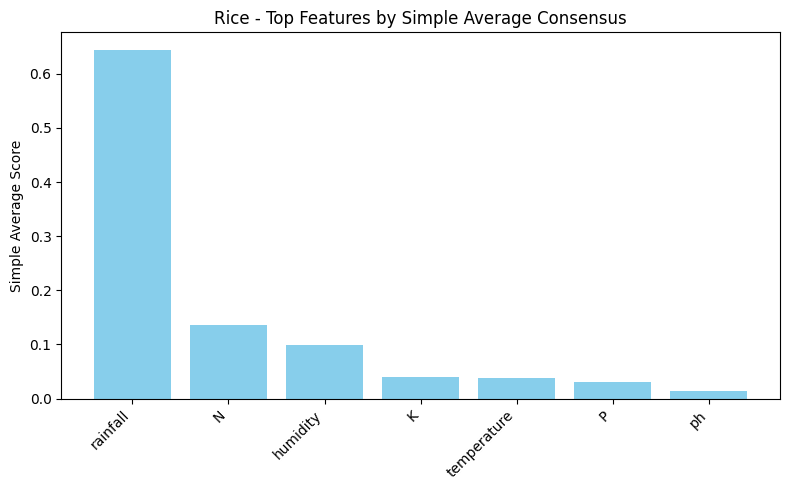

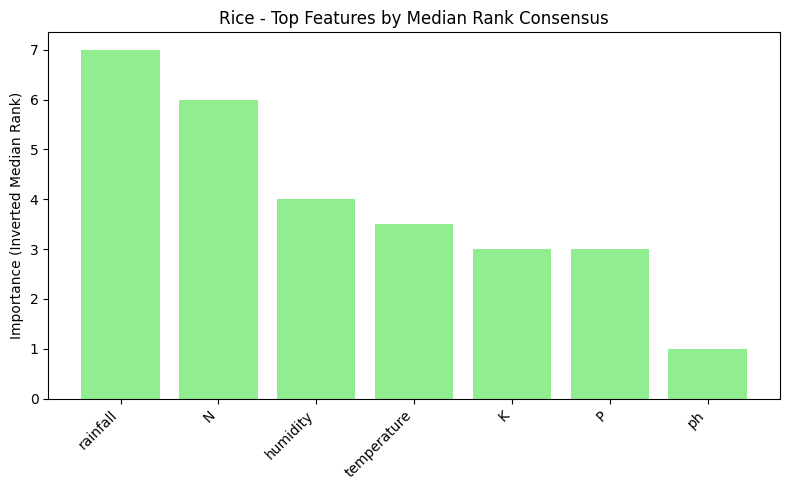

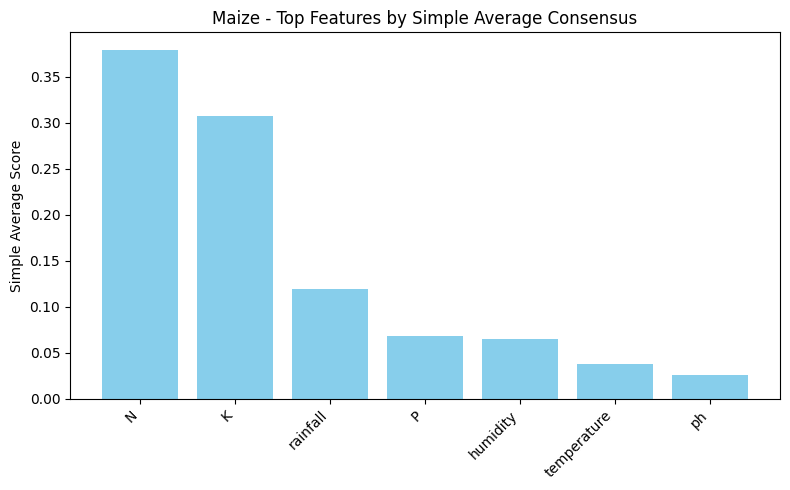

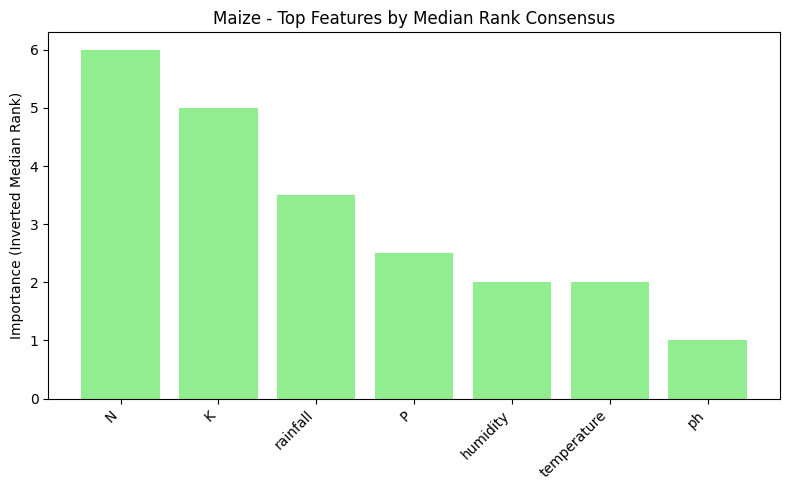

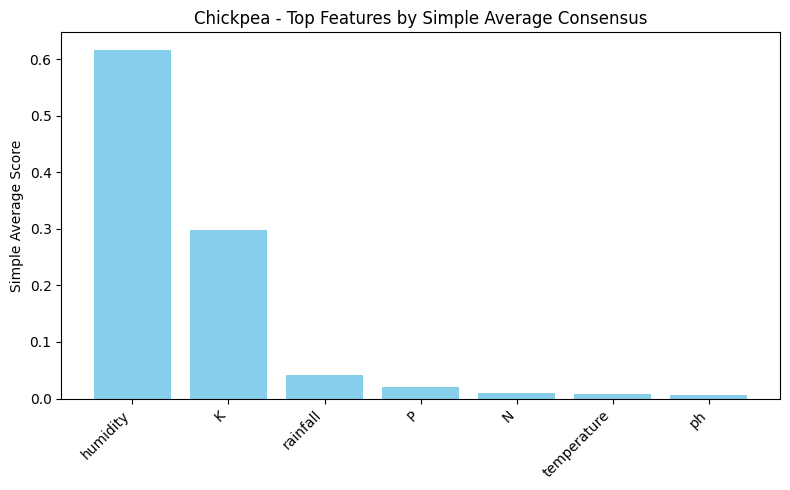

...

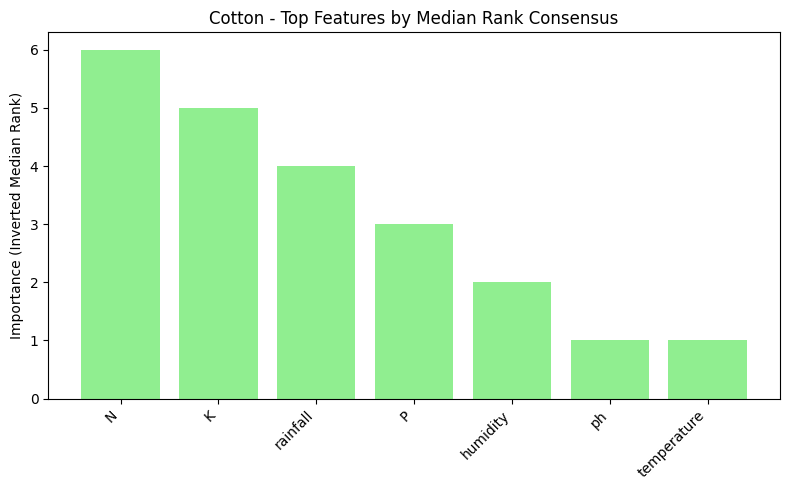

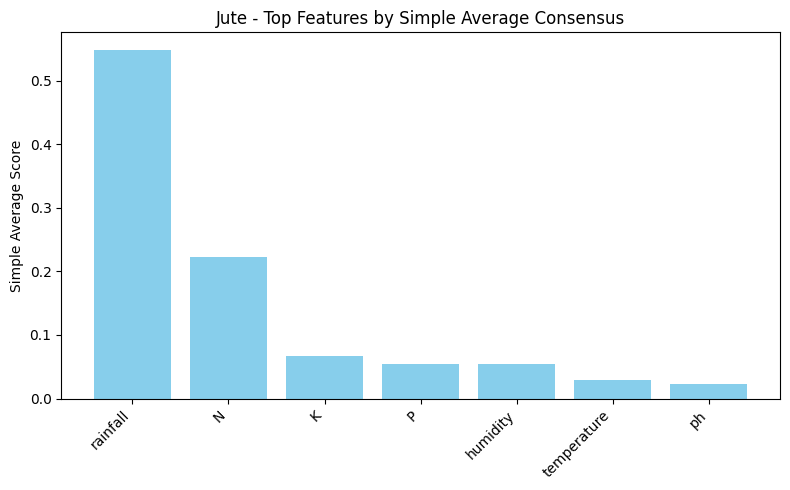

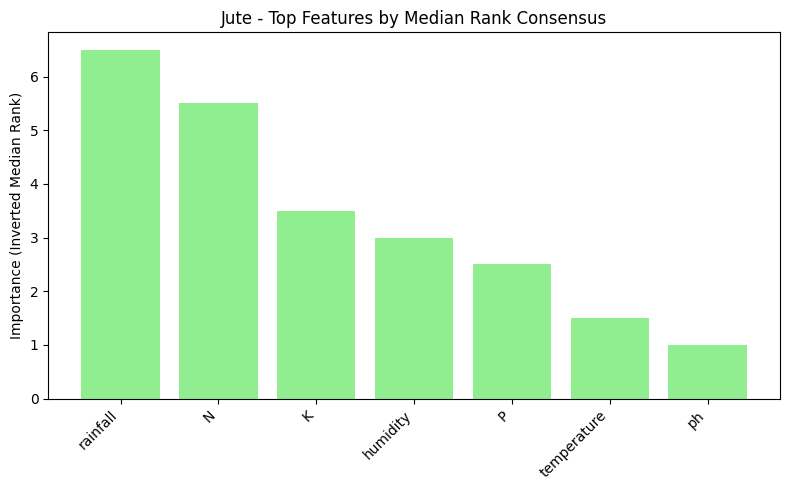

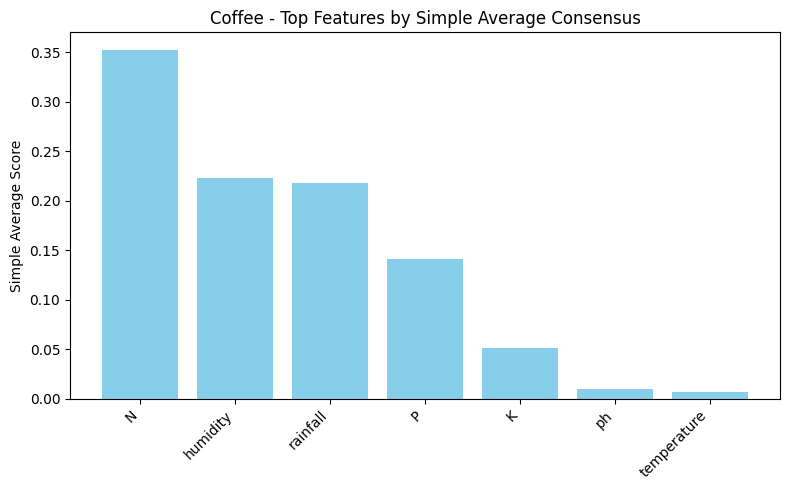

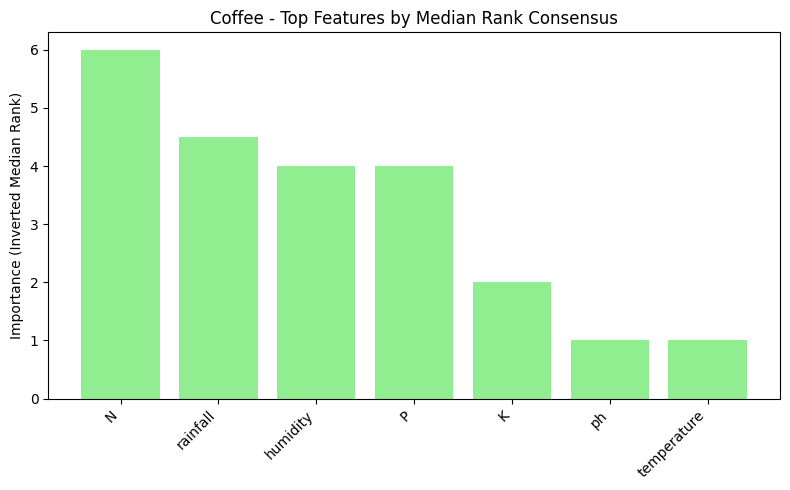

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# ==============================
# Crop list
# ==============================
crops = [
    "rice", "maize", "chickpea", "kidneybeans", "pigeonpeas", "mothbeans",
    "mungbean", "blackgram", "lentil", "pomegranate", "banana", "mango",
    "grapes", "watermelon", "muskmelon", "apple", "orange", "papaya",
    "coconut", "cotton", "jute", "coffee"
]

base_dir = "/content/drive/MyDrive"

# ==============================
# Loop over all crops
# ==============================
for crop in crops:
    consensus_path = os.path.join(base_dir, f"{crop}_feature_importance_consensus_balanced.csv")

    if not os.path.exists(consensus_path):
        print(f"❌ Consensus CSV not found for crop: {crop}")
        continue

    try:
        df = pd.read_csv(consensus_path)

        # ------------------------------
        # 1. Bar chart for Simple Average Score
        # ------------------------------
        top_simple_avg = df.sort_values(by="Simple_Avg_Score", ascending=False).head(10)

        plt.figure(figsize=(8, 5))
        plt.bar(top_simple_avg["Feature"], top_simple_avg["Simple_Avg_Score"], color="skyblue")
        plt.xticks(rotation=45, ha="right")
        plt.ylabel("Simple Average Score")
        plt.title(f"{crop.capitalize()} - Top Features by Simple Average Consensus")
        plt.tight_layout()
        plt.show()

        # ------------------------------
        # 2. Bar chart for Median Rank (inverted for visual clarity)
        # ------------------------------
        df["Median_Rank_Inverted"] = df["Median_Rank"].max() - df["Median_Rank"] + 1
        top_median_rank = df.sort_values(by="Median_Rank", ascending=True).head(10)

        plt.figure(figsize=(8, 5))
        plt.bar(top_median_rank["Feature"],
                df.loc[top_median_rank.index, "Median_Rank_Inverted"],
                color="lightgreen")
        plt.xticks(rotation=45, ha="right")
        plt.ylabel("Importance (Inverted Median Rank)")
        plt.title(f"{crop.capitalize()} - Top Features by Median Rank Consensus")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"⚠️ Error processing {crop}: {e}")


Hybrid recommender system